In [1]:
import numpy as np
import pandas as pd
import warnings

# --- 1. Import Models ---
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.svm import SVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

# --- 2. Import GPR Kernels ---
# Import the kernel objects you want to test
from sklearn.gaussian_process.kernels import RBF, Matern, RationalQuadratic

# --- 3. Import the Workflow ---
# This assumes 'armote.py' is in the same directory as this script
try:
    from armote_cv import run_workflow
except ImportError:
    print("="*80)
    print("ERROR: 'armote.py' not found.")
    print("Please make sure 'armote.py' is in the same directory as this run script.")
    print("="*80)
    exit()

In [2]:
# Suppress common warnings from scikit-learn/Keras for a cleaner log
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [3]:
df = pd.read_excel('Grain_Size_Summary_v3.xlsx')
df.head()

,Alloy Name,Al,Co,Cr,Cu,Fe,Mn,Ni,V,"Hardness, HV","SD, HV",YS (MPa),"SD, YS",Cold Work (%Reduction),Recrystallization Temp(℃),Holding time (h),Grain Size(µm),"SD, Grain Size(µm)"
0,BBA01,4,8.0,4,4,16.0,12,48.0,4,140.2,3.8,284.2,34.3,60,950,0.5,23.00,13.00
1,BBA02,4,16.0,0,4,12.0,8,52.0,4,151.5,5.7,301.0,6.6,60,950,0.5,31.94,18.45
2,BBA03,4,12.0,8,4,16.0,8,48.0,0,128.9,3.1,217.6,4.8,60,950,0.5,39.92,24.35
3,BBA05,4,12.0,8,0,8.0,8,56.0,4,157.8,3.7,313.1,5.7,60,950,0.5,33.83,22.49
4,BBA06,4,0.0,8,4,24.0,12,44.0,4,118.6,2.1,230.5,3.6,60,950,0.5,46.40,29.77


In [4]:
# Composition columns
composition_cols = ['Al', 'Co', 'Cr', 'Cu', 'Fe', 'Mn', 'Ni', 'V']

# Processing columns
processing_cols = [
    'Cold Work (%Reduction)', 
    'Recrystallization Temp(℃)', 
    'Holding time (h)'
    ]

# Grain size column
grain_size_col = ['Grain Size(µm)']

# Feature columns
feature_cols = composition_cols + processing_cols + grain_size_col

# Target columns
target_cols = ['YS (MPa)', 'Hardness, HV']

In [5]:
#--- Prepare Input (X) and Output (y) DataFrames ---
X = df[feature_cols].copy()
y = df[target_cols].copy()

print(f"Data loaded successfully. Found {X.shape[0]} samples.")
print(f"Features (X shape): {X.shape}")
print(f"Targets (y shape): {y.shape}")

Data loaded successfully. Found 94 samples.
Features (X shape): (94, 12)
Targets (y shape): (94, 2)


In [6]:
# --- Handle Missing Values ---
print("\n" + "-"*30)
print("Checking for missing data (NaNs)...")
# Combine X and y to ensure we drop the same rows from both
full_data = pd.concat([X, y], axis=1)
initial_rows = full_data.shape[0]
nan_rows = full_data.isna().any(axis=1).sum()

if nan_rows > 0:
    print(f"Found {nan_rows} rows with one or more NaN values. Dropping them...")
    # Drop all rows that have a NaN in *any* column (X or y)
    full_data_cleaned = full_data.dropna()
    final_rows = full_data_cleaned.shape[0]
    
    # Re-split into X and y
    X_cleaned = full_data_cleaned[feature_cols]
    y_cleaned = full_data_cleaned[target_cols]
    
    print(f"Dropped {initial_rows - final_rows} rows.")
    print(f"Proceeding with {final_rows} complete samples.")
else:
    print("No missing data found.")
    X_cleaned = X
    y_cleaned = y
print("-"*30 + "\n")


------------------------------
Checking for missing data (NaNs)...
Found 1 rows with one or more NaN values. Dropping them...
Dropped 1 rows.
Proceeding with 93 complete samples.
------------------------------



In [7]:
# --- Define Models to Run ---
models_to_run = {
    "LinearRegression": LinearRegression(),
    "BayesianRidge": BayesianRidge(),
    "SVR": SVR(),
    "DecisionTree": DecisionTreeRegressor(random_state=42),
    "RandomForest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42, n_jobs=-1),
    "GPR": GaussianProcessRegressor(random_state=42, n_restarts_optimizer=9),  # Must be named "GPR"
    "NNR": None,                                     # Must be named "NNR"
}

# --- Define GPR Kernel Map ---
# This dictionary is passed to armote.py
# The keys (e.g., "RBF_1", "Matern_1.5") are your custom names
# which MUST match the 'categorical' list for "GPR" in param_spaces_to_run.
my_custom_kernels = {
    "RBF_default": RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2)),
    "Matern_nu_0.5": Matern(length_scale=1.0, nu=0.5, length_scale_bounds=(1e-2, 1e2)),
    "Matern_nu_1.5": Matern(length_scale=1.0, nu=1.5, length_scale_bounds=(1e-2, 1e2)),
    "Matern_nu_2.5": Matern(length_scale=1.0, nu=2.5, length_scale_bounds=(1e-2, 1e2)),
    "RationalQuadratic": RationalQuadratic(length_scale=1.0, alpha=0.1, 
                                           length_scale_bounds=(1e-2, 1e2), 
                                           alpha_bounds=(1e-2, 1e2))
}

# --- Define Hyperparameter Search Spaces ---
param_spaces_to_run = {
    "LinearRegression": None,  # No tuning
    
    "BayesianRidge": {
        "max_iter": ("int", 100, 500),  
        "alpha_1": ("float", 1e-7, 1e-5, "log"),
        "alpha_2": ("float", 1e-7, 1e-5, "log"), 
        "lambda_1": ("float", 1e-7, 1e-5, "log"),
        "lambda_2": ("float", 1e-7, 1e-5, "log"),
    },
    
    "SVR": {
        "C": ("float", 0.1, 10002, "log"),
        "gamma": ("float", 1e-4, 1.0, "log"),
        "epsilon": ("float", 1e-3, 0.5, "log"),
    },
    
    "DecisionTree": {
        "max_depth": ("int", 5, 50),
        "min_samples_split": ("int", 2, 20),
        "min_samples_leaf": ("int", 1, 20),
    },
    
    "RandomForest": {
        "n_estimators": ("int", 50, 200),
        "max_depth": ("int", 5, 50),
        "min_samples_split": ("int", 2, 20),
        "min_samples_leaf": ("int", 1, 10),
    },
    
    "XGBoost": {
        "n_estimators": ("int", 50, 200),
        "learning_rate": ("float", 0.01, 0.5, "log"),
        "max_depth": ("int", 3, 10),
        "subsample": ("float", 0.6, 1.0),
        "colsample_bytree": ("float", 0.6, 1.0),
    },
    
    "GPR": {
        "kernel": ("categorical", list(my_custom_kernels.keys())),
        "alpha": ("float", 1e-10, 1e-1, "log"),
    },
    
    "NNR": {
        "hidden_layers": ("int", 1, 4),
        "units": ("int", 32, 128), # Units in the *first* hidden layer
        "activation": ("categorical", ["relu", "tanh", "selu"]),
        "learning_rate": ("float", 1e-5, 1e-2, "log"),
    }
}


STARTING ALL WORKFLOWS


============================== Processing Target: YS (MPa) ==============================
All outputs will be saved to: 'YS__MPa_Results_v3_5_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'YS__MPa_Results_v3_5_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
LinearRegression_YS (MPa)_x_scaler_fold_0.pkl and LinearRegression_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model f

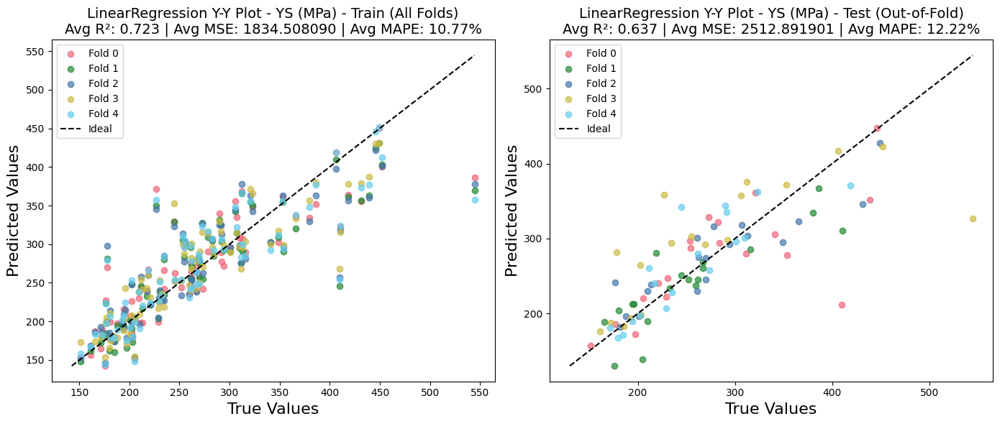

[I 2026-02-17 19:22:14,362] A new study created in memory with name: no-name-2c5d8b76-7f3c-419e-bb1c-458c253bda4c



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:22:20,765] Trial 4 finished with values: [0.40776402736599165, 0.4865806436981049] and parameters: {'max_iter': 399, 'alpha_1': 3.1694078816288925e-06, 'alpha_2': 8.454606434956687e-06, 'lambda_1': 1.5731508462535776e-06, 'lambda_2': 3.509503820255845e-07}.
[I 2026-02-17 19:22:20,806] Trial 13 finished with values: [0.4077638819089072, 0.48658081169569256] and parameters: {'max_iter': 189, 'alpha_1': 1.2414187744821276e-06, 'alpha_2': 7.76367487213015e-07, 'lambda_1': 5.9292514386250895e-06, 'lambda_2': 1.3470784871622131e-06}.
[I 2026-02-17 19:22:20,811] Trial 1 finished with values: [0.40776380298394244, 0.4865809065485722] and parameters: {'max_iter': 154, 'alpha_1': 1.463770801469201e-07, 'alpha_2': 3.897278965134577e-07, 'lambda_1': 7.91043071477703e-06, 'lambda_2': 3.384520186353283e-07}.
[I 2026-02-17 19:22:20,814] Trial 12 finished with values: [0.4077638819089072, 0.48658081169569256] and parameters: {'max_iter': 280, 'alpha_1': 4.3807545080230667e-07, 'alpha_

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_5_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_0.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_5_Fold_CV\models\BayesianRidge_YS (MPa)_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_1.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fo

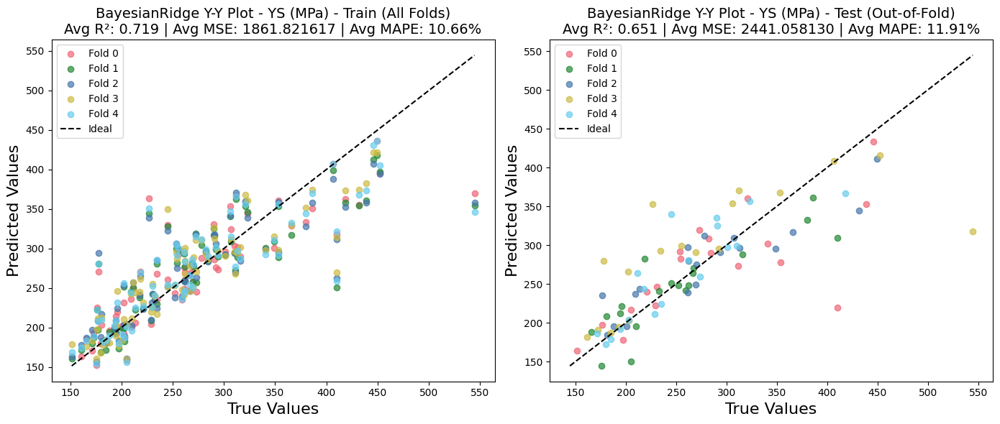

[I 2026-02-17 19:22:28,665] A new study created in memory with name: no-name-ea3c6067-e15f-4367-8e6f-9c595f0d9053



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:22:28,832] Trial 0 finished with values: [0.507969138631651, 0.3435059756694474] and parameters: {'C': 1659.1610733807072, 'gamma': 0.012432640593835385, 'epsilon': 0.0030127134088732206}.
[I 2026-02-17 19:22:28,837] Trial 1 finished with values: [0.5353855772872729, 0.35759310891733964] and parameters: {'C': 9.234393086148094, 'gamma': 0.004520628554773905, 'epsilon': 0.019112310234266214}.
[I 2026-02-17 19:22:28,895] Trial 3 finished with values: [0.7502557021940948, 0.04201295103248457] and parameters: {'C': 0.550639735123627, 'gamma': 0.0005121424844673222, 'epsilon': 0.0014854423085781203}.
[I 2026-02-17 19:22:28,910] Trial 2 finished with values: [0.7502557021940948, 0.04201295103248457] and parameters: {'C': 9317.246811246063, 'gamma': 0.00010191410678899799, 'epsilon': 0.015494451600515359}.
[I 2026-02-17 19:22:28,982] Trial 4 finished with values: [1.1892452862718705, -0.5714802740203508] and parameters: {'C': 15.652602146074603, 'gamma': 0.0001719731486208890

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_5_Fold_CV\plots' directory.

--- SVR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
SVR_YS (MPa)_x_scaler_fold_0.pkl and SVR_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.001 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_5_Fold_CV\models\SVR_YS (MPa)_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
SVR_YS (MPa)_x_scaler_fold_1.pkl and SVR_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.001 seconds.
Saving model for SVR from Fold 1...
Best model for SVR for YS (

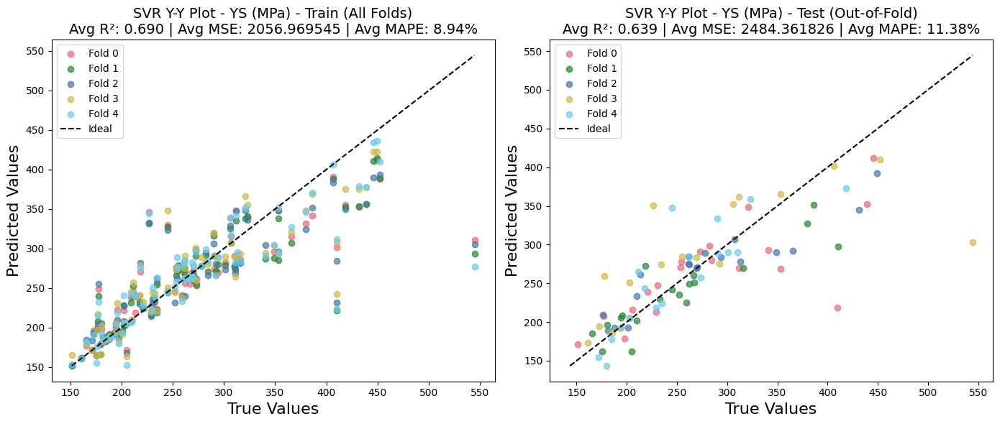

[I 2026-02-17 19:22:36,023] A new study created in memory with name: no-name-3b44edc1-6113-419d-a7bd-f125a46e89b6



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:22:36,254] Trial 0 finished with values: [0.707628926240422, 0.16678043908904883] and parameters: {'max_depth': 28, 'min_samples_split': 9, 'min_samples_leaf': 15}.
[I 2026-02-17 19:22:36,279] Trial 1 finished with values: [0.6935625094487612, 0.18783576661942938] and parameters: {'max_depth': 46, 'min_samples_split': 12, 'min_samples_leaf': 18}.
[I 2026-02-17 19:22:36,314] Trial 2 finished with values: [0.6309580940750129, 0.1609991718266545] and parameters: {'max_depth': 10, 'min_samples_split': 16, 'min_samples_leaf': 10}.
[I 2026-02-17 19:22:36,314] Trial 12 finished with values: [0.7373078140658196, 0.0825169312819333] and parameters: {'max_depth': 31, 'min_samples_split': 20, 'min_samples_leaf': 4}.
[I 2026-02-17 19:22:36,314] Trial 16 finished with values: [0.5479496144048551, 0.25172968837385384] and parameters: {'max_depth': 28, 'min_samples_split': 12, 'min_samples_leaf': 14}.
[I 2026-02-17 19:22:36,314] Trial 10 finished with values: [0.7373078140658196, 0.0

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_5_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
DecisionTree_YS (MPa)_x_scaler_fold_0.pkl and DecisionTree_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.002 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_5_Fold_CV\models\DecisionTree_YS (MPa)_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
DecisionTree_YS (MPa)_x_scaler_fold_1.pkl and DecisionTree_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model 

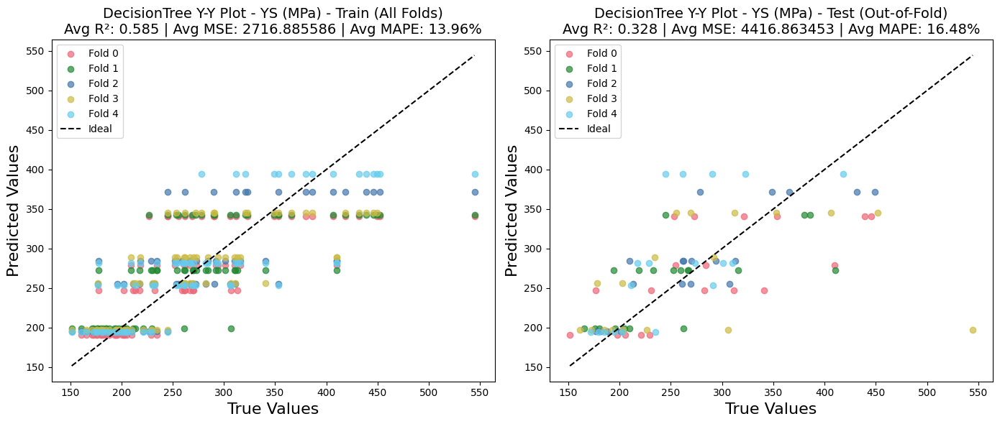

[I 2026-02-17 19:22:42,264] A new study created in memory with name: no-name-839ea470-df0c-4b2b-8dff-19a2f27cf1ca



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:22:42,880] Trial 0 finished with values: [0.5288019647879649, 0.35251017891327524] and parameters: {'n_estimators': 191, 'max_depth': 6, 'min_samples_split': 20, 'min_samples_leaf': 6}.
[I 2026-02-17 19:22:43,001] Trial 2 finished with values: [0.5355596426421608, 0.32617121650748493] and parameters: {'n_estimators': 192, 'max_depth': 48, 'min_samples_split': 13, 'min_samples_leaf': 7}.
[I 2026-02-17 19:22:43,004] Trial 1 finished with values: [0.5355596426421608, 0.32617121650748493] and parameters: {'n_estimators': 132, 'max_depth': 31, 'min_samples_split': 13, 'min_samples_leaf': 3}.
[I 2026-02-17 19:22:43,049] Trial 4 finished with values: [0.5164681170401164, 0.3725758108326375] and parameters: {'n_estimators': 130, 'max_depth': 26, 'min_samples_split': 9, 'min_samples_leaf': 8}.
[I 2026-02-17 19:22:43,498] Trial 3 finished with values: [0.4977360744911751, 0.39044939839727066] and parameters: {'n_estimators': 152, 'max_depth': 22, 'min_samples_split': 16, 'min_sa

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_5_Fold_CV\plots' directory.

--- RandomForest - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
RandomForest_YS (MPa)_x_scaler_fold_0.pkl and RandomForest_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.157 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_5_Fold_CV\models\RandomForest_YS (MPa)_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
RandomForest_YS (MPa)_x_scaler_fold_1.pkl and RandomForest_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model 

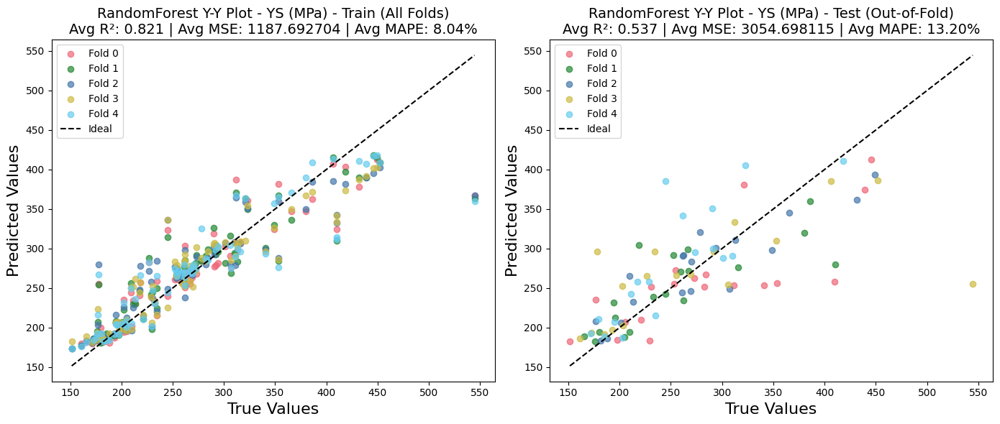

[I 2026-02-17 19:23:00,153] A new study created in memory with name: no-name-63b7e44a-8804-4e9a-8ea4-95f5a9ddcf3a



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:23:01,733] Trial 1 finished with values: [0.4968681195197749, 0.3792435427544835] and parameters: {'n_estimators': 176, 'learning_rate': 0.013849158900614616, 'max_depth': 8, 'subsample': 0.7096519528302276, 'colsample_bytree': 0.7979064341845976}.
[I 2026-02-17 19:23:01,741] Trial 6 finished with values: [0.5339846541546512, 0.35568372919993363] and parameters: {'n_estimators': 115, 'learning_rate': 0.02799652422598905, 'max_depth': 5, 'subsample': 0.9530937630205796, 'colsample_bytree': 0.7541339683348871}.
[I 2026-02-17 19:23:01,785] Trial 4 finished with values: [0.502635335505623, 0.350404049151724] and parameters: {'n_estimators': 106, 'learning_rate': 0.017538306458581645, 'max_depth': 6, 'subsample': 0.6721736927458276, 'colsample_bytree': 0.807815458234264}.
[I 2026-02-17 19:23:01,879] Trial 2 finished with values: [0.5643990963944873, 0.29226022830815684] and parameters: {'n_estimators': 183, 'learning_rate': 0.04775462862734033, 'max_depth': 5, 'subsample': 

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_5_Fold_CV\plots' directory.

--- XGBoost - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
XGBoost_YS (MPa)_x_scaler_fold_0.pkl and XGBoost_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.174 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_5_Fold_CV\models\XGBoost_YS (MPa)_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
XGBoost_YS (MPa)_x_scaler_fold_1.pkl and XGBoost_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.032 seconds.
Saving model for XG

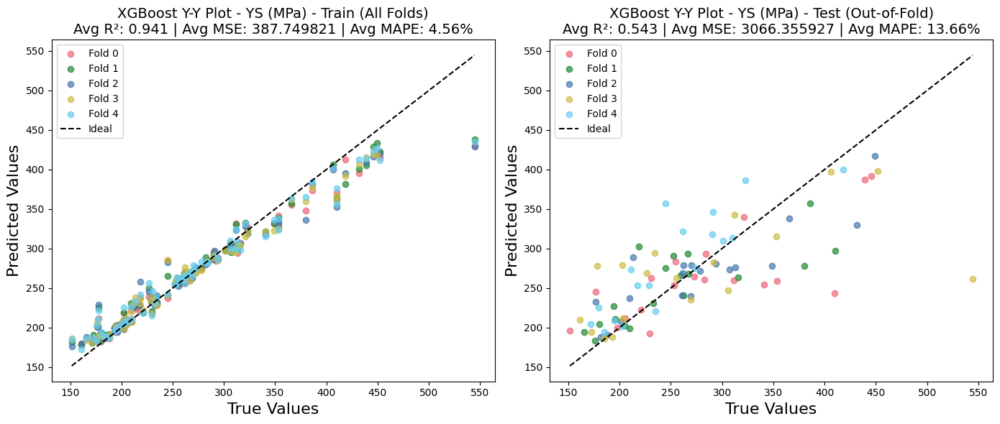

[I 2026-02-17 19:23:11,488] A new study created in memory with name: no-name-24dbded9-a3cd-475c-8cd4-ecd49687d955



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:23:11,632] Trial 0 finished with values: [0.5055275342128999, 0.38475250551299256] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-17 19:23:11,754] Trial 1 finished with values: [0.4181461077667737, 0.4773000653046056] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-17 19:23:11,867] Trial 2 finished with values: [0.831516130421984, -0.015784371366995197] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-17 19:23:11,993] Trial 3 finished with values: [0.8311043729546352, -0.01536896888589201] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-17 19:23:12,095] Trial 4 finished with values: [0.5055277247348748, 0.3847522811877834] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-17 19:23:12,324] Trial 5 finished with values: [0.569452859899062, 0.3034651383904034] and parameters: {'k

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_5_Fold_CV\plots' directory.

--- GPR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
GPR_YS (MPa)_x_scaler_fold_0.pkl and GPR_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.081 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_5_Fold_CV\models\GPR_YS (MPa)_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
GPR_YS (MPa)_x_scaler_fold_1.pkl and GPR_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.118 seconds.
Saving model for GPR from Fold 1...
Best model for GPR for YS (

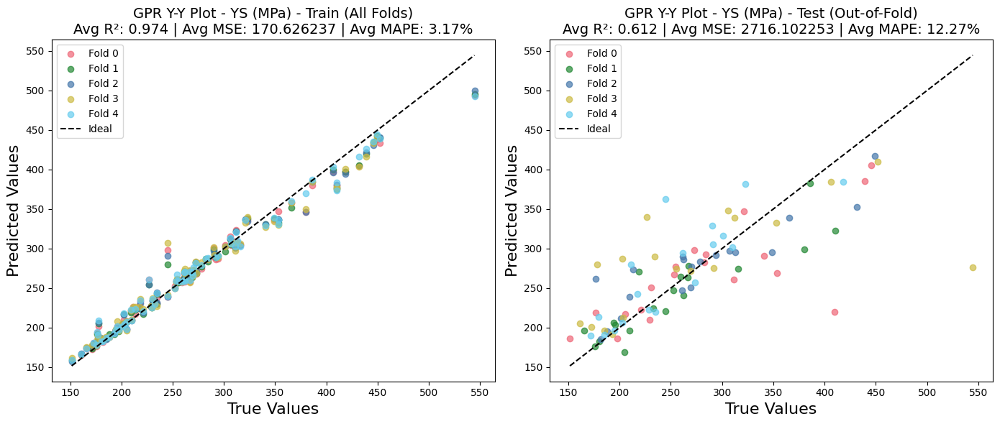

[I 2026-02-17 19:23:30,067] A new study created in memory with name: no-name-2145104b-820e-4e8c-ae5a-0c46dd20a6ed



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 56ms/step
[I 2026-02-17 19:23:58,910] Trial 0 finished with values: [0.3993523615330599, 0.61966757254326] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 44ms/step
[I 2026-02-17 19:24:18,667] Trial 1 finished with values: [0.575436457686308, 0.4144665823277503] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 57ms/step
[I 2026-02-17 19:24:44,740] Trial 2 finished with values: [0.5392371615702047, 0.47612545729719236] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 47ms/step
[I 2026-02-17 19:25:07,471] Trial 3 finished with values: [0.49122895986619425, 0.546558119255744] and parameters: {'hidden_layers': 2, 'units': 60, 'activ

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_5_Fold_CV\plots' directory.

--- NNR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
NNR_YS (MPa)_x_scaler_fold_0.pkl and NNR_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 3.432 seconds.
1/1 [==============================] - 0s 22ms/step
Saving model for NNR from Fold 0...
Best model for NNR for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_5_Fold_CV\models\NNR_YS (MPa)_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
NNR_YS (MPa)_x_scaler_fold_1.pkl and NNR_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 3.321 seconds.
1/1 [====

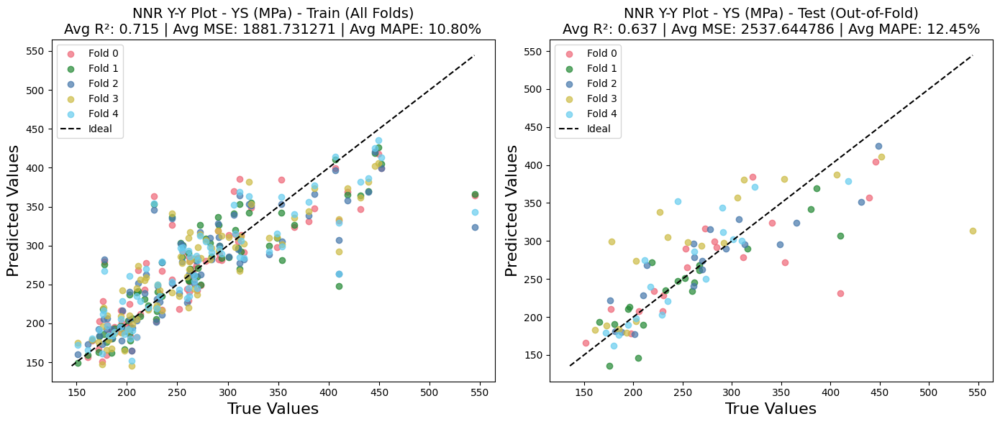


--- Workflow Complete ---
Final 5-fold CV results summary for YS (MPa) saved to YS__MPa_Results_v3_5_Fold_CV\YS (MPa)_results_5_fold_CV.csv

============================== Completed Workflow for: YS (MPa) ==============================


============================== Processing Target: Hardness, HV ==============================
All outputs will be saved to: 'Hardness_HV_Results_v3_5_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'Hardness_HV_Results_v3_5_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
LinearRegression_Hardness, HV_x_scaler

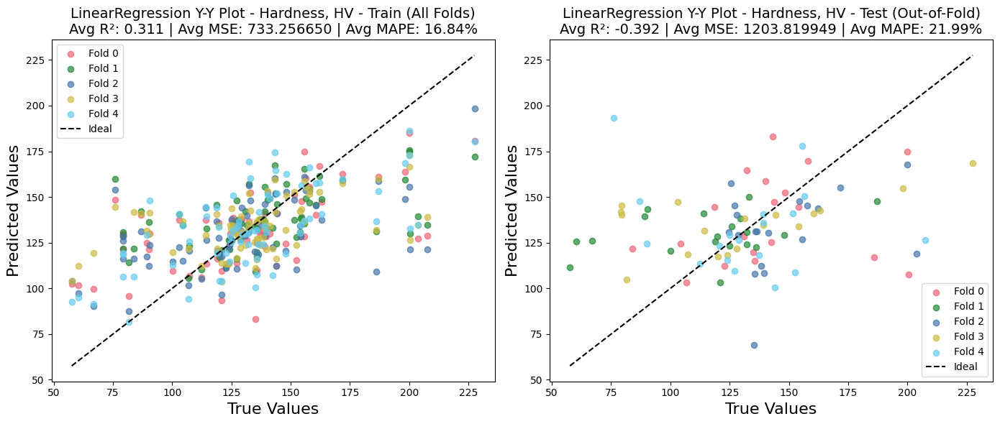

[I 2026-02-17 19:54:02,749] A new study created in memory with name: no-name-369e7621-a4ad-461e-a88b-28f066244416



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:54:09,373] Trial 0 finished with values: [1.7827473283870934, -2.3949152313342923] and parameters: {'max_iter': 244, 'alpha_1': 3.0201712414560464e-06, 'alpha_2': 2.588162875476307e-06, 'lambda_1': 1.1851571610910465e-06, 'lambda_2': 1.7690842426016205e-07}.
[I 2026-02-17 19:54:09,510] Trial 6 finished with values: [1.782740735100114, -2.3949018138093723] and parameters: {'max_iter': 299, 'alpha_1': 2.348006979994354e-07, 'alpha_2': 8.742346910008145e-07, 'lambda_1': 1.611651828648435e-07, 'lambda_2': 8.578277121044824e-07}.
[I 2026-02-17 19:54:09,546] Trial 7 finished with values: [1.782740735100114, -2.3949018138093723] and parameters: {'max_iter': 141, 'alpha_1': 2.0248321059206025e-07, 'alpha_2': 2.294411019267563e-07, 'lambda_1': 3.0250901663653805e-06, 'lambda_2': 1.8928879670149825e-06}.
[I 2026-02-17 19:54:09,573] Trial 4 finished with values: [1.782740735100114, -2.3949018138093723] and parameters: {'max_iter': 184, 'alpha_1': 3.5886599001599145e-07, 'alpha_2'

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_0.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.003 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_5_Fold_CV\models\BayesianRidge_Hardness, HV_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_1.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the fin

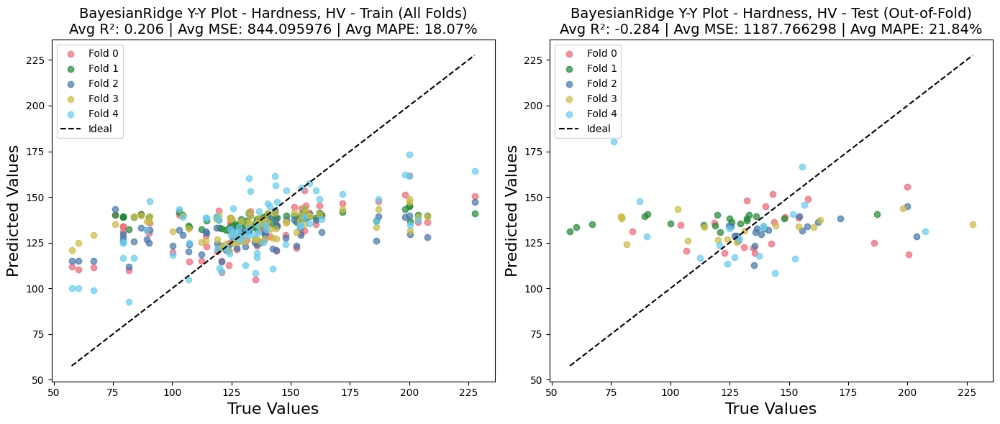

[I 2026-02-17 19:54:17,024] A new study created in memory with name: no-name-93234706-d84b-4d25-b134-cd569ff82bf9



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:54:17,148] Trial 0 finished with values: [1.650172631542826, -2.1043004264547416] and parameters: {'C': 1.3950161210656575, 'gamma': 0.002492200325637962, 'epsilon': 0.026746776859958514}.
[I 2026-02-17 19:54:17,182] Trial 1 finished with values: [1.4752750313614136, -1.7636185063226932] and parameters: {'C': 3.83269269437847, 'gamma': 0.3465400771088386, 'epsilon': 0.005398854454791269}.
[I 2026-02-17 19:54:17,213] Trial 4 finished with values: [2.074647591956354, -3.027841421602416] and parameters: {'C': 40.54796297279621, 'gamma': 0.002424734298720887, 'epsilon': 0.008131844368930215}.
[I 2026-02-17 19:54:17,217] Trial 3 finished with values: [1.830526803408479, -2.4137482528699437] and parameters: {'C': 1869.463088269228, 'gamma': 0.03717088080589485, 'epsilon': 0.0030986777656441446}.
[I 2026-02-17 19:54:17,217] Trial 2 finished with values: [1.830526803408479, -2.4137482528699437] and parameters: {'C': 17.891310311698827, 'gamma': 0.6585925424152185, 'epsilon': 0

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- SVR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
SVR_Hardness, HV_x_scaler_fold_0.pkl and SVR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.002 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_5_Fold_CV\models\SVR_Hardness, HV_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
SVR_Hardness, HV_x_scaler_fold_1.pkl and SVR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.000 seconds.
Saving model for SV

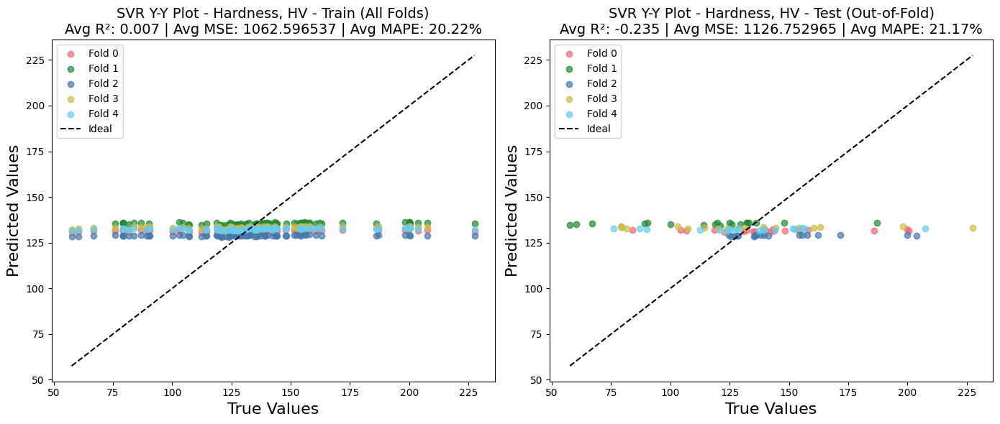

[I 2026-02-17 19:54:23,462] A new study created in memory with name: no-name-75d89608-bab7-49a1-ab28-7f75647f6743



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:54:23,731] Trial 0 finished with values: [1.7237752175933339, -2.367242028512418] and parameters: {'max_depth': 45, 'min_samples_split': 3, 'min_samples_leaf': 18}.
[I 2026-02-17 19:54:23,743] Trial 2 finished with values: [1.801743759634054, -2.458419954453908] and parameters: {'max_depth': 12, 'min_samples_split': 10, 'min_samples_leaf': 3}.
[I 2026-02-17 19:54:23,759] Trial 1 finished with values: [2.2570928057839694, -3.2371255845520173] and parameters: {'max_depth': 14, 'min_samples_split': 4, 'min_samples_leaf': 17}.
[I 2026-02-17 19:54:23,777] Trial 3 finished with values: [2.0018755664600514, -2.8854587178324906] and parameters: {'max_depth': 39, 'min_samples_split': 18, 'min_samples_leaf': 11}.
[I 2026-02-17 19:54:23,811] Trial 16 finished with values: [2.0920531003894682, -2.9698216351531763] and parameters: {'max_depth': 8, 'min_samples_split': 9, 'min_samples_leaf': 20}.
[I 2026-02-17 19:54:23,811] Trial 9 finished with values: [1.9235435476587859, -2.68317

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
DecisionTree_Hardness, HV_x_scaler_fold_0.pkl and DecisionTree_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_5_Fold_CV\models\DecisionTree_Hardness, HV_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
DecisionTree_Hardness, HV_x_scaler_fold_1.pkl and DecisionTree_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model wi

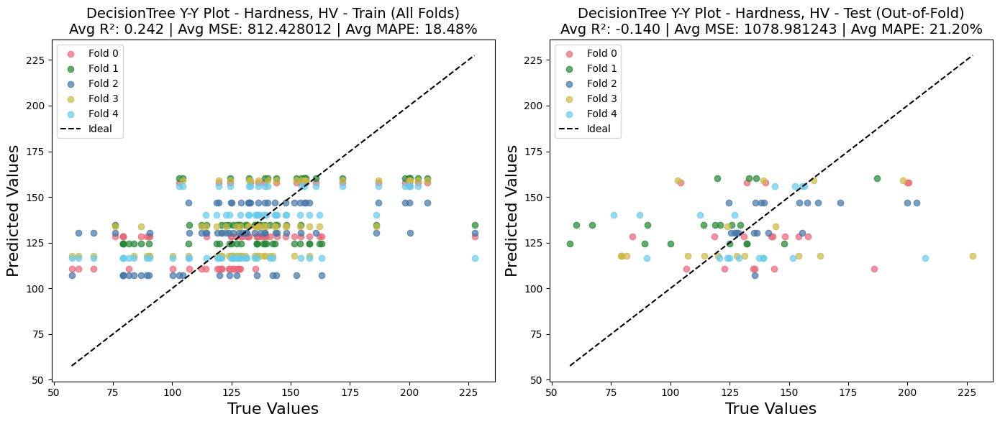

[I 2026-02-17 19:54:29,190] A new study created in memory with name: no-name-3fbdf1a7-a0cc-4f49-8239-294548f1badb



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:54:29,605] Trial 1 finished with values: [1.7159258471128631, -2.2341908183675434] and parameters: {'n_estimators': 158, 'max_depth': 25, 'min_samples_split': 18, 'min_samples_leaf': 7}.
[I 2026-02-17 19:54:29,784] Trial 0 finished with values: [1.642744634178536, -2.116562007985649] and parameters: {'n_estimators': 117, 'max_depth': 22, 'min_samples_split': 10, 'min_samples_leaf': 3}.
[I 2026-02-17 19:54:29,980] Trial 2 finished with values: [1.5595896276447492, -1.9699375389948137] and parameters: {'n_estimators': 172, 'max_depth': 41, 'min_samples_split': 19, 'min_samples_leaf': 1}.
[I 2026-02-17 19:54:30,253] Trial 3 finished with values: [1.688535035346444, -2.205069758671938] and parameters: {'n_estimators': 81, 'max_depth': 5, 'min_samples_split': 18, 'min_samples_leaf': 3}.
[I 2026-02-17 19:54:30,500] Trial 4 finished with values: [1.5985456291964284, -2.0387659159622737] and parameters: {'n_estimators': 138, 'max_depth': 33, 'min_samples_split': 15, 'min_sampl

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- RandomForest - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
RandomForest_Hardness, HV_x_scaler_fold_0.pkl and RandomForest_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.075 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_5_Fold_CV\models\RandomForest_Hardness, HV_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
RandomForest_Hardness, HV_x_scaler_fold_1.pkl and RandomForest_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model wi

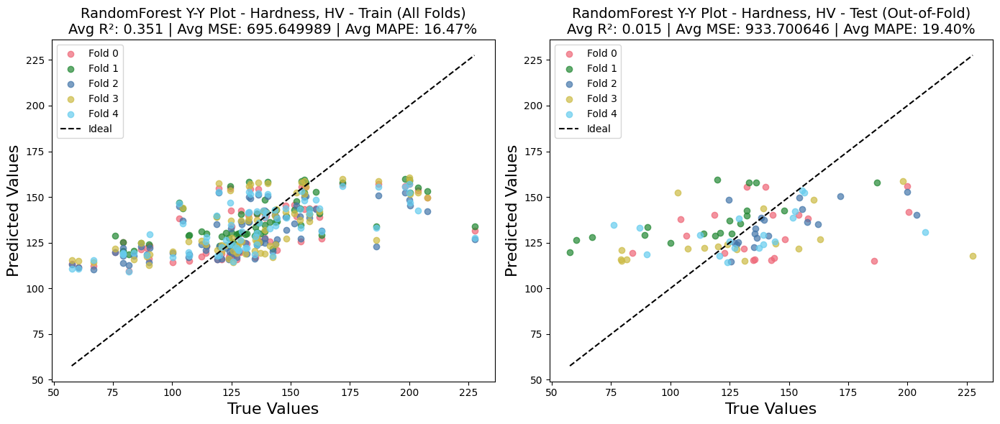

[I 2026-02-17 19:54:43,386] A new study created in memory with name: no-name-bd2ed20b-a536-4363-9b45-a7305deecd79



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:54:44,985] Trial 1 finished with values: [2.1479674077686215, -3.2337629331828475] and parameters: {'n_estimators': 191, 'learning_rate': 0.30894704982053234, 'max_depth': 7, 'subsample': 0.6743899637295192, 'colsample_bytree': 0.9050594536513377}.
[I 2026-02-17 19:54:45,008] Trial 8 finished with values: [1.6780753405194702, -2.237182881268459] and parameters: {'n_estimators': 152, 'learning_rate': 0.39151078777018944, 'max_depth': 10, 'subsample': 0.8912964385443114, 'colsample_bytree': 0.7601577963848933}.
[I 2026-02-17 19:54:45,015] Trial 3 finished with values: [1.9220717384217667, -2.7502722135941244] and parameters: {'n_estimators': 195, 'learning_rate': 0.01502943676812581, 'max_depth': 6, 'subsample': 0.6465503351388121, 'colsample_bytree': 0.8588411947723018}.
[I 2026-02-17 19:54:45,098] Trial 5 finished with values: [1.6780753405194702, -2.237182881268459] and parameters: {'n_estimators': 59, 'learning_rate': 0.17905536974068714, 'max_depth': 10, 'subsample'

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- XGBoost - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
XGBoost_Hardness, HV_x_scaler_fold_0.pkl and XGBoost_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.026 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_5_Fold_CV\models\XGBoost_Hardness, HV_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
XGBoost_Hardness, HV_x_scaler_fold_1.pkl and XGBoost_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training co

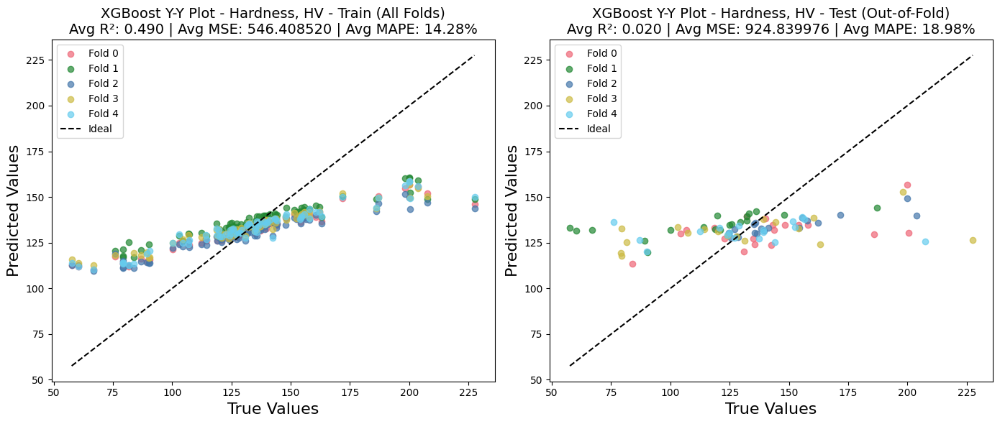

[I 2026-02-17 19:54:53,814] A new study created in memory with name: no-name-f9074f85-0dce-408d-bca5-c7f4df159561



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 19:54:53,956] Trial 0 finished with values: [1.7722591930110199, -2.3987414328142185] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-17 19:54:54,058] Trial 1 finished with values: [1.7430640782754232, -2.341726936990038] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-17 19:54:54,159] Trial 2 finished with values: [1.873520725041661, -2.6134215505207594] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-17 19:54:54,275] Trial 3 finished with values: [1.8413839355252193, -2.5477318466913266] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-17 19:54:54,367] Trial 4 finished with values: [1.7722591972734612, -2.39874143724875] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-17 19:54:54,544] Trial 5 finished with values: [1.849231351273092, -2.552643459875179] and parameters: {'kerne

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- GPR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
GPR_Hardness, HV_x_scaler_fold_0.pkl and GPR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.037 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_5_Fold_CV\models\GPR_Hardness, HV_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
GPR_Hardness, HV_x_scaler_fold_1.pkl and GPR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.121 seconds.
Saving model for GP

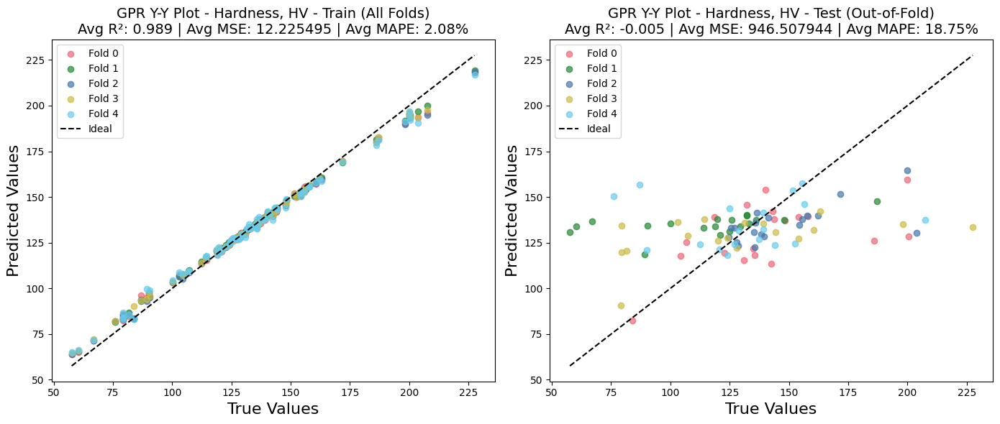

[I 2026-02-17 19:55:10,793] A new study created in memory with name: no-name-5fe201bf-a594-4c47-99c8-cb6dd8180656



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step
[I 2026-02-17 19:55:28,989] Trial 0 finished with values: [0.9935673454561892, -0.15297337375352255] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 40ms/step
[I 2026-02-17 19:55:45,037] Trial 1 finished with values: [1.5187885468934061, -0.7336225522184247] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 52ms/step
[I 2026-02-17 19:56:05,579] Trial 2 finished with values: [1.1917941122764983, -0.46190616548278046] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 42ms/step
[I 2026-02-17 19:56:23,011] Trial 3 finished with values: [0.9414837121539696, -0.10950730064495091] and parameters: {'hidden_layers': 2, 'units': 6

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- NNR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
NNR_Hardness, HV_x_scaler_fold_0.pkl and NNR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 3.593 seconds.
1/1 [==============================] - 0s 13ms/step
Saving model for NNR from Fold 0...
Best model for NNR for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_5_Fold_CV\models\NNR_Hardness, HV_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
NNR_Hardness, HV_x_scaler_fold_1.pkl and NNR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model t

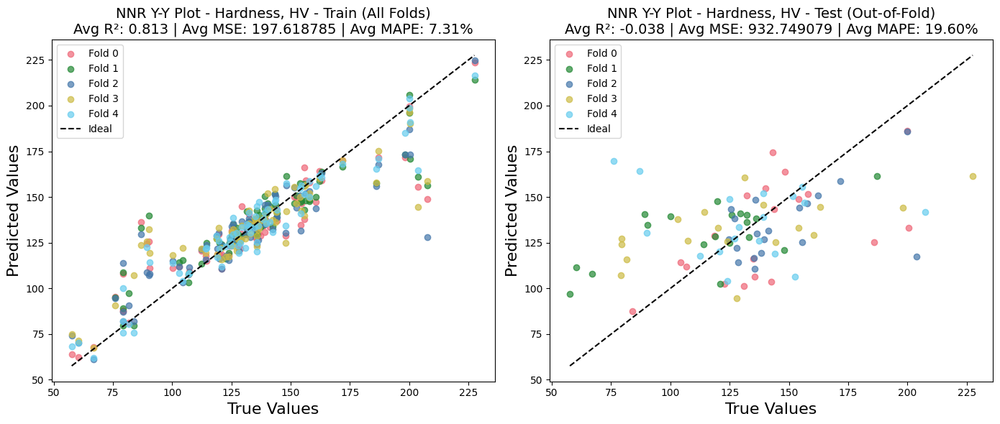


--- Workflow Complete ---
Final 5-fold CV results summary for Hardness, HV saved to Hardness_HV_Results_v3_5_Fold_CV\Hardness, HV_results_5_fold_CV.csv

============================== Completed Workflow for: Hardness, HV ==============================


ALL WORKFLOWS COMPLETE.


In [ ]:
print("\n" + "="*80)
print("STARTING ALL WORKFLOWS")
print("="*80 + "\n")

for target_name in target_cols:
    print(f"\n{'='*30} Processing Target: {target_name} {'='*30}")
    
    # Select the current target column as a 1D array
    y_current = y_cleaned[target_name].values 
    
    # Sanitize the target name to create a valid folder name
    # "YS (MPa)" -> "YS_MPa_Results_v3"
    # "Hardness, HV" -> "Hardness_HV_Results_v3"
    output_folder_name = target_name.replace(' ', '_').replace('(MPa)', 'MPa')
    output_folder_name = output_folder_name.replace(',', '').replace('/', '_')
    output_folder_name = f"{output_folder_name}_Results_v3_5_Fold_CV"
    
    print(f"All outputs will be saved to: '{output_folder_name}' folder.")
    
    # Run the complete workflow from armote_cv.py
    run_workflow(
        X_cleaned, 
        y_current, 
        models_to_run, 
        param_spaces_to_run, 
        cv = 5,
        output_name=target_name,
        output_folder_name=output_folder_name,
        gpr_kernel_map=my_custom_kernels,
        nn_epochs=100,
        nn_batch_size=8,
        colors = ['#EE6677', '#228833', '#4477AA', '#CCBB44', '#66CCEE']
    )
    
    print(f"\n{'='*30} Completed Workflow for: {target_name} {'='*30}\n")

print("\n" + "="*80)
print("ALL WORKFLOWS COMPLETE.")
print("="*80)


STARTING ALL WORKFLOWS


============================== Processing Target: YS (MPa) ==============================
All outputs will be saved to: 'YS__MPa_Results_v3_3_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'YS__MPa_Results_v3_3_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
LinearRegression_YS (MPa)_x_scaler_fold_0.pkl and LinearRegression_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.001 seconds.
Saving model f

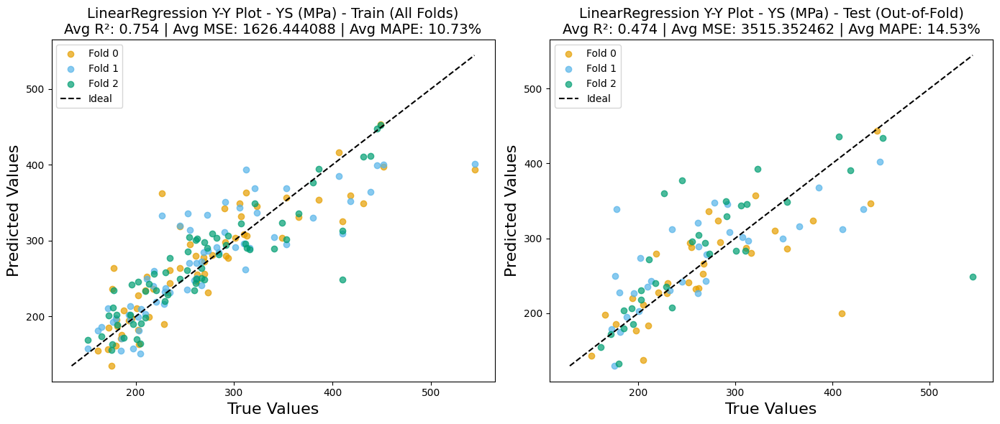

[I 2026-02-17 20:26:26,851] A new study created in memory with name: no-name-ab3d9100-92d2-4397-8a8c-ba5535bc1cfe



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:26:32,066] Trial 0 finished with values: [0.47490793494539973, 0.49085206258669684] and parameters: {'max_iter': 194, 'alpha_1': 5.538693927220064e-06, 'alpha_2': 1.399606271394261e-06, 'lambda_1': 3.5708308326299136e-06, 'lambda_2': 5.195296527459891e-06}.
[I 2026-02-17 20:26:32,162] Trial 1 finished with values: [0.47490876662874265, 0.49085131032313595] and parameters: {'max_iter': 476, 'alpha_1': 1.5654924870337611e-07, 'alpha_2': 7.464285707340382e-06, 'lambda_1': 2.1612403066933413e-07, 'lambda_2': 7.629992961478448e-06}.
[I 2026-02-17 20:26:32,204] Trial 6 finished with values: [0.47490876662874265, 0.49085131032313595] and parameters: {'max_iter': 266, 'alpha_1': 1.8463712436419115e-07, 'alpha_2': 3.588813227043124e-07, 'lambda_1': 1.94761122570196e-06, 'lambda_2': 1.2745858498302236e-06}.
[I 2026-02-17 20:26:32,254] Trial 7 finished with values: [0.47490876662874265, 0.49085131032313595] and parameters: {'max_iter': 287, 'alpha_1': 2.3195784131475838e-06, 'alp

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_3_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_0.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.002 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_3_Fold_CV\models\BayesianRidge_YS (MPa)_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_1.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fo

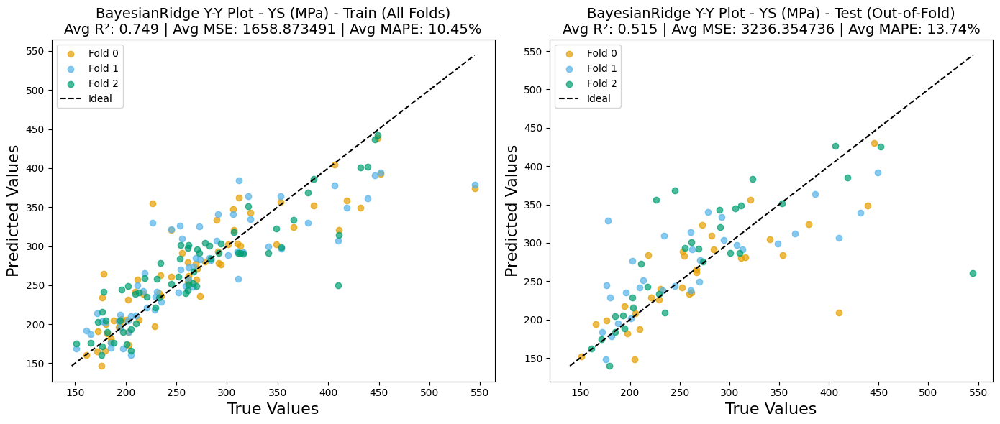

[I 2026-02-17 20:26:38,640] A new study created in memory with name: no-name-32e8b762-e21e-4bae-b530-a45026ac6d14



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:26:38,731] Trial 1 finished with values: [0.8182404204272061, 0.0852501908717983] and parameters: {'C': 2.2503824875299725, 'gamma': 0.16040624862914393, 'epsilon': 0.04850575935058197}.
[I 2026-02-17 20:26:38,733] Trial 0 finished with values: [1.7987959842659726, -0.8896516597031283] and parameters: {'C': 102.69877823584946, 'gamma': 0.00405643814440188, 'epsilon': 0.021143420906006186}.
[I 2026-02-17 20:26:38,777] Trial 6 finished with values: [1.055978917372131, -0.19312181106400558] and parameters: {'C': 513.9616019276297, 'gamma': 0.13286735559366694, 'epsilon': 0.002367325135421419}.
[I 2026-02-17 20:26:38,792] Trial 2 finished with values: [0.5290235125278598, 0.41436519067994104] and parameters: {'C': 7.645875955095384, 'gamma': 0.07761945037373688, 'epsilon': 0.014892708810274059}.
[I 2026-02-17 20:26:38,794] Trial 7 finished with values: [0.5568601823871645, 0.38376378576735254] and parameters: {'C': 195.82939616716817, 'gamma': 0.007998531236660061, 'epsilo

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_3_Fold_CV\plots' directory.

--- SVR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
SVR_YS (MPa)_x_scaler_fold_0.pkl and SVR_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.001 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_3_Fold_CV\models\SVR_YS (MPa)_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
SVR_YS (MPa)_x_scaler_fold_1.pkl and SVR_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.001 seconds.
Saving model for SVR from Fold 1...
Best model for SVR for YS (

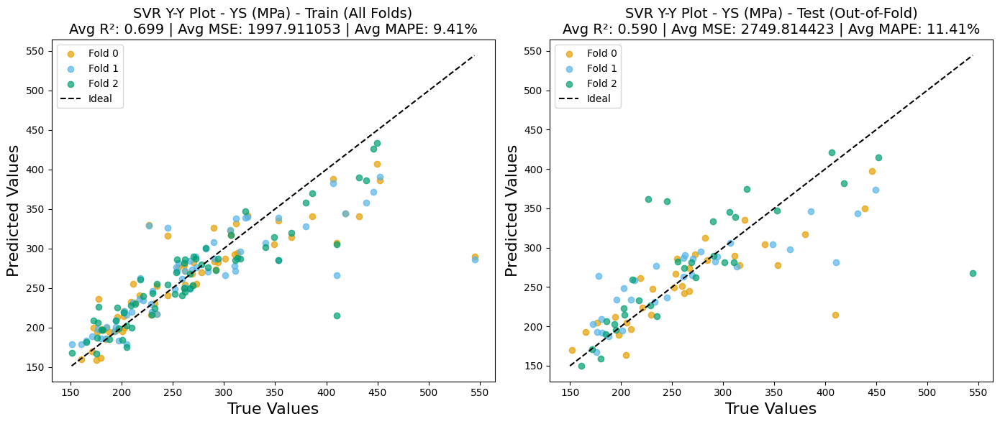

[I 2026-02-17 20:26:44,550] A new study created in memory with name: no-name-c8b8131d-4155-47ec-9c18-4911e1997223



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:26:44,761] Trial 4 finished with values: [0.9235918519800261, -0.01097741420681834] and parameters: {'max_depth': 15, 'min_samples_split': 17, 'min_samples_leaf': 6}.
[I 2026-02-17 20:26:44,761] Trial 7 finished with values: [0.9705822591155976, -0.07332484161477588] and parameters: {'max_depth': 16, 'min_samples_split': 20, 'min_samples_leaf': 3}.
[I 2026-02-17 20:26:44,761] Trial 9 finished with values: [0.9705822591155976, -0.07332484161477588] and parameters: {'max_depth': 33, 'min_samples_split': 20, 'min_samples_leaf': 7}.
[I 2026-02-17 20:26:44,761] Trial 5 finished with values: [0.9705822591155976, -0.07332484161477588] and parameters: {'max_depth': 46, 'min_samples_split': 14, 'min_samples_leaf': 2}.
[I 2026-02-17 20:26:44,765] Trial 0 finished with values: [0.9505039231512415, -0.047411909750792645] and parameters: {'max_depth': 33, 'min_samples_split': 10, 'min_samples_leaf': 15}.
[I 2026-02-17 20:26:44,766] Trial 1 finished with values: [0.9729432962814188,

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_3_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
DecisionTree_YS (MPa)_x_scaler_fold_0.pkl and DecisionTree_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_3_Fold_CV\models\DecisionTree_YS (MPa)_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
DecisionTree_YS (MPa)_x_scaler_fold_1.pkl and DecisionTree_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model 

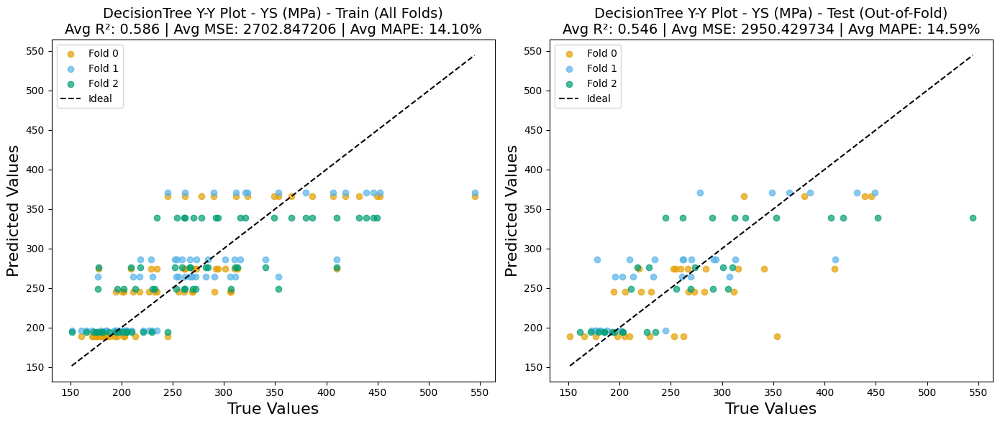

[I 2026-02-17 20:26:49,748] A new study created in memory with name: no-name-bf1ae7dc-b68f-45ad-a98d-58a41a702fe1



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:26:50,086] Trial 0 finished with values: [0.519488495637912, 0.4305532426230026] and parameters: {'n_estimators': 94, 'max_depth': 9, 'min_samples_split': 15, 'min_samples_leaf': 4}.
[I 2026-02-17 20:26:50,198] Trial 1 finished with values: [0.49095279038317213, 0.46461970075731357] and parameters: {'n_estimators': 83, 'max_depth': 45, 'min_samples_split': 10, 'min_samples_leaf': 7}.
[I 2026-02-17 20:26:50,206] Trial 5 finished with values: [0.497804228989909, 0.4541539875879533] and parameters: {'n_estimators': 73, 'max_depth': 18, 'min_samples_split': 7, 'min_samples_leaf': 9}.
[I 2026-02-17 20:26:50,240] Trial 9 finished with values: [0.497804228989909, 0.4541539875879533] and parameters: {'n_estimators': 75, 'max_depth': 41, 'min_samples_split': 15, 'min_samples_leaf': 5}.
[I 2026-02-17 20:26:50,325] Trial 6 finished with values: [0.497804228989909, 0.4541539875879533] and parameters: {'n_estimators': 199, 'max_depth': 27, 'min_samples_split': 17, 'min_samples_leaf

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_3_Fold_CV\plots' directory.

--- RandomForest - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
RandomForest_YS (MPa)_x_scaler_fold_0.pkl and RandomForest_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.101 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_3_Fold_CV\models\RandomForest_YS (MPa)_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
RandomForest_YS (MPa)_x_scaler_fold_1.pkl and RandomForest_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model 

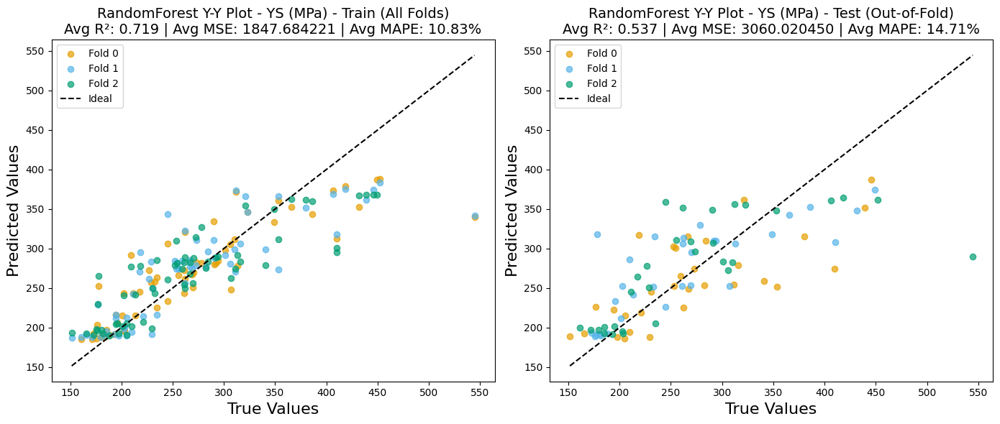

[I 2026-02-17 20:27:01,685] A new study created in memory with name: no-name-05586a50-6d3b-4f75-9e78-411562a7603d



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:27:02,448] Trial 0 finished with values: [0.532942450362778, 0.4143943534244651] and parameters: {'n_estimators': 187, 'learning_rate': 0.014497029886607494, 'max_depth': 10, 'subsample': 0.7336211435344311, 'colsample_bytree': 0.9505990331086827}.
[I 2026-02-17 20:27:02,588] Trial 8 finished with values: [0.5129855818080497, 0.4211898452273608] and parameters: {'n_estimators': 117, 'learning_rate': 0.4739326056227657, 'max_depth': 4, 'subsample': 0.9864212654165223, 'colsample_bytree': 0.7337455256775154}.
[I 2026-02-17 20:27:02,635] Trial 9 finished with values: [0.5129855818080497, 0.4211898452273608] and parameters: {'n_estimators': 158, 'learning_rate': 0.3805551922767769, 'max_depth': 5, 'subsample': 0.7256264573546203, 'colsample_bytree': 0.9226743920402125}.
[I 2026-02-17 20:27:02,671] Trial 5 finished with values: [0.5129855818080497, 0.4211898452273608] and parameters: {'n_estimators': 133, 'learning_rate': 0.04639531671638138, 'max_depth': 6, 'subsample': 0.

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_3_Fold_CV\plots' directory.

--- XGBoost - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
XGBoost_YS (MPa)_x_scaler_fold_0.pkl and XGBoost_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.090 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_3_Fold_CV\models\XGBoost_YS (MPa)_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
XGBoost_YS (MPa)_x_scaler_fold_1.pkl and XGBoost_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.098 seconds.
Saving model for XG

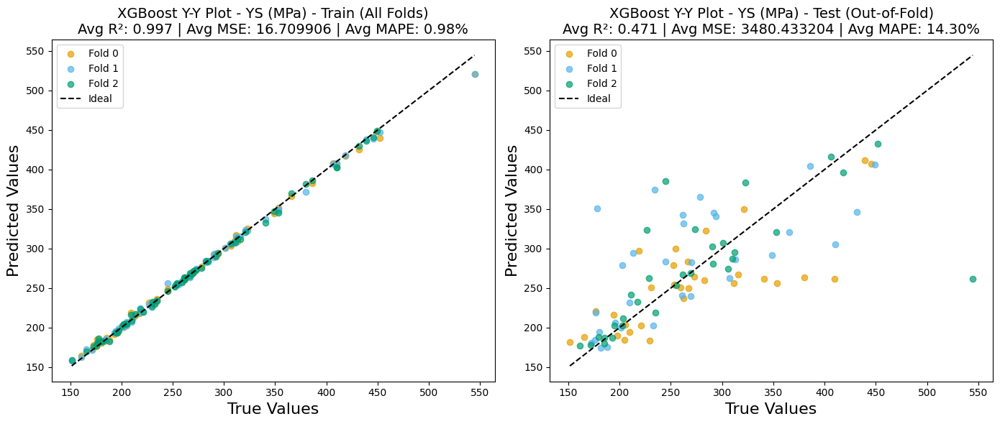

[I 2026-02-17 20:27:10,788] A new study created in memory with name: no-name-e00e7c00-915b-4ea1-adb9-9aa7aa8f619e



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:27:10,901] Trial 0 finished with values: [0.5409666088049431, 0.39659681895783455] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-17 20:27:10,973] Trial 1 finished with values: [0.472477913974972, 0.48385450275630953] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-17 20:27:11,052] Trial 2 finished with values: [0.7897272068002522, 0.11241389299714503] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-17 20:27:11,137] Trial 3 finished with values: [0.6754652416446846, 0.23687350046416708] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-17 20:27:11,204] Trial 4 finished with values: [0.5409666725246869, 0.3965967357283535] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-17 20:27:11,395] Trial 5 finished with values: [0.5982352013946473, 0.33622264067871693] and parameters: {'k

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_3_Fold_CV\plots' directory.

--- GPR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
GPR_YS (MPa)_x_scaler_fold_0.pkl and GPR_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.048 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_3_Fold_CV\models\GPR_YS (MPa)_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
GPR_YS (MPa)_x_scaler_fold_1.pkl and GPR_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.085 seconds.
Saving model for GPR from Fold 1...
Best model for GPR for YS (

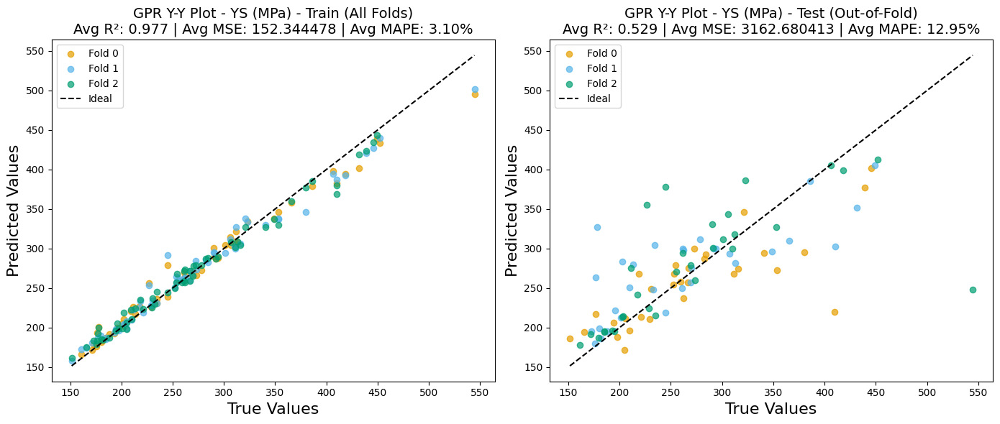

[I 2026-02-17 20:27:22,785] A new study created in memory with name: no-name-071fc7d3-3707-4460-ba4b-90f890d1f420



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step
[I 2026-02-17 20:27:31,477] Trial 0 finished with values: [0.5563266291959641, 0.4515609584446986] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 36ms/step
[I 2026-02-17 20:27:39,361] Trial 1 finished with values: [0.7470370809238961, 0.26295987250891006] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 50ms/step
[I 2026-02-17 20:27:49,931] Trial 2 finished with values: [0.8809942861433592, 0.12371068602483153] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 45ms/step
[I 2026-02-17 20:27:58,396] Trial 3 finished with values: [0.5554130047498289, 0.4436919786424201] and parameters: {'hidden_layers': 2, 'units': 60, 'a

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for YS (MPa) saved as PNGs in 'YS__MPa_Results_v3_3_Fold_CV\plots' directory.

--- NNR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
NNR_YS (MPa)_x_scaler_fold_0.pkl and NNR_YS (MPa)_y_scaler_fold_0.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 3.049 seconds.
1/1 [==============================] - 0s 18ms/step
Saving model for NNR from Fold 0...
Best model for NNR for YS (MPa) (Fold 0) saved to: YS__MPa_Results_v3_3_Fold_CV\models\NNR_YS (MPa)_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
NNR_YS (MPa)_x_scaler_fold_1.pkl and NNR_YS (MPa)_y_scaler_fold_1.pkl saved in 'YS__MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 3.189 seconds.
1/1 [====

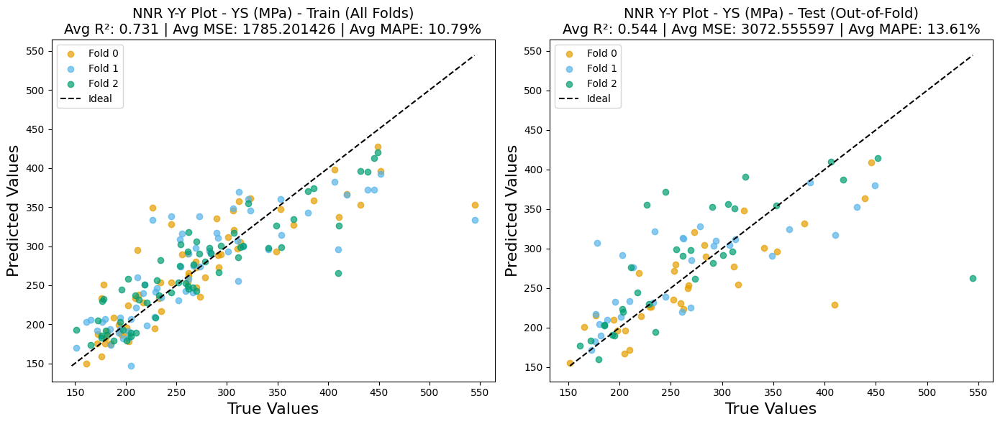


--- Workflow Complete ---
Final 3-fold CV results summary for YS (MPa) saved to YS__MPa_Results_v3_3_Fold_CV\YS (MPa)_results_3_fold_CV.csv

============================== Completed Workflow for: YS (MPa) ==============================


============================== Processing Target: Hardness, HV ==============================
All outputs will be saved to: 'Hardness_HV_Results_v3_3_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'Hardness_HV_Results_v3_3_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
LinearRegression_Hardness, HV_x_scaler

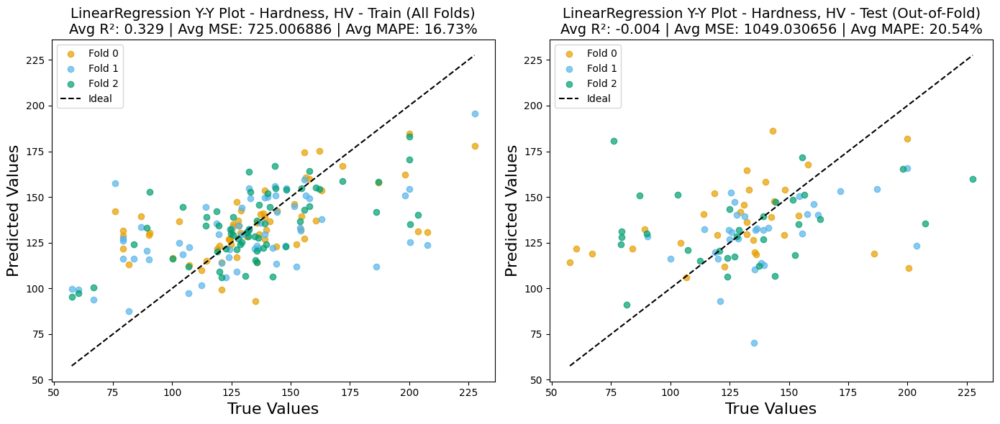

[I 2026-02-17 20:42:47,022] A new study created in memory with name: no-name-b46c45c7-9ec4-4f2b-9f9e-a5659f9dff0f



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:42:52,256] Trial 0 finished with values: [1.3878006639940141, -0.7295006693496732] and parameters: {'max_iter': 295, 'alpha_1': 3.195934315509506e-06, 'alpha_2': 1.7646286759986037e-07, 'lambda_1': 4.781570490880199e-06, 'lambda_2': 8.654872461872071e-07}.
[I 2026-02-17 20:42:52,345] Trial 6 finished with values: [1.3878033374263632, -0.7295046900612178] and parameters: {'max_iter': 260, 'alpha_1': 7.581400427465794e-06, 'alpha_2': 1.5109255928479654e-07, 'lambda_1': 3.5059274110409035e-07, 'lambda_2': 2.4521351419488557e-06}.
[I 2026-02-17 20:42:52,350] Trial 12 finished with values: [1.3878033374263632, -0.7295046900612178] and parameters: {'max_iter': 302, 'alpha_1': 1.0254769352793243e-07, 'alpha_2': 3.8335934230038494e-07, 'lambda_1': 1.986399896665863e-06, 'lambda_2': 1.477414791470656e-07}.
[I 2026-02-17 20:42:52,396] Trial 5 finished with values: [1.3878033374263632, -0.7295046900612178] and parameters: {'max_iter': 230, 'alpha_1': 2.1314807881648893e-07, 'alph

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_0.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.001 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_3_Fold_CV\models\BayesianRidge_Hardness, HV_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_1.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the fin

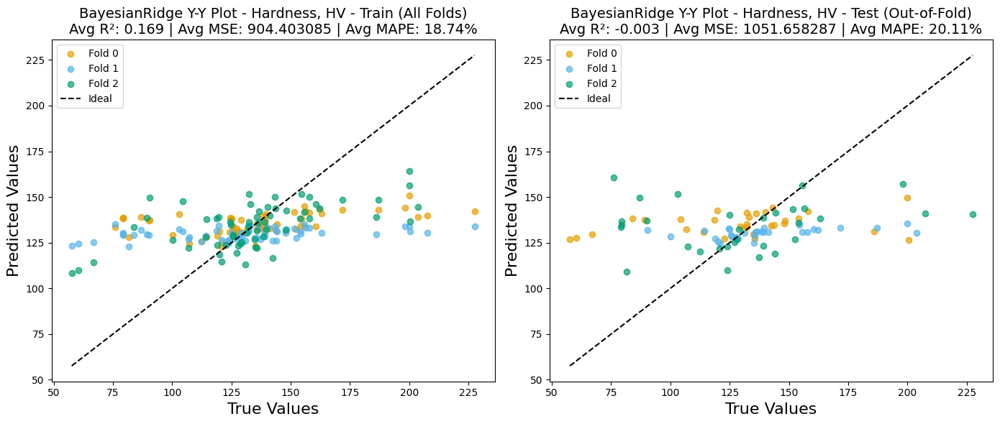

[I 2026-02-17 20:42:58,790] A new study created in memory with name: no-name-871205f9-131d-461e-96fd-ea28b68586cc



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:42:58,890] Trial 0 finished with values: [1.2531563546566844, -0.5469568922741193] and parameters: {'C': 4.447031002516655, 'gamma': 0.0028101365436831163, 'epsilon': 0.002128533190349767}.
[I 2026-02-17 20:42:58,892] Trial 2 finished with values: [1.958908508818853, -1.5237131719610033] and parameters: {'C': 456.19369371767937, 'gamma': 0.04172386196674785, 'epsilon': 0.010007004521908362}.
[I 2026-02-17 20:42:58,926] Trial 6 finished with values: [1.769987109562603, -1.3064805394225416] and parameters: {'C': 0.9599719223389376, 'gamma': 0.08696022165599226, 'epsilon': 0.00683603520483537}.
[I 2026-02-17 20:42:58,929] Trial 8 finished with values: [1.769987109562603, -1.3064805394225416] and parameters: {'C': 4.606200683443035, 'gamma': 0.0005845353000750133, 'epsilon': 0.005981620565245206}.
[I 2026-02-17 20:42:58,929] Trial 7 finished with values: [1.7031492086519535, -1.2322236143675769] and parameters: {'C': 5.740701752652835, 'gamma': 0.0035201408477975996, 'epsi

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- SVR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
SVR_Hardness, HV_x_scaler_fold_0.pkl and SVR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_3_Fold_CV\models\SVR_Hardness, HV_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
SVR_Hardness, HV_x_scaler_fold_1.pkl and SVR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.001 seconds.
Saving model for SV

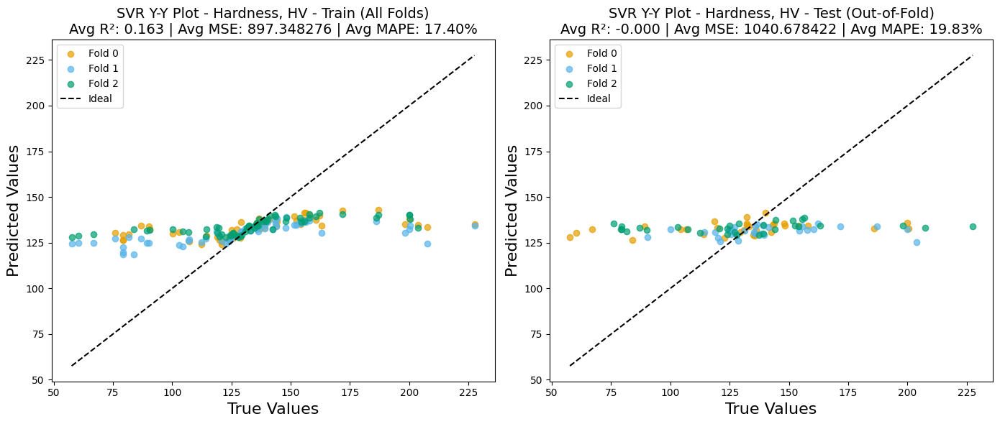

[I 2026-02-17 20:43:04,689] A new study created in memory with name: no-name-2d45500a-f7de-4eb5-a570-0f612d349bdd



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:43:04,890] Trial 0 finished with values: [1.081958143549562, -0.3568575063593183] and parameters: {'max_depth': 49, 'min_samples_split': 10, 'min_samples_leaf': 19}.
[I 2026-02-17 20:43:04,920] Trial 3 finished with values: [1.4012024982241351, -0.7550712192468362] and parameters: {'max_depth': 50, 'min_samples_split': 13, 'min_samples_leaf': 12}.
[I 2026-02-17 20:43:04,920] Trial 11 finished with values: [1.4708094851420839, -0.821029736205435] and parameters: {'max_depth': 11, 'min_samples_split': 8, 'min_samples_leaf': 8}.
[I 2026-02-17 20:43:04,920] Trial 1 finished with values: [1.3864803960677303, -0.6919177821546224] and parameters: {'max_depth': 26, 'min_samples_split': 9, 'min_samples_leaf': 16}.
[I 2026-02-17 20:43:04,920] Trial 5 finished with values: [1.2959685933841314, -0.6001875971130336] and parameters: {'max_depth': 44, 'min_samples_split': 11, 'min_samples_leaf': 20}.
[I 2026-02-17 20:43:04,920] Trial 10 finished with values: [1.4708094851420839, -0.8

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
DecisionTree_Hardness, HV_x_scaler_fold_0.pkl and DecisionTree_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_3_Fold_CV\models\DecisionTree_Hardness, HV_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
DecisionTree_Hardness, HV_x_scaler_fold_1.pkl and DecisionTree_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model wi

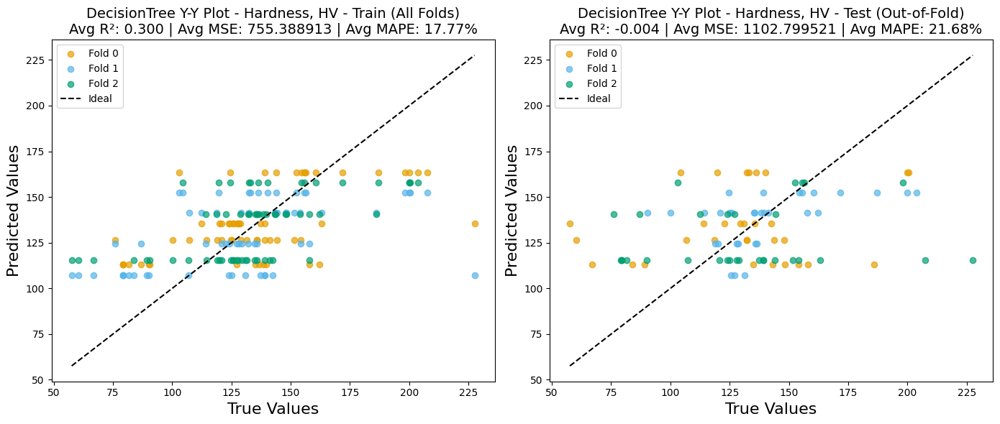

[I 2026-02-17 20:43:09,843] A new study created in memory with name: no-name-e0db579f-e418-49c8-a0ac-97e9648b3d81



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:43:10,326] Trial 1 finished with values: [1.302023471533528, -0.6495962231220669] and parameters: {'n_estimators': 148, 'max_depth': 29, 'min_samples_split': 19, 'min_samples_leaf': 4}.
[I 2026-02-17 20:43:10,346] Trial 0 finished with values: [1.302023471533528, -0.6495962231220669] and parameters: {'n_estimators': 82, 'max_depth': 11, 'min_samples_split': 4, 'min_samples_leaf': 7}.
[I 2026-02-17 20:43:10,399] Trial 3 finished with values: [1.2485852847999321, -0.5511418801522665] and parameters: {'n_estimators': 143, 'max_depth': 13, 'min_samples_split': 6, 'min_samples_leaf': 4}.
[I 2026-02-17 20:43:10,429] Trial 5 finished with values: [1.2794654154829084, -0.6340029296673174] and parameters: {'n_estimators': 159, 'max_depth': 18, 'min_samples_split': 14, 'min_samples_leaf': 3}.
[I 2026-02-17 20:43:10,466] Trial 2 finished with values: [1.2485852847999321, -0.5511418801522665] and parameters: {'n_estimators': 197, 'max_depth': 42, 'min_samples_split': 8, 'min_sampl

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- RandomForest - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
RandomForest_Hardness, HV_x_scaler_fold_0.pkl and RandomForest_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.149 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_3_Fold_CV\models\RandomForest_Hardness, HV_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
RandomForest_Hardness, HV_x_scaler_fold_1.pkl and RandomForest_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model wi

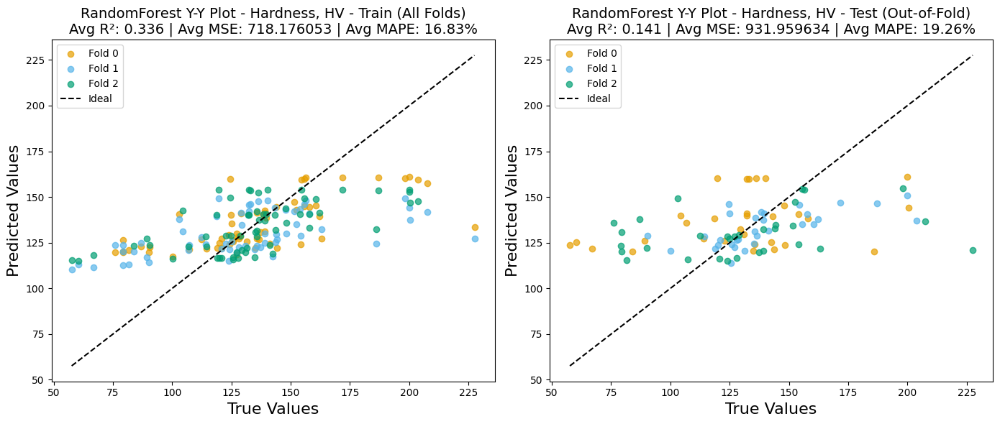

[I 2026-02-17 20:43:22,903] A new study created in memory with name: no-name-aea193bc-523e-43c5-96da-c2e7958fee70



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:43:23,826] Trial 0 finished with values: [1.3519868475326244, -0.7016011905858438] and parameters: {'n_estimators': 92, 'learning_rate': 0.1443794336119256, 'max_depth': 7, 'subsample': 0.9217115539151851, 'colsample_bytree': 0.9503376182864469}.
[I 2026-02-17 20:43:23,832] Trial 6 finished with values: [1.3526479909951057, -0.6944682382478037] and parameters: {'n_estimators': 181, 'learning_rate': 0.02088568202736185, 'max_depth': 9, 'subsample': 0.8192674929999315, 'colsample_bytree': 0.7323719220448391}.
[I 2026-02-17 20:43:23,836] Trial 1 finished with values: [1.2417510304549575, -0.5612620068290398] and parameters: {'n_estimators': 71, 'learning_rate': 0.012055458391857128, 'max_depth': 7, 'subsample': 0.8680041379805314, 'colsample_bytree': 0.781671477162425}.
[I 2026-02-17 20:43:23,836] Trial 3 finished with values: [1.217116107093127, -0.5486391430102081] and parameters: {'n_estimators': 160, 'learning_rate': 0.2160633761153109, 'max_depth': 3, 'subsample': 0.

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- XGBoost - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
XGBoost_Hardness, HV_x_scaler_fold_0.pkl and XGBoost_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.037 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_3_Fold_CV\models\XGBoost_Hardness, HV_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
XGBoost_Hardness, HV_x_scaler_fold_1.pkl and XGBoost_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training co

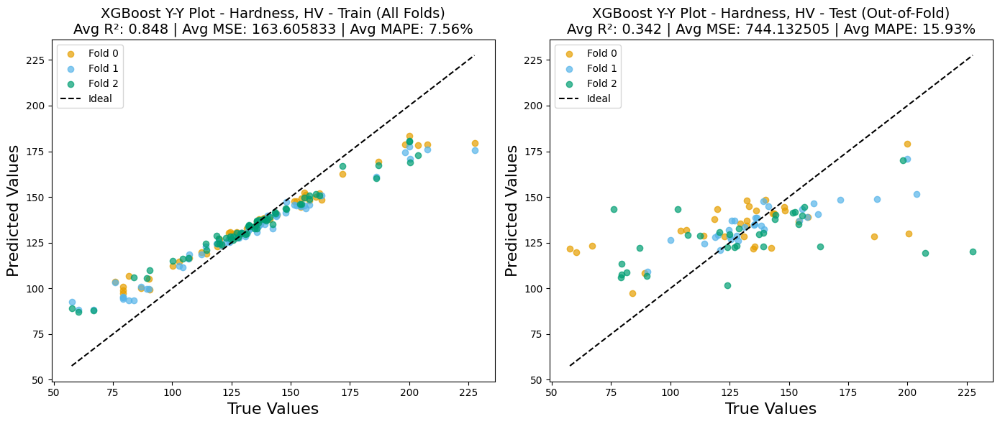

[I 2026-02-17 20:43:31,333] A new study created in memory with name: no-name-12462a98-bc79-4b11-8a7b-8455178c2baf



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-17 20:43:31,417] Trial 0 finished with values: [1.2463597281162808, -0.5544304945232559] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-17 20:43:31,503] Trial 1 finished with values: [1.2606274263989807, -0.5767254841989692] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-17 20:43:31,580] Trial 2 finished with values: [1.0660787257692674, -0.2677398623132505] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-17 20:43:31,660] Trial 3 finished with values: [1.092523498328549, -0.3005041080166595] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-17 20:43:31,738] Trial 4 finished with values: [1.2463597104479376, -0.5544304658397111] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-17 20:43:31,851] Trial 5 finished with values: [1.2023252157982791, -0.4803511382140193] and parameters: {'

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- GPR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
GPR_Hardness, HV_x_scaler_fold_0.pkl and GPR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.025 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_3_Fold_CV\models\GPR_Hardness, HV_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
GPR_Hardness, HV_x_scaler_fold_1.pkl and GPR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.103 seconds.
Saving model for GP

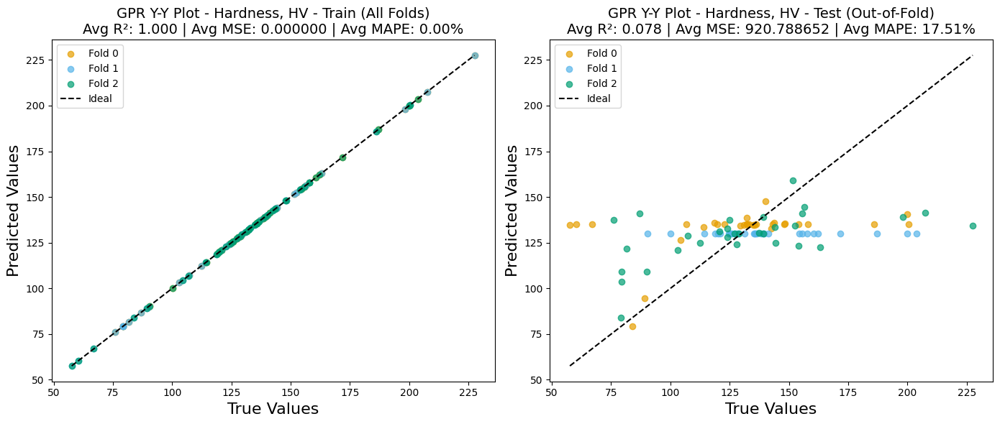

[I 2026-02-17 20:43:43,085] A new study created in memory with name: no-name-79c606fa-580d-403e-89d2-3c4a77cfaf29



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step
[I 2026-02-17 20:43:51,916] Trial 0 finished with values: [0.9573806989345123, 0.0075734359865533936] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 39ms/step
[I 2026-02-17 20:43:59,798] Trial 1 finished with values: [1.544630609349008, -0.5616720687713365] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 48ms/step
[I 2026-02-17 20:44:09,982] Trial 2 finished with values: [1.1652070268582946, -0.2508437809878066] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 42ms/step
[I 2026-02-17 20:44:18,868] Trial 3 finished with values: [0.9600415488953505, 0.031424978934993776] and parameters: {'hidden_layers': 2, 'units': 60

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for Hardness, HV saved as PNGs in 'Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- NNR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
NNR_Hardness, HV_x_scaler_fold_0.pkl and NNR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 3.441 seconds.
1/1 [==============================] - 0s 18ms/step
Saving model for NNR from Fold 0...
Best model for NNR for Hardness, HV (Fold 0) saved to: Hardness_HV_Results_v3_3_Fold_CV\models\NNR_Hardness, HV_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
NNR_Hardness, HV_x_scaler_fold_1.pkl and NNR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model t

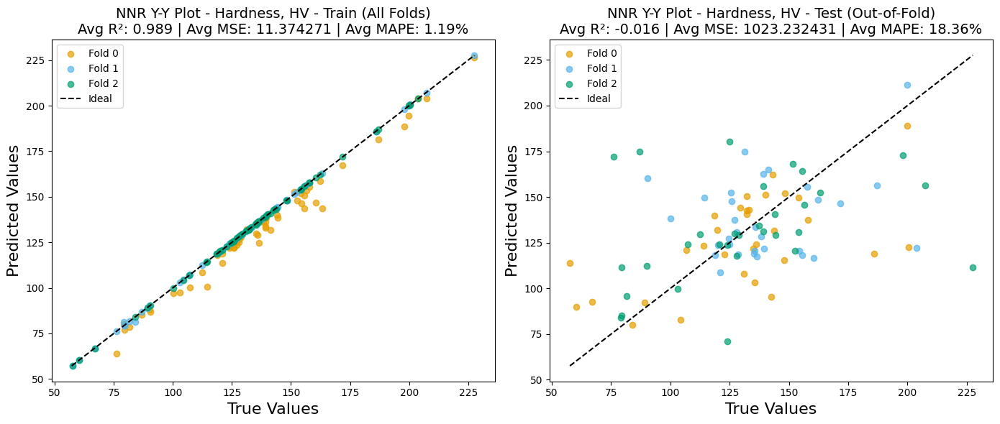


--- Workflow Complete ---
Final 3-fold CV results summary for Hardness, HV saved to Hardness_HV_Results_v3_3_Fold_CV\Hardness, HV_results_3_fold_CV.csv

============================== Completed Workflow for: Hardness, HV ==============================


ALL WORKFLOWS COMPLETE.


In [9]:
print("\n" + "="*80)
print("STARTING ALL WORKFLOWS")
print("="*80 + "\n")

for target_name in target_cols:
    print(f"\n{'='*30} Processing Target: {target_name} {'='*30}")
    
    # Select the current target column as a 1D array
    y_current = y_cleaned[target_name].values 
    
    # Sanitize the target name to create a valid folder name
    # "YS (MPa)" -> "YS_MPa_Results_v3"
    # "Hardness, HV" -> "Hardness_HV_Results_v3"
    output_folder_name = target_name.replace(' ', '_').replace('(MPa)', '_MPa')
    output_folder_name = output_folder_name.replace(',', '').replace('/', '_')
    output_folder_name = f"{output_folder_name}_Results_v3_3_Fold_CV"
    
    print(f"All outputs will be saved to: '{output_folder_name}' folder.")
    
    # Run the complete workflow from armote_cv.py
    run_workflow(
        X_cleaned, 
        y_current, 
        models_to_run, 
        param_spaces_to_run, 
        cv = 3,
        output_name=target_name,
        output_folder_name=output_folder_name,
        gpr_kernel_map=my_custom_kernels,
        nn_epochs=100,
        nn_batch_size=8,
        colors = ["#E69F00", "#56B4E9", "#009E73"]
    )
    
    print(f"\n{'='*30} Completed Workflow for: {target_name} {'='*30}\n")

print("\n" + "="*80)
print("ALL WORKFLOWS COMPLETE.")
print("="*80)

In [4]:
# Filter for rows where the 'Alloy Name' starts with 'C'
c3_df = df[df['Alloy Name'].str.startswith('C', na=False)]
c3_df.head()

,Alloy Name,Al,Co,Cr,Cu,Fe,Mn,Ni,V,"Hardness, HV","SD, HV",YS (MPa),"SD, YS",Cold Work (%Reduction),Recrystallization Temp(℃),Holding time (h),Grain Size(µm),"SD, Grain Size(µm)"
35,CBA01,0,8.0,8,0,24.0,8,44.0,8,120.888889,4.136558,175.751054,1.360078,50,1150,2.0,211.75,158.69
36,CBA02,0,16.0,8,0,8.0,12,44.0,12,186.000000,9.604686,353.506182,NaN,40,800,1.0,107.39,321.06
37,CBA03,0,32.0,8,0,8.0,12,32.0,8,136.555556,5.410894,261.272043,4.873608,50,825,4.0,33.17,22.04
38,CBA04,0,8.0,8,0,20.0,12,44.0,8,112.444444,6.064468,184.983724,6.739851,50,1125,1.0,193.91,141.78
39,CBA05,0,16.0,8,0,16.0,8,44.0,8,135.666667,6.442049,262.182843,8.951319,60,850,1.0,30.12,21.55


In [5]:
c3_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 59 entries, 35 to 93
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Alloy Name                 59 non-null     object 
 1   Al                         59 non-null     int64  
 2   Co                         59 non-null     float64
 3   Cr                         59 non-null     int64  
 4   Cu                         59 non-null     int64  
 5   Fe                         59 non-null     float64
 6   Mn                         59 non-null     int64  
 7   Ni                         59 non-null     float64
 8   V                          59 non-null     int64  
 9   Hardness, HV               59 non-null     float64
 10  SD, HV                     59 non-null     float64
 11  YS (MPa)                   59 non-null     float64
 12  SD, YS                     53 non-null     float64
 13  Cold Work (%Reduction)     59 non-null     int64  
 14  

In [6]:
# Composition columns
composition_cols = ['Co', 'Cr', 'Fe', 'Mn', 'Ni', 'V']

# Processing columns
processing_cols = [
    'Cold Work (%Reduction)', 
    'Recrystallization Temp(℃)', 
    'Holding time (h)'
    ]

# Grain size column
grain_size_col = ['Grain Size(µm)']

# Feature columns
feature_cols = composition_cols + processing_cols + grain_size_col

# Target columns
target_cols = ['YS (MPa)', 'Hardness, HV']

In [7]:
#--- Prepare Input (X) and Output (y) DataFrames ---
X = c3_df[feature_cols].copy()
y = c3_df[target_cols].copy()

print(f"Data loaded successfully. Found {X.shape[0]} samples.")
print(f"Features (X shape): {X.shape}")
print(f"Targets (y shape): {y.shape}")

Data loaded successfully. Found 59 samples.
Features (X shape): (59, 10)
Targets (y shape): (59, 2)


In [8]:
# --- Handle Missing Values ---
print("\n" + "-"*30)
print("Checking for missing data (NaNs)...")
# Combine X and y to ensure we drop the same rows from both
full_data = pd.concat([X, y], axis=1)
initial_rows = full_data.shape[0]
nan_rows = full_data.isna().any(axis=1).sum()

if nan_rows > 0:
    print(f"Found {nan_rows} rows with one or more NaN values. Dropping them...")
    # Drop all rows that have a NaN in *any* column (X or y)
    full_data_cleaned = full_data.dropna()
    final_rows = full_data_cleaned.shape[0]
    
    # Re-split into X and y
    X_cleaned = full_data_cleaned[feature_cols]
    y_cleaned = full_data_cleaned[target_cols]
    
    print(f"Dropped {initial_rows - final_rows} rows.")
    print(f"Proceeding with {final_rows} complete samples.")
else:
    print("No missing data found.")
    X_cleaned = X
    y_cleaned = y
print("-"*30 + "\n")


------------------------------
Checking for missing data (NaNs)...
No missing data found.
------------------------------



In [9]:
# --- Define Models to Run ---
models_to_run = {
    "LinearRegression": LinearRegression(),
    "BayesianRidge": BayesianRidge(),
    "SVR": SVR(),
    "DecisionTree": DecisionTreeRegressor(random_state=42),
    "RandomForest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42, n_jobs=-1),
    "GPR": GaussianProcessRegressor(random_state=42, n_restarts_optimizer=9),  # Must be named "GPR"
    "NNR": None,                                     # Must be named "NNR"
}

# --- Define GPR Kernel Map ---
# This dictionary is passed to armote.py
# The keys (e.g., "RBF_1", "Matern_1.5") are your custom names
# which MUST match the 'categorical' list for "GPR" in param_spaces_to_run.
my_custom_kernels = {
    "RBF_default": RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2)),
    "Matern_nu_0.5": Matern(length_scale=1.0, nu=0.5, length_scale_bounds=(1e-2, 1e2)),
    "Matern_nu_1.5": Matern(length_scale=1.0, nu=1.5, length_scale_bounds=(1e-2, 1e2)),
    "Matern_nu_2.5": Matern(length_scale=1.0, nu=2.5, length_scale_bounds=(1e-2, 1e2)),
    "RationalQuadratic": RationalQuadratic(length_scale=1.0, alpha=0.1, 
                                           length_scale_bounds=(1e-2, 1e2), 
                                           alpha_bounds=(1e-2, 1e2))
}

# --- Define Hyperparameter Search Spaces ---
param_spaces_to_run = {
    "LinearRegression": None,  # No tuning
    
    "BayesianRidge": {
        "max_iter": ("int", 100, 500),  
        "alpha_1": ("float", 1e-7, 1e-5, "log"),
        "alpha_2": ("float", 1e-7, 1e-5, "log"), 
        "lambda_1": ("float", 1e-7, 1e-5, "log"),
        "lambda_2": ("float", 1e-7, 1e-5, "log"),
    },
    
    "SVR": {
        "C": ("float", 0.1, 10002, "log"),
        "gamma": ("float", 1e-4, 1.0, "log"),
        "epsilon": ("float", 1e-3, 0.5, "log"),
    },
    
    "DecisionTree": {
        "max_depth": ("int", 5, 50),
        "min_samples_split": ("int", 2, 20),
        "min_samples_leaf": ("int", 1, 20),
    },
    
    "RandomForest": {
        "n_estimators": ("int", 50, 200),
        "max_depth": ("int", 5, 50),
        "min_samples_split": ("int", 2, 20),
        "min_samples_leaf": ("int", 1, 10),
    },
    
    "XGBoost": {
        "n_estimators": ("int", 50, 200),
        "learning_rate": ("float", 0.01, 0.5, "log"),
        "max_depth": ("int", 3, 10),
        "subsample": ("float", 0.6, 1.0),
        "colsample_bytree": ("float", 0.6, 1.0),
    },
    
    "GPR": {
        "kernel": ("categorical", list(my_custom_kernels.keys())),
        "alpha": ("float", 1e-10, 1e-1, "log"),
    },
    
    "NNR": {
        "hidden_layers": ("int", 1, 4),
        "units": ("int", 32, 128), # Units in the *first* hidden layer
        "activation": ("categorical", ["relu", "tanh", "selu"]),
        "learning_rate": ("float", 1e-5, 1e-2, "log"),
    }
}


STARTING ALL WORKFLOWS


============================== Processing Target: YS (MPa) ==============================
All outputs will be saved to: 'C3_YS_MPa_Results_v3_5_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'C3_YS_MPa_Results_v3_5_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
LinearRegression_YS (MPa)_x_scaler_fold_0.pkl and LinearRegression_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.016 seconds.
Saving

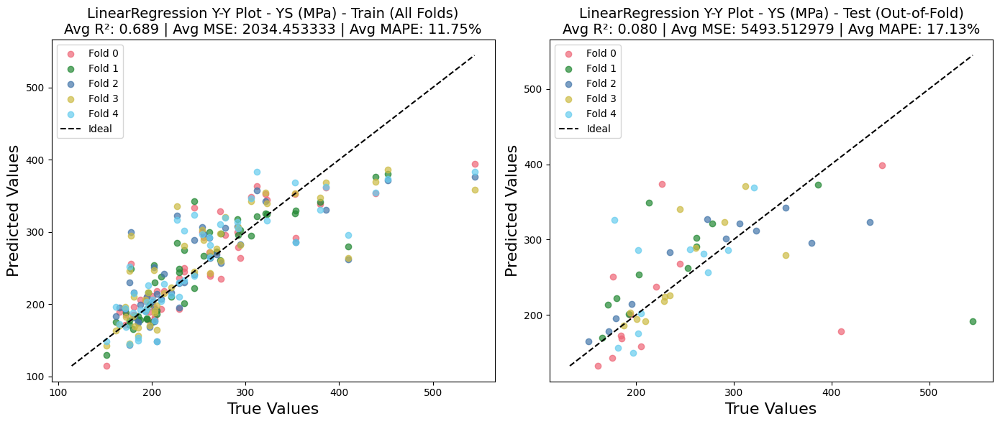

[I 2026-02-18 08:59:22,169] A new study created in memory with name: no-name-f5bb4060-6726-4f60-acf1-f1f30ed8f6a0



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 08:59:30,873] Trial 8 finished with values: [0.5671452769982795, 0.4147130280668776] and parameters: {'max_iter': 285, 'alpha_1': 1.18595865916902e-06, 'alpha_2': 1.8576346139809953e-07, 'lambda_1': 1.2623898562290482e-07, 'lambda_2': 1.7285354680369e-07}.
[I 2026-02-18 08:59:30,915] Trial 1 finished with values: [0.5671458626360996, 0.41471252077419585] and parameters: {'max_iter': 211, 'alpha_1': 2.243083814787618e-07, 'alpha_2': 2.758014454230888e-07, 'lambda_1': 1.4199674134164694e-07, 'lambda_2': 6.872594317450449e-07}.
[I 2026-02-18 08:59:30,931] Trial 3 finished with values: [0.5671452769982795, 0.4147130280668776] and parameters: {'max_iter': 218, 'alpha_1': 2.8804254846814305e-06, 'alpha_2': 8.133088141741564e-06, 'lambda_1': 1.166825086535153e-06, 'lambda_2': 6.140591500882017e-06}.
[I 2026-02-18 08:59:30,974] Trial 0 finished with values: [0.5671459673799506, 0.4147124218610384] and parameters: {'max_iter': 472, 'alpha_1': 8.890591735141665e-06, 'alpha_2': 3.15

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_0.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.002 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_5_Fold_CV\models\BayesianRidge_YS (MPa)_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_1.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparamete

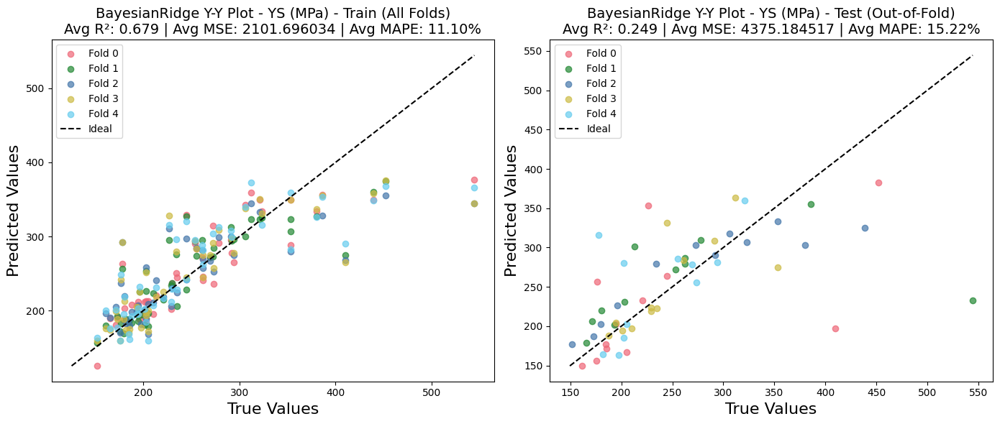

[I 2026-02-18 08:59:38,514] A new study created in memory with name: no-name-5563777d-d05f-4921-9ff9-23786addd4e5



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 08:59:38,637] Trial 0 finished with values: [1.082271297841389, -0.2464503298455713] and parameters: {'C': 0.3285956987652317, 'gamma': 0.7891365833927938, 'epsilon': 0.011020940703947275}.
[I 2026-02-18 08:59:38,671] Trial 1 finished with values: [0.621560285454394, 0.3768335615038233] and parameters: {'C': 652.1572020234698, 'gamma': 0.0007422423998071867, 'epsilon': 0.0016022106063957083}.
[I 2026-02-18 08:59:38,690] Trial 2 finished with values: [0.7933189082842992, 0.14189607486750327] and parameters: {'C': 3.814941376559393, 'gamma': 0.0343807467224298, 'epsilon': 0.01878127111053469}.
[I 2026-02-18 08:59:38,707] Trial 3 finished with values: [0.5624767147575378, 0.4475226012664047] and parameters: {'C': 0.163611213522887, 'gamma': 0.020573226787422412, 'epsilon': 0.002262432004604726}.
[I 2026-02-18 08:59:38,741] Trial 5 finished with values: [0.5810565962102743, 0.4273609571724181] and parameters: {'C': 175.68416601711573, 'gamma': 0.004146015137312081, 'epsilon':

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- SVR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
SVR_YS (MPa)_x_scaler_fold_0.pkl and SVR_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.003 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_5_Fold_CV\models\SVR_YS (MPa)_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
SVR_YS (MPa)_x_scaler_fold_1.pkl and SVR_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.002 seconds.
Saving model for SVR from Fold 1...
Best model for SVR 

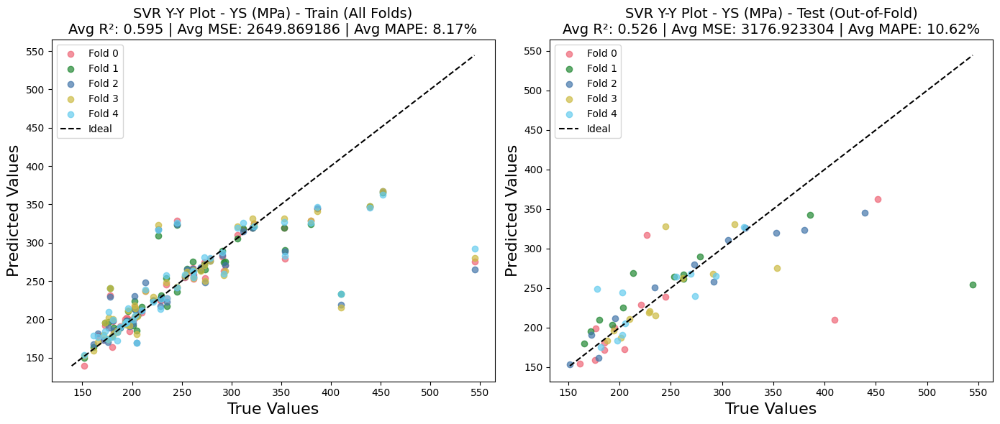

[I 2026-02-18 08:59:45,484] A new study created in memory with name: no-name-bda7c43f-7160-4bef-a910-530eafa566ee



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 08:59:45,772] Trial 0 finished with values: [0.8987639989801188, 0.05327623514354298] and parameters: {'max_depth': 25, 'min_samples_split': 9, 'min_samples_leaf': 2}.
[I 2026-02-18 08:59:45,796] Trial 1 finished with values: [0.8648901243387341, 0.07413189947533778] and parameters: {'max_depth': 49, 'min_samples_split': 20, 'min_samples_leaf': 13}.
[I 2026-02-18 08:59:45,807] Trial 2 finished with values: [0.6379408589485174, 0.33003963869573927] and parameters: {'max_depth': 14, 'min_samples_split': 4, 'min_samples_leaf': 12}.
[I 2026-02-18 08:59:45,842] Trial 4 finished with values: [0.7727165264460729, 0.1733032651904111] and parameters: {'max_depth': 32, 'min_samples_split': 13, 'min_samples_leaf': 17}.
[I 2026-02-18 08:59:45,848] Trial 5 finished with values: [0.6447938891619573, 0.3477133437540958] and parameters: {'max_depth': 36, 'min_samples_split': 13, 'min_samples_leaf': 4}.
[I 2026-02-18 08:59:45,848] Trial 3 finished with values: [0.7727165264460729, 0.17330

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
DecisionTree_YS (MPa)_x_scaler_fold_0.pkl and DecisionTree_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.011 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_5_Fold_CV\models\DecisionTree_YS (MPa)_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
DecisionTree_YS (MPa)_x_scaler_fold_1.pkl and DecisionTree_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 

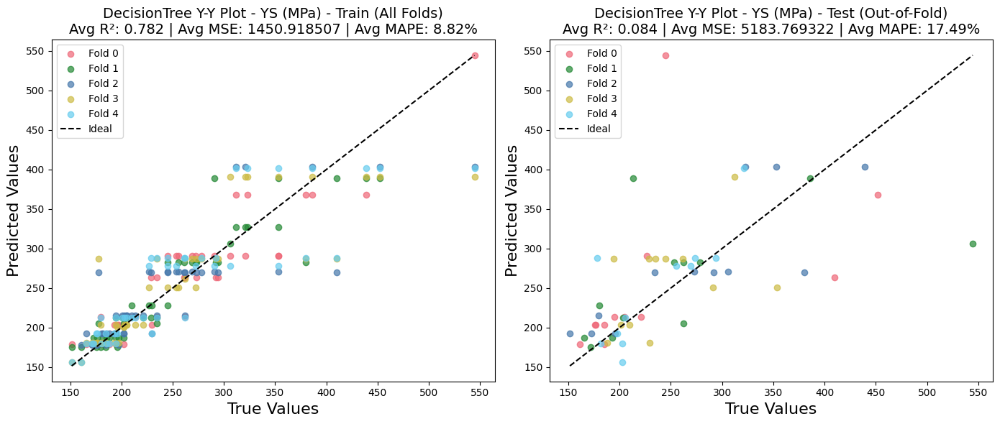

[I 2026-02-18 08:59:51,554] A new study created in memory with name: no-name-04ccbe59-faf2-4277-8eb5-725db215fa39



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 08:59:52,157] Trial 0 finished with values: [0.6034958128759881, 0.3784548228880726] and parameters: {'n_estimators': 68, 'max_depth': 36, 'min_samples_split': 10, 'min_samples_leaf': 4}.
[I 2026-02-18 08:59:52,317] Trial 1 finished with values: [0.550715330742716, 0.44500353385822444] and parameters: {'n_estimators': 188, 'max_depth': 26, 'min_samples_split': 12, 'min_samples_leaf': 7}.
[I 2026-02-18 08:59:52,465] Trial 4 finished with values: [0.5762824868617871, 0.416224532145497] and parameters: {'n_estimators': 105, 'max_depth': 14, 'min_samples_split': 11, 'min_samples_leaf': 8}.
[I 2026-02-18 08:59:52,495] Trial 7 finished with values: [0.5880976422207451, 0.3995023072069591] and parameters: {'n_estimators': 109, 'max_depth': 18, 'min_samples_split': 7, 'min_samples_leaf': 5}.
[I 2026-02-18 08:59:52,550] Trial 3 finished with values: [0.6925548948736413, 0.3079535248279103] and parameters: {'n_estimators': 159, 'max_depth': 18, 'min_samples_split': 6, 'min_samples_

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- RandomForest - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
RandomForest_YS (MPa)_x_scaler_fold_0.pkl and RandomForest_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.145 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_5_Fold_CV\models\RandomForest_YS (MPa)_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
RandomForest_YS (MPa)_x_scaler_fold_1.pkl and RandomForest_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 

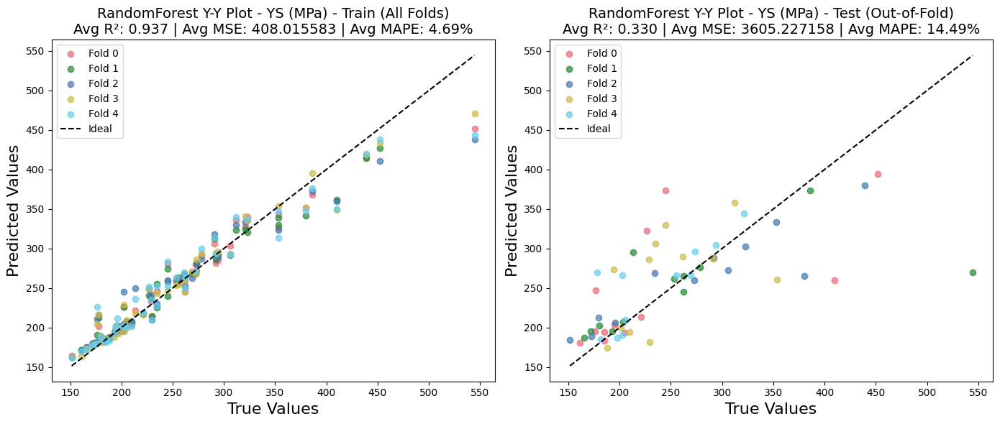

[I 2026-02-18 09:00:09,937] A new study created in memory with name: no-name-95bdcb4f-75a2-4343-a3dc-abd506e603ea



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 09:00:13,898] Trial 3 finished with values: [0.5946831853263911, 0.37294878006702536] and parameters: {'n_estimators': 170, 'learning_rate': 0.23705398861825236, 'max_depth': 6, 'subsample': 0.7610289662556885, 'colsample_bytree': 0.7647112275048722}.
[I 2026-02-18 09:00:14,169] Trial 0 finished with values: [0.6082243211041595, 0.2818237481257282] and parameters: {'n_estimators': 189, 'learning_rate': 0.310652527585152, 'max_depth': 10, 'subsample': 0.8200404094505499, 'colsample_bytree': 0.8620351753562754}.
[I 2026-02-18 09:00:14,248] Trial 1 finished with values: [0.5676935307995696, 0.4022170016732394] and parameters: {'n_estimators': 68, 'learning_rate': 0.12078384395700065, 'max_depth': 6, 'subsample': 0.9298973914677429, 'colsample_bytree': 0.8641392827333862}.
[I 2026-02-18 09:00:14,304] Trial 4 finished with values: [0.7516017592552832, 0.18451712315217278] and parameters: {'n_estimators': 188, 'learning_rate': 0.12037505641325275, 'max_depth': 5, 'subsample': 0

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- XGBoost - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
XGBoost_YS (MPa)_x_scaler_fold_0.pkl and XGBoost_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.054 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_5_Fold_CV\models\XGBoost_YS (MPa)_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
XGBoost_YS (MPa)_x_scaler_fold_1.pkl and XGBoost_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.055 seconds.
Saving mode

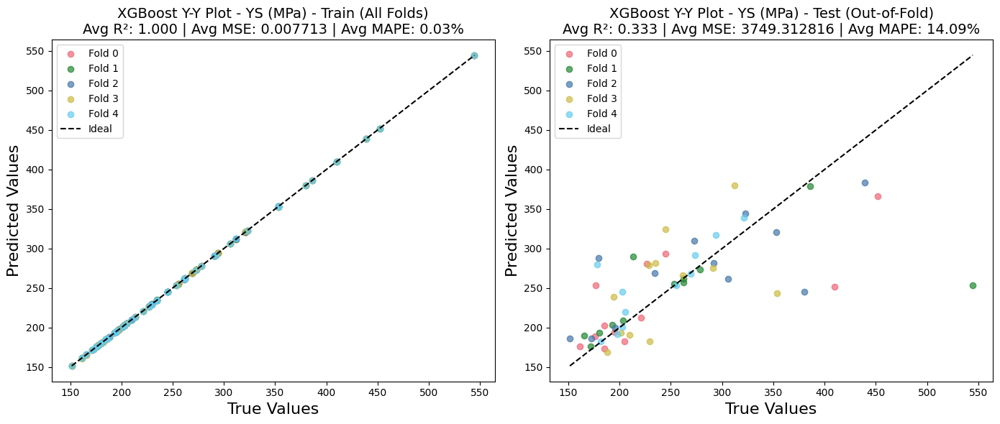

[I 2026-02-18 09:00:23,308] A new study created in memory with name: no-name-76fb048b-ea7e-4b16-b01c-947a247c3f09



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 09:00:23,422] Trial 0 finished with values: [0.8417882613747277, -0.04687826886911657] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-18 09:00:23,494] Trial 1 finished with values: [0.6297746027729416, 0.32729504604406073] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-18 09:00:23,576] Trial 2 finished with values: [0.8248332266413719, -0.030076024343949737] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-18 09:00:23,662] Trial 3 finished with values: [0.8349348347434956, -0.04008532140805991] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-18 09:00:23,715] Trial 4 finished with values: [0.84178826142701, -0.04687826892043556] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-18 09:00:23,859] Trial 5 finished with values: [0.6917593188312977, 0.19612489135955144] and parameters

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- GPR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
GPR_YS (MPa)_x_scaler_fold_0.pkl and GPR_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.081 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_5_Fold_CV\models\GPR_YS (MPa)_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
GPR_YS (MPa)_x_scaler_fold_1.pkl and GPR_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.091 seconds.
Saving model for GPR from Fold 1...
Best model for GPR 

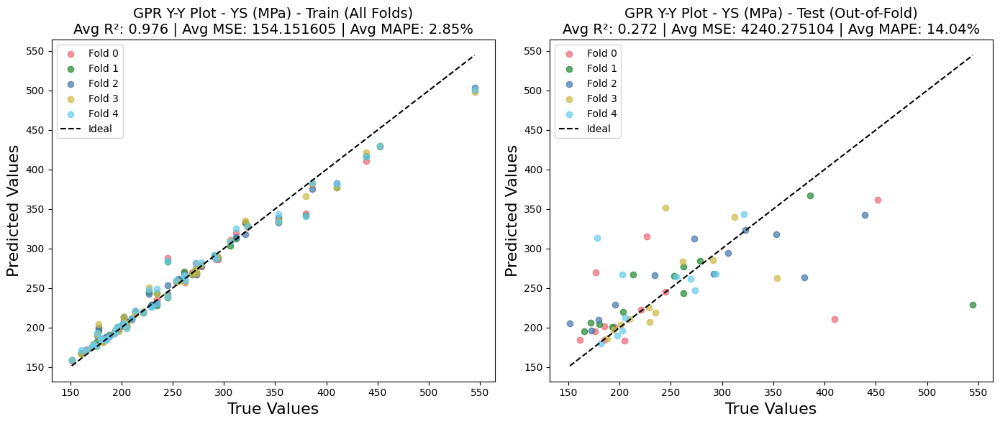

[I 2026-02-18 09:00:35,993] A new study created in memory with name: no-name-02e8b763-dc61-4447-9473-a27c038a4c87



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step
[I 2026-02-18 09:00:52,398] Trial 0 finished with values: [0.6949513054029447, 0.22065628383461583] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 40ms/step
[I 2026-02-18 09:01:02,961] Trial 1 finished with values: [0.8910980187107196, 0.1163389570751987] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 56ms/step
[I 2026-02-18 09:01:16,435] Trial 2 finished with values: [1.2109518478876988, -0.3227433987985543] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 44ms/step
[I 2026-02-18 09:01:28,227] Trial 3 finished with values: [0.6567471894803832, 0.303684471197518] and parameters: {'hidden_layers': 2, 'units': 60, 'ac

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- NNR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
NNR_YS (MPa)_x_scaler_fold_0.pkl and NNR_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 2.977 seconds.
1/1 [==============================] - 0s 24ms/step
Saving model for NNR from Fold 0...
Best model for NNR for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_5_Fold_CV\models\NNR_YS (MPa)_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
NNR_YS (MPa)_x_scaler_fold_1.pkl and NNR_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 2.847 seconds.
1

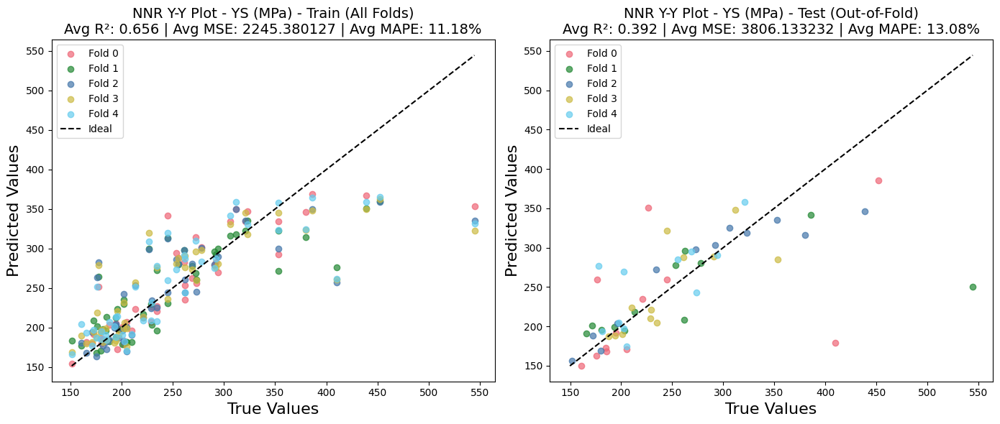


--- Workflow Complete ---
Final 5-fold CV results summary for YS (MPa) saved to C3_YS_MPa_Results_v3_5_Fold_CV\YS (MPa)_results_5_fold_CV.csv

============================== Completed Workflow for: YS (MPa) ==============================


============================== Processing Target: Hardness, HV ==============================
All outputs will be saved to: 'C3_Hardness_HV_Results_v3_5_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'C3_Hardness_HV_Results_v3_5_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
LinearRegression_Hardness, 

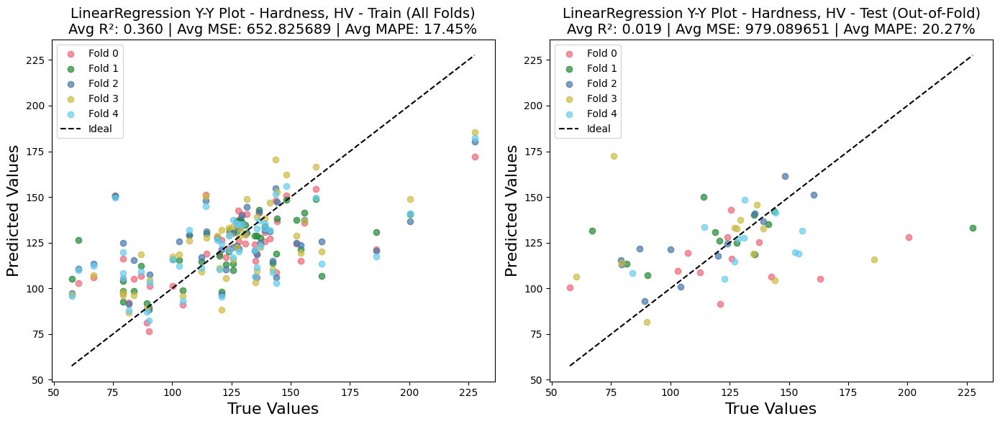

[I 2026-02-18 09:22:40,600] A new study created in memory with name: no-name-38a67fb1-5707-4494-b47c-8ed50ceebb13



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 09:22:48,565] Trial 0 finished with values: [1.3464731533308911, -3.2243552932872874] and parameters: {'max_iter': 146, 'alpha_1': 2.262254902275222e-06, 'alpha_2': 7.198457410326203e-06, 'lambda_1': 2.502707776081858e-07, 'lambda_2': 4.014056241811973e-06}.
[I 2026-02-18 09:22:48,766] Trial 3 finished with values: [1.3464335849311353, -3.2241375879129186] and parameters: {'max_iter': 427, 'alpha_1': 1.6954558563868786e-07, 'alpha_2': 9.478258141743652e-07, 'lambda_1': 1.5128379185298645e-06, 'lambda_2': 3.3738860075082015e-07}.
[I 2026-02-18 09:22:48,812] Trial 11 finished with values: [1.3464335849311353, -3.2241375879129186] and parameters: {'max_iter': 400, 'alpha_1': 6.78463445396422e-07, 'alpha_2': 3.406976035479518e-06, 'lambda_1': 7.235042445452169e-06, 'lambda_2': 6.235199684462867e-06}.
[I 2026-02-18 09:22:48,826] Trial 2 finished with values: [1.3464335849311353, -3.2241375879129186] and parameters: {'max_iter': 332, 'alpha_1': 4.319309900140886e-06, 'alpha_2':

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_0.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_5_Fold_CV\models\BayesianRidge_Hardness, HV_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_1.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retrai

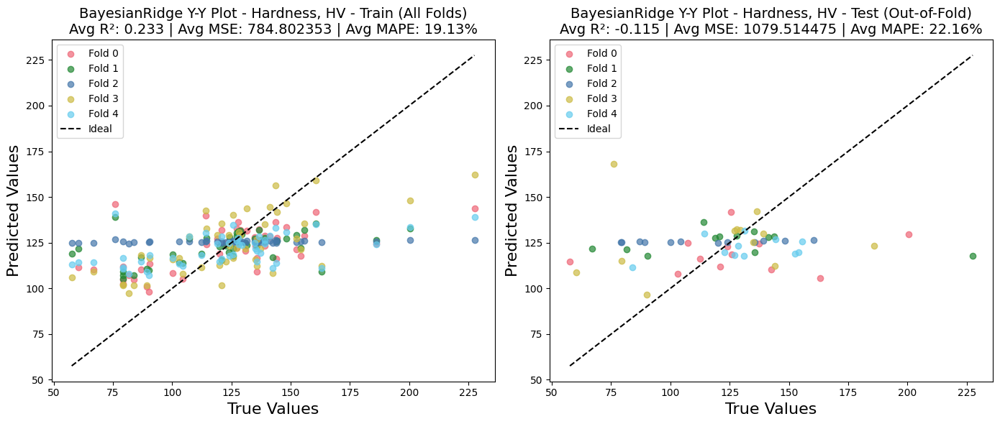

[I 2026-02-18 09:22:58,251] A new study created in memory with name: no-name-fc1d2d94-701b-4b2f-b693-fbdd4f1ef514



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 09:22:58,369] Trial 0 finished with values: [1.2760420912953019, -3.2664422526394317] and parameters: {'C': 146.19381598440845, 'gamma': 0.0019034739333415244, 'epsilon': 0.007264184304285175}.
[I 2026-02-18 09:22:58,375] Trial 1 finished with values: [1.1370273658458048, -2.7617141067118274] and parameters: {'C': 43.216034206225984, 'gamma': 0.003218656712716779, 'epsilon': 0.09281116745862983}.
[I 2026-02-18 09:22:58,409] Trial 2 finished with values: [1.2804462147331912, -3.2016850044873992] and parameters: {'C': 23.51840905208509, 'gamma': 0.00024483191351777324, 'epsilon': 0.042513249256789905}.
[I 2026-02-18 09:22:58,435] Trial 3 finished with values: [1.517648371824302, -4.004913367997997] and parameters: {'C': 0.27109818301120436, 'gamma': 0.0005885772193161177, 'epsilon': 0.02936476224201055}.
[I 2026-02-18 09:22:58,464] Trial 4 finished with values: [1.3803912557496532, -3.4454544678059293] and parameters: {'C': 0.9836764532681808, 'gamma': 0.08891670821406943, 

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- SVR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
SVR_Hardness, HV_x_scaler_fold_0.pkl and SVR_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.002 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_5_Fold_CV\models\SVR_Hardness, HV_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
SVR_Hardness, HV_x_scaler_fold_1.pkl and SVR_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.002 seconds.
Saving 

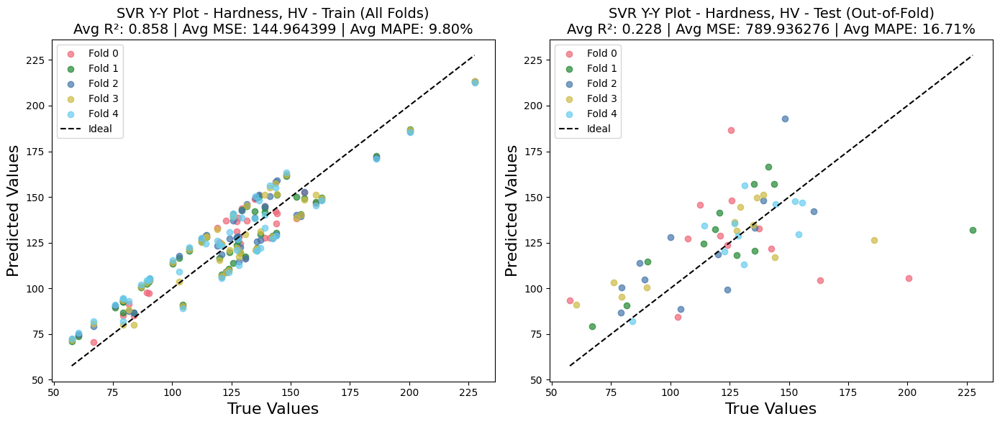

[I 2026-02-18 09:23:04,979] A new study created in memory with name: no-name-9e283735-a2a9-49c8-a728-39fd9cda5833



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 09:23:05,231] Trial 0 finished with values: [1.7408015298495862, -4.421746684947946] and parameters: {'max_depth': 36, 'min_samples_split': 20, 'min_samples_leaf': 1}.
[I 2026-02-18 09:23:05,257] Trial 2 finished with values: [1.4606316428150639, -3.7200080740585775] and parameters: {'max_depth': 42, 'min_samples_split': 12, 'min_samples_leaf': 20}.
[I 2026-02-18 09:23:05,257] Trial 1 finished with values: [1.185556923834283, -3.2404986015753523] and parameters: {'max_depth': 17, 'min_samples_split': 7, 'min_samples_leaf': 8}.
[I 2026-02-18 09:23:05,297] Trial 5 finished with values: [1.4659919195752718, -3.7052209215505982] and parameters: {'max_depth': 45, 'min_samples_split': 15, 'min_samples_leaf': 6}.
[I 2026-02-18 09:23:05,300] Trial 3 finished with values: [1.4659919195752718, -3.7052209215505982] and parameters: {'max_depth': 44, 'min_samples_split': 10, 'min_samples_leaf': 5}.
[I 2026-02-18 09:23:05,300] Trial 10 finished with values: [1.3935799105695286, -3.9123

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
DecisionTree_Hardness, HV_x_scaler_fold_0.pkl and DecisionTree_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.002 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_5_Fold_CV\models\DecisionTree_Hardness, HV_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
DecisionTree_Hardness, HV_x_scaler_fold_1.pkl and DecisionTree_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the fi

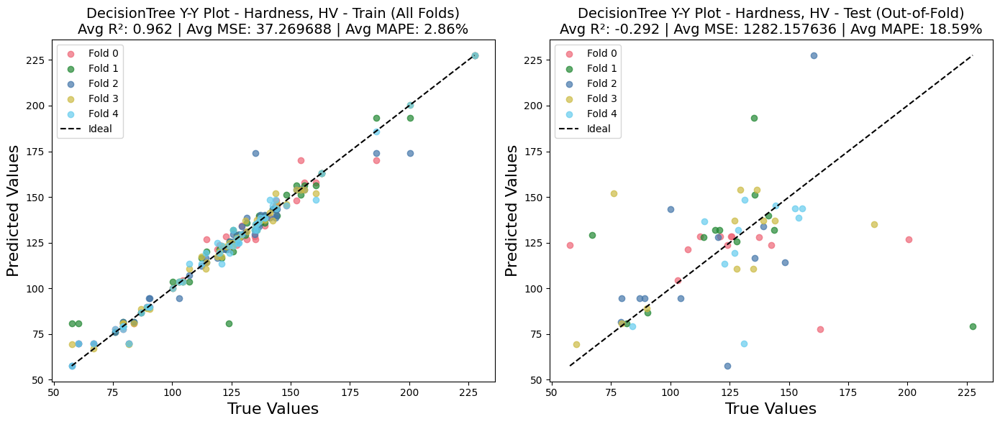

[I 2026-02-18 09:23:10,939] A new study created in memory with name: no-name-30e4f5ab-8b30-4a79-adf4-7119f10c376b



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 09:23:11,324] Trial 1 finished with values: [1.246740905362311, -2.662363682343554] and parameters: {'n_estimators': 61, 'max_depth': 5, 'min_samples_split': 12, 'min_samples_leaf': 7}.
[I 2026-02-18 09:23:11,346] Trial 0 finished with values: [1.312909449693106, -3.0703279005432242] and parameters: {'n_estimators': 101, 'max_depth': 31, 'min_samples_split': 10, 'min_samples_leaf': 5}.
[I 2026-02-18 09:23:11,815] Trial 2 finished with values: [1.4174276368763268, -3.507617722071932] and parameters: {'n_estimators': 121, 'max_depth': 27, 'min_samples_split': 13, 'min_samples_leaf': 5}.
[I 2026-02-18 09:23:12,148] Trial 4 finished with values: [1.4174276368763268, -3.507617722071932] and parameters: {'n_estimators': 154, 'max_depth': 6, 'min_samples_split': 20, 'min_samples_leaf': 6}.
[I 2026-02-18 09:23:12,240] Trial 3 finished with values: [1.4174276368763268, -3.507617722071932] and parameters: {'n_estimators': 99, 'max_depth': 24, 'min_samples_split': 4, 'min_samples_le

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- RandomForest - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
RandomForest_Hardness, HV_x_scaler_fold_0.pkl and RandomForest_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.048 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_5_Fold_CV\models\RandomForest_Hardness, HV_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
RandomForest_Hardness, HV_x_scaler_fold_1.pkl and RandomForest_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the fi

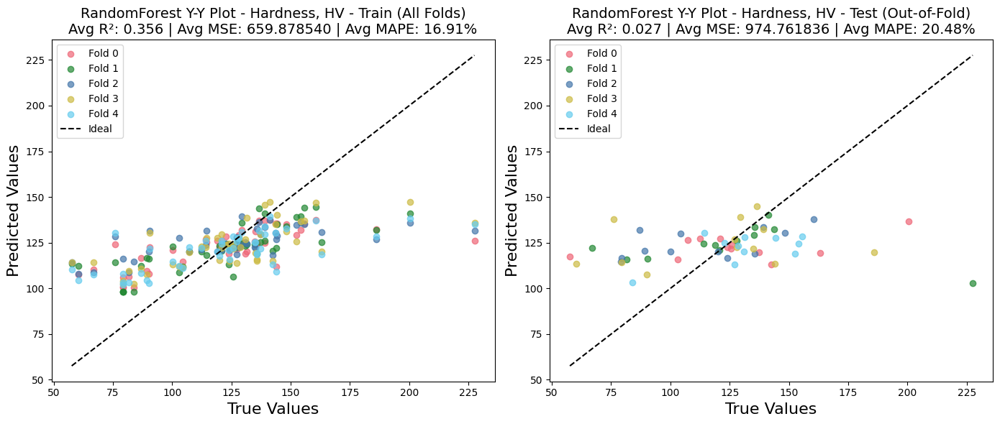

[I 2026-02-18 09:23:25,966] A new study created in memory with name: no-name-3c6a254c-a9b9-4da2-aed4-2f37b5ac0e15



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 09:23:27,226] Trial 0 finished with values: [1.2168368097457298, -2.757536259219053] and parameters: {'n_estimators': 58, 'learning_rate': 0.02123978154536799, 'max_depth': 5, 'subsample': 0.9289990804095498, 'colsample_bytree': 0.9673961391413076}.
[I 2026-02-18 09:23:27,365] Trial 7 finished with values: [1.1818809642302637, -2.5758075722362337] and parameters: {'n_estimators': 92, 'learning_rate': 0.044097608547169355, 'max_depth': 3, 'subsample': 0.6423714505054293, 'colsample_bytree': 0.7229765011319341}.
[I 2026-02-18 09:23:27,369] Trial 3 finished with values: [1.2651507903964483, -2.407974021482841] and parameters: {'n_estimators': 185, 'learning_rate': 0.04396122981805018, 'max_depth': 7, 'subsample': 0.6358931271941696, 'colsample_bytree': 0.7163396715525622}.
[I 2026-02-18 09:23:27,373] Trial 2 finished with values: [1.2651507903964483, -2.407974021482841] and parameters: {'n_estimators': 140, 'learning_rate': 0.013002949875892872, 'max_depth': 6, 'subsample': 

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- XGBoost - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
XGBoost_Hardness, HV_x_scaler_fold_0.pkl and XGBoost_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.035 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_5_Fold_CV\models\XGBoost_Hardness, HV_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
XGBoost_Hardness, HV_x_scaler_fold_1.pkl and XGBoost_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model

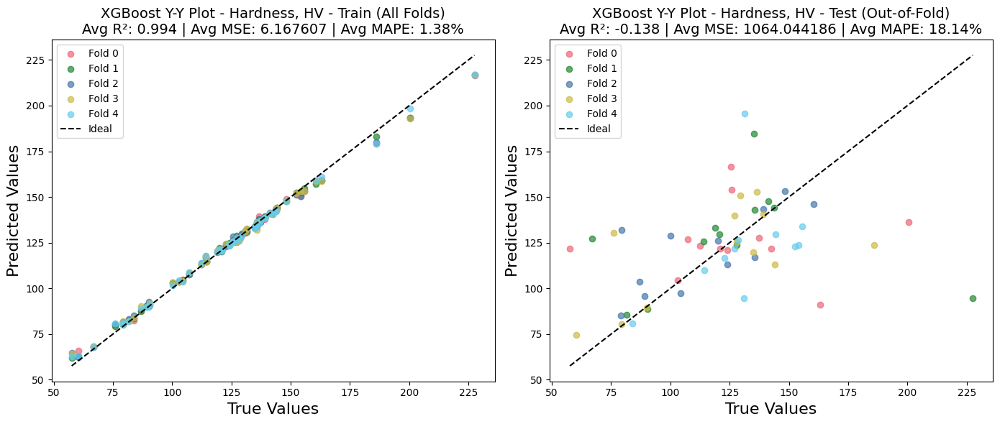

[I 2026-02-18 09:23:36,081] A new study created in memory with name: no-name-edd5296b-3d76-4eae-8fab-b47561bb6880



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 09:23:36,201] Trial 0 finished with values: [1.0071476801390635, -1.9667654001288575] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-18 09:23:36,281] Trial 1 finished with values: [1.0310832246073816, -2.028744795520423] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-18 09:23:36,372] Trial 2 finished with values: [0.9454280834807302, -1.7510559564751862] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-18 09:23:36,457] Trial 3 finished with values: [0.9644442755588013, -1.8504964287381054] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-18 09:23:36,535] Trial 4 finished with values: [1.0071476400513508, -1.9667653478241263] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-18 09:23:36,691] Trial 5 finished with values: [1.0819404094027327, -2.0063938551766247] and parameters: {'

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- GPR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
GPR_Hardness, HV_x_scaler_fold_0.pkl and GPR_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.075 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_5_Fold_CV\models\GPR_Hardness, HV_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
GPR_Hardness, HV_x_scaler_fold_1.pkl and GPR_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.068 seconds.
Saving 

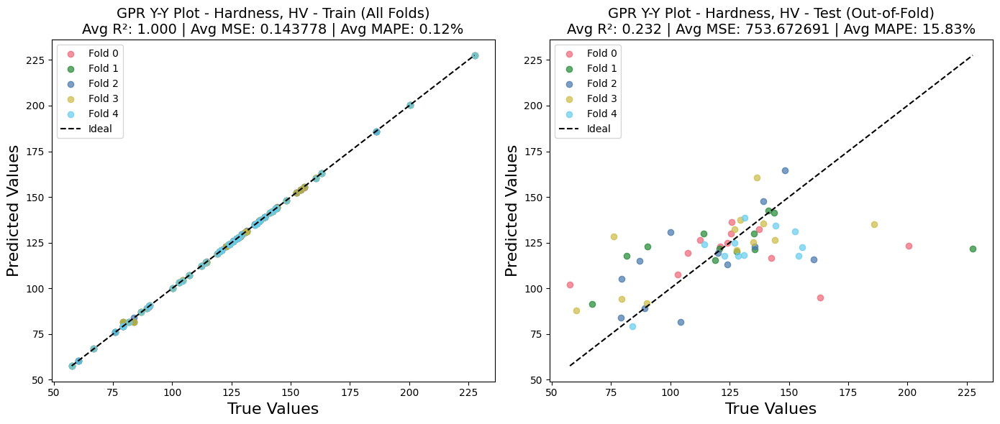

[I 2026-02-18 09:23:50,121] A new study created in memory with name: no-name-77657461-6d09-4553-9943-1dd2e3852e87



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step
[I 2026-02-18 09:24:02,179] Trial 0 finished with values: [0.9336229751333616, 0.018749593392894726] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 48ms/step
[I 2026-02-18 09:24:13,108] Trial 1 finished with values: [1.3153049934691488, -0.33432344794286945] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 52ms/step
[I 2026-02-18 09:24:26,808] Trial 2 finished with values: [0.9095966538075053, 0.05747431263394733] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 43ms/step
[I 2026-02-18 09:24:38,341] Trial 3 finished with values: [0.8076874875732593, 0.15473579016891506] and parameters: {'hidden_layers': 2, 'units': 60

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- NNR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
NNR_Hardness, HV_x_scaler_fold_0.pkl and NNR_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 2.378 seconds.
1/1 [==============================] - 0s 22ms/step
Saving model for NNR from Fold 0...
Best model for NNR for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_5_Fold_CV\models\NNR_Hardness, HV_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
NNR_Hardness, HV_x_scaler_fold_1.pkl and NNR_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fo

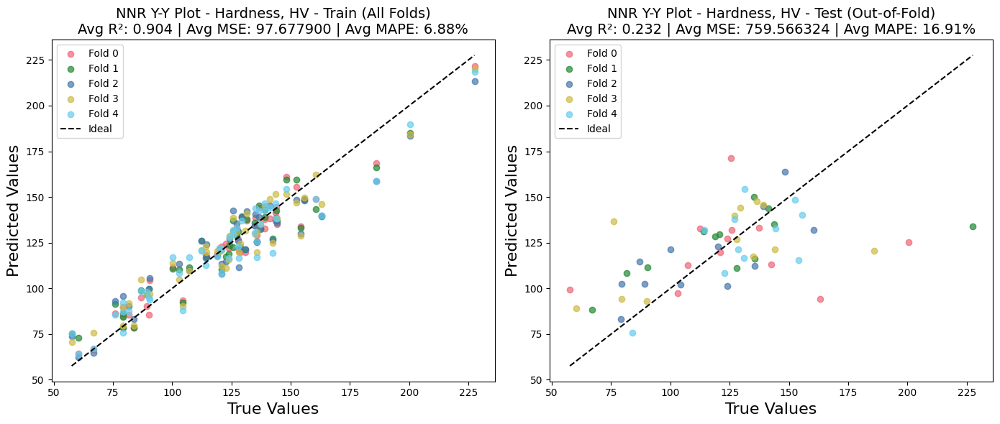


--- Workflow Complete ---
Final 5-fold CV results summary for Hardness, HV saved to C3_Hardness_HV_Results_v3_5_Fold_CV\Hardness, HV_results_5_fold_CV.csv

============================== Completed Workflow for: Hardness, HV ==============================


ALL WORKFLOWS COMPLETE.


In [19]:
print("\n" + "="*80)
print("STARTING ALL WORKFLOWS")
print("="*80 + "\n")

for target_name in target_cols:
    print(f"\n{'='*30} Processing Target: {target_name} {'='*30}")
    
    # Select the current target column as a 1D array
    y_current = y_cleaned[target_name].values 
    
    # Sanitize the target name to create a valid folder name
    # "YS (MPa)" -> "YS_MPa_Results_v3"
    # "Hardness, HV" -> "Hardness_HV_Results_v3"
    output_folder_name = target_name.replace(' ', '_').replace('(MPa)', 'MPa')
    output_folder_name = output_folder_name.replace(',', '').replace('/', '_')
    output_folder_name = f"C3_{output_folder_name}_Results_v3_5_Fold_CV"
    
    print(f"All outputs will be saved to: '{output_folder_name}' folder.")
    
    # Run the complete workflow from armote_cv.py
    run_workflow(
        X_cleaned, 
        y_current, 
        models_to_run, 
        param_spaces_to_run, 
        cv = 5,
        output_name=target_name,
        output_folder_name=output_folder_name,
        gpr_kernel_map=my_custom_kernels,
        nn_epochs=100,
        nn_batch_size=8,
        colors = ['#EE6677', '#228833', '#4477AA', '#CCBB44', '#66CCEE']
    )
    
    print(f"\n{'='*30} Completed Workflow for: {target_name} {'='*30}\n")

print("\n" + "="*80)
print("ALL WORKFLOWS COMPLETE.")
print("="*80)


STARTING ALL WORKFLOWS


============================== Processing Target: YS (MPa) ==============================
All outputs will be saved to: 'C3_YS_MPa_Results_v3_3_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'C3_YS_MPa_Results_v3_3_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
LinearRegression_YS (MPa)_x_scaler_fold_0.pkl and LinearRegression_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.011 seconds.
Saving

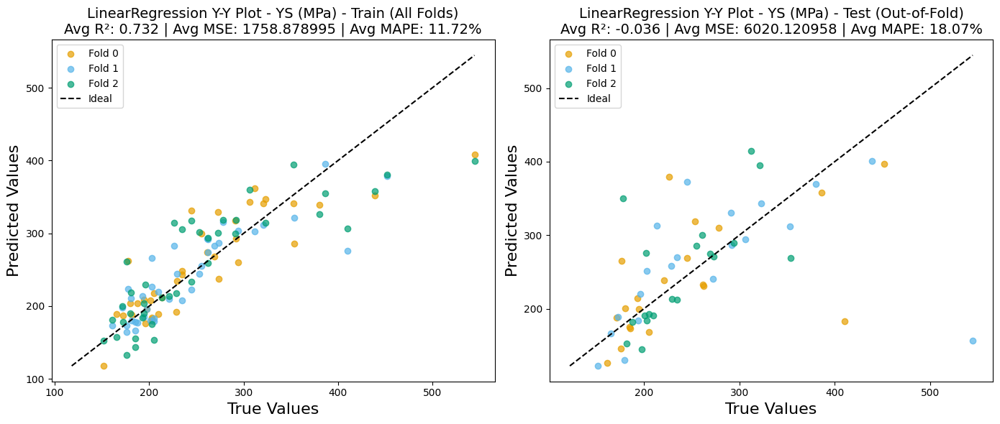

[I 2026-02-18 12:01:14,135] A new study created in memory with name: no-name-cadc0438-9b5d-41d1-8ccf-13a77478bf11



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:01:20,338] Trial 11 finished with values: [0.5634764069434909, 0.35508646972396085] and parameters: {'max_iter': 317, 'alpha_1': 3.929586661214482e-06, 'alpha_2': 8.962508003202491e-07, 'lambda_1': 5.439708227776093e-07, 'lambda_2': 2.1929123741522557e-07}.
[I 2026-02-18 12:01:20,363] Trial 2 finished with values: [0.5634764069434909, 0.35508646972396085] and parameters: {'max_iter': 200, 'alpha_1': 3.725391492727299e-07, 'alpha_2': 2.890409854386026e-07, 'lambda_1': 2.6576661437138544e-07, 'lambda_2': 2.630495040091753e-06}.
[I 2026-02-18 12:01:20,519] Trial 0 finished with values: [0.5634764069434909, 0.35508646972396085] and parameters: {'max_iter': 153, 'alpha_1': 1.4920374202961006e-07, 'alpha_2': 6.810279401583904e-06, 'lambda_1': 1.3800647135901223e-07, 'lambda_2': 7.692711976337252e-06}.
[I 2026-02-18 12:01:20,522] Trial 1 finished with values: [0.5634764069434909, 0.35508646972396085] and parameters: {'max_iter': 304, 'alpha_1': 3.5224628424369363e-06, 'alpha_

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_0.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.001 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_3_Fold_CV\models\BayesianRidge_YS (MPa)_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_1.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparamete

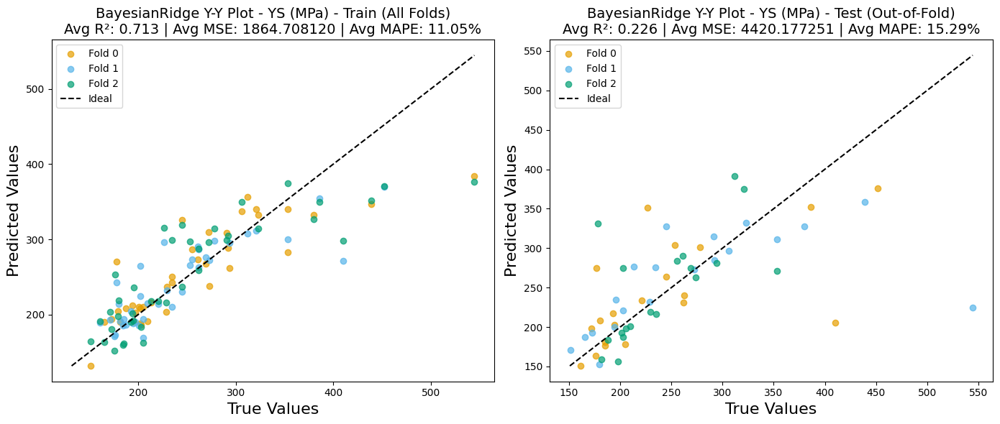

[I 2026-02-18 12:01:26,889] A new study created in memory with name: no-name-50366cd2-6e4b-4d97-9b64-c088fb3272c1



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:01:27,006] Trial 0 finished with values: [0.7678086529914494, 0.12348867648128681] and parameters: {'C': 16.966953078442515, 'gamma': 0.24261501623616413, 'epsilon': 0.37039841424874276}.
[I 2026-02-18 12:01:27,040] Trial 1 finished with values: [1.0933302024247098, -0.23565863701023995] and parameters: {'C': 0.6166009050982614, 'gamma': 0.16477941291180975, 'epsilon': 0.22026497832289677}.
[I 2026-02-18 12:01:27,043] Trial 3 finished with values: [0.9360278894514616, -0.06151691947981164] and parameters: {'C': 15.943957690262136, 'gamma': 0.1261706363176775, 'epsilon': 0.07183599578738686}.
[I 2026-02-18 12:01:27,043] Trial 2 finished with values: [1.0750793075643383, -0.20428115387882792] and parameters: {'C': 0.9961120107085019, 'gamma': 0.3286225870525921, 'epsilon': 0.265855763488967}.
[I 2026-02-18 12:01:27,043] Trial 4 finished with values: [1.0406119847208986, -0.18488254094454903] and parameters: {'C': 1267.084656336507, 'gamma': 0.030190745931396288, 'epsilon

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- SVR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
SVR_YS (MPa)_x_scaler_fold_0.pkl and SVR_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_3_Fold_CV\models\SVR_YS (MPa)_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
SVR_YS (MPa)_x_scaler_fold_1.pkl and SVR_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.000 seconds.
Saving model for SVR from Fold 1...
Best model for SVR 

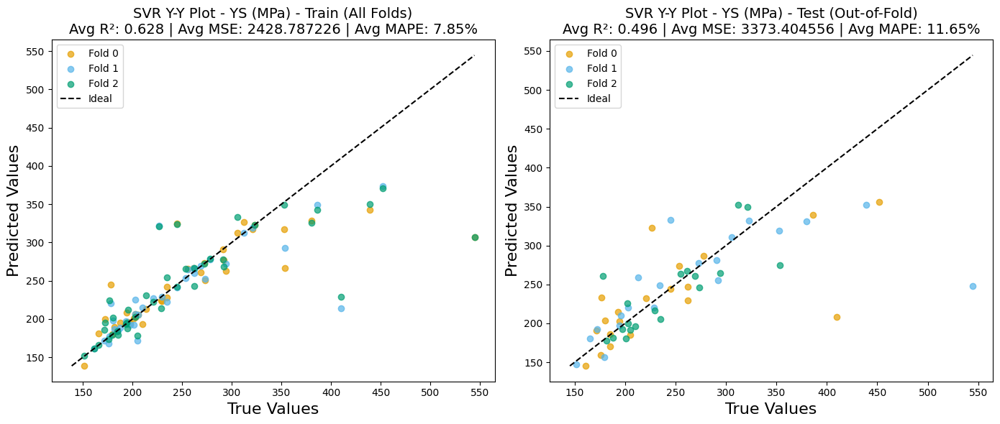

[I 2026-02-18 12:01:33,666] A new study created in memory with name: no-name-520bd025-5cef-494e-9e45-d4bf3610f930



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:01:33,872] Trial 1 finished with values: [0.8895620081256158, -0.06804182931263647] and parameters: {'max_depth': 24, 'min_samples_split': 15, 'min_samples_leaf': 13}.
[I 2026-02-18 12:01:33,914] Trial 0 finished with values: [0.9240720515939312, -0.10390934054336191] and parameters: {'max_depth': 11, 'min_samples_split': 10, 'min_samples_leaf': 1}.
[I 2026-02-18 12:01:33,917] Trial 6 finished with values: [1.2570838123384789, -0.36041527473136004] and parameters: {'max_depth': 40, 'min_samples_split': 14, 'min_samples_leaf': 13}.
[I 2026-02-18 12:01:33,918] Trial 3 finished with values: [1.2570838123384789, -0.36041527473136004] and parameters: {'max_depth': 38, 'min_samples_split': 19, 'min_samples_leaf': 17}.
[I 2026-02-18 12:01:33,918] Trial 5 finished with values: [1.2570838123384789, -0.36041527473136004] and parameters: {'max_depth': 44, 'min_samples_split': 4, 'min_samples_leaf': 8}.
[I 2026-02-18 12:01:33,923] Trial 2 finished with values: [0.7613091759333166,

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
DecisionTree_YS (MPa)_x_scaler_fold_0.pkl and DecisionTree_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_3_Fold_CV\models\DecisionTree_YS (MPa)_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
DecisionTree_YS (MPa)_x_scaler_fold_1.pkl and DecisionTree_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 

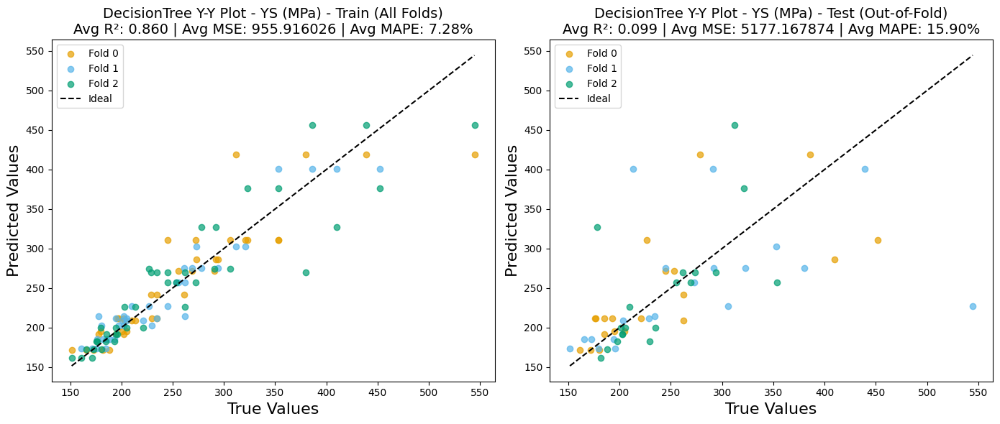

[I 2026-02-18 12:01:39,473] A new study created in memory with name: no-name-bea5ca95-15cf-4588-a989-792c36ece7dd



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:01:39,942] Trial 0 finished with values: [0.66092659201992, 0.26547469942624163] and parameters: {'n_estimators': 104, 'max_depth': 24, 'min_samples_split': 19, 'min_samples_leaf': 3}.
[I 2026-02-18 12:01:39,945] Trial 1 finished with values: [0.66092659201992, 0.26547469942624163] and parameters: {'n_estimators': 113, 'max_depth': 32, 'min_samples_split': 10, 'min_samples_leaf': 2}.
[I 2026-02-18 12:01:39,946] Trial 4 finished with values: [0.6365023958395924, 0.26995110563251196] and parameters: {'n_estimators': 167, 'max_depth': 26, 'min_samples_split': 12, 'min_samples_leaf': 7}.
[I 2026-02-18 12:01:40,058] Trial 3 finished with values: [0.589385863767905, 0.32233608338094427] and parameters: {'n_estimators': 67, 'max_depth': 43, 'min_samples_split': 13, 'min_samples_leaf': 7}.
[I 2026-02-18 12:01:40,081] Trial 2 finished with values: [0.589385863767905, 0.32233608338094427] and parameters: {'n_estimators': 58, 'max_depth': 32, 'min_samples_split': 19, 'min_samples

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- RandomForest - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
RandomForest_YS (MPa)_x_scaler_fold_0.pkl and RandomForest_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.062 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_3_Fold_CV\models\RandomForest_YS (MPa)_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
RandomForest_YS (MPa)_x_scaler_fold_1.pkl and RandomForest_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 

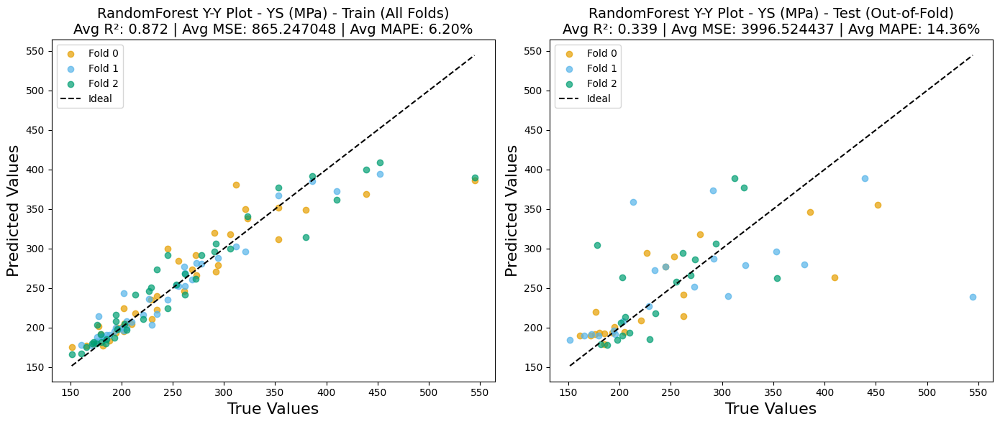

[I 2026-02-18 12:01:49,617] A new study created in memory with name: no-name-de029742-3feb-4a2f-9baa-ac740d9bbcbc



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:01:51,973] Trial 2 finished with values: [0.6289932727566779, 0.27721120703181884] and parameters: {'n_estimators': 104, 'learning_rate': 0.4544323991737502, 'max_depth': 7, 'subsample': 0.6814762027371496, 'colsample_bytree': 0.8426316654710835}.
[I 2026-02-18 12:01:51,987] Trial 3 finished with values: [0.6382920637616935, 0.2731759544288924] and parameters: {'n_estimators': 199, 'learning_rate': 0.12481574617710599, 'max_depth': 7, 'subsample': 0.9193557655047919, 'colsample_bytree': 0.7772403882882996}.
[I 2026-02-18 12:01:51,988] Trial 5 finished with values: [0.6280773172740928, 0.29073745144361024] and parameters: {'n_estimators': 88, 'learning_rate': 0.015358694596657691, 'max_depth': 10, 'subsample': 0.7459178799343538, 'colsample_bytree': 0.8098163227551163}.
[I 2026-02-18 12:01:52,023] Trial 1 finished with values: [0.6165730379967789, 0.29856444530580106] and parameters: {'n_estimators': 62, 'learning_rate': 0.04612832471879999, 'max_depth': 8, 'subsample':

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- XGBoost - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
XGBoost_YS (MPa)_x_scaler_fold_0.pkl and XGBoost_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.136 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_3_Fold_CV\models\XGBoost_YS (MPa)_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
XGBoost_YS (MPa)_x_scaler_fold_1.pkl and XGBoost_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.038 seconds.
Saving mode

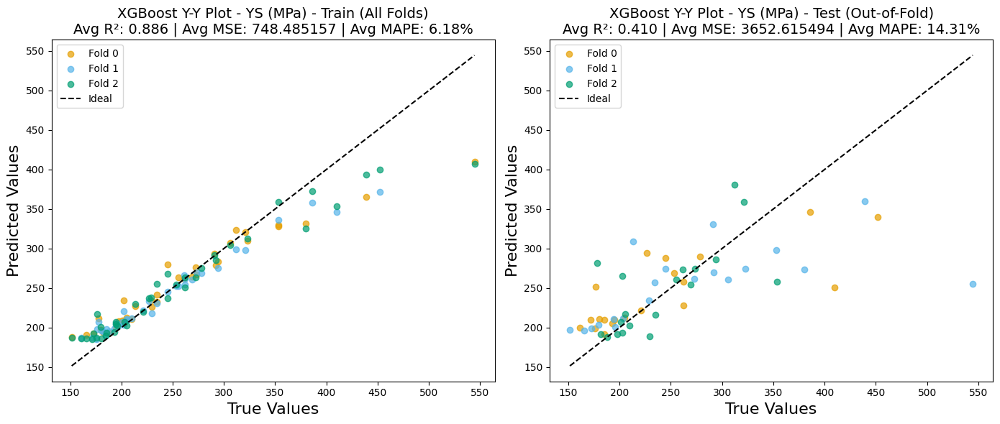

[I 2026-02-18 12:02:01,027] A new study created in memory with name: no-name-b4a80b09-9770-4728-9dc8-f760493fa692



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:02:01,120] Trial 0 finished with values: [0.8584815123609563, 0.004720174107040583] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-18 12:02:01,199] Trial 1 finished with values: [0.6553981332999091, 0.257392996941826] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-18 12:02:01,266] Trial 2 finished with values: [0.899345094475069, -0.037750795167112584] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-18 12:02:01,332] Trial 3 finished with values: [0.8696442822594851, -0.00688168841903769] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-18 12:02:01,399] Trial 4 finished with values: [0.8584815124813906, 0.004720173981868858] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-18 12:02:01,490] Trial 5 finished with values: [0.8091145576867241, 0.07680369669373865] and parameters:

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- GPR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
GPR_YS (MPa)_x_scaler_fold_0.pkl and GPR_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.083 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_3_Fold_CV\models\GPR_YS (MPa)_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
GPR_YS (MPa)_x_scaler_fold_1.pkl and GPR_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.043 seconds.
Saving model for GPR from Fold 1...
Best model for GPR 

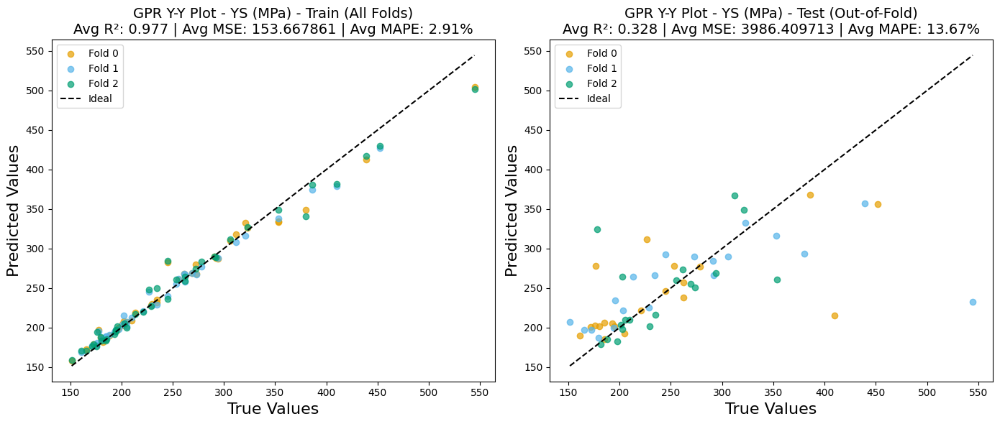

[I 2026-02-18 12:02:13,017] A new study created in memory with name: no-name-59aae2ec-9963-4cb2-b78f-207369cccbaa



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step
[I 2026-02-18 12:02:22,401] Trial 0 finished with values: [0.5968751417262794, 0.4030721072238988] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 57ms/step
[I 2026-02-18 12:02:27,536] Trial 1 finished with values: [0.7908709847846208, 0.07941637317939458] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 61ms/step
[I 2026-02-18 12:02:33,901] Trial 2 finished with values: [1.1972396243011345, -0.26488105555955627] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 52ms/step
[I 2026-02-18 12:02:39,270] Trial 3 finished with values: [0.6241331737451928, 0.33656800670869563] and parameters: {'hidden_layers': 2, 'units': 60, 

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for YS (MPa) saved as PNGs in 'C3_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- NNR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
NNR_YS (MPa)_x_scaler_fold_0.pkl and NNR_YS (MPa)_y_scaler_fold_0.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 2.006 seconds.
1/1 [==============================] - 0s 19ms/step
Saving model for NNR from Fold 0...
Best model for NNR for YS (MPa) (Fold 0) saved to: C3_YS_MPa_Results_v3_3_Fold_CV\models\NNR_YS (MPa)_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
NNR_YS (MPa)_x_scaler_fold_1.pkl and NNR_YS (MPa)_y_scaler_fold_1.pkl saved in 'C3_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 1.928 seconds.
1

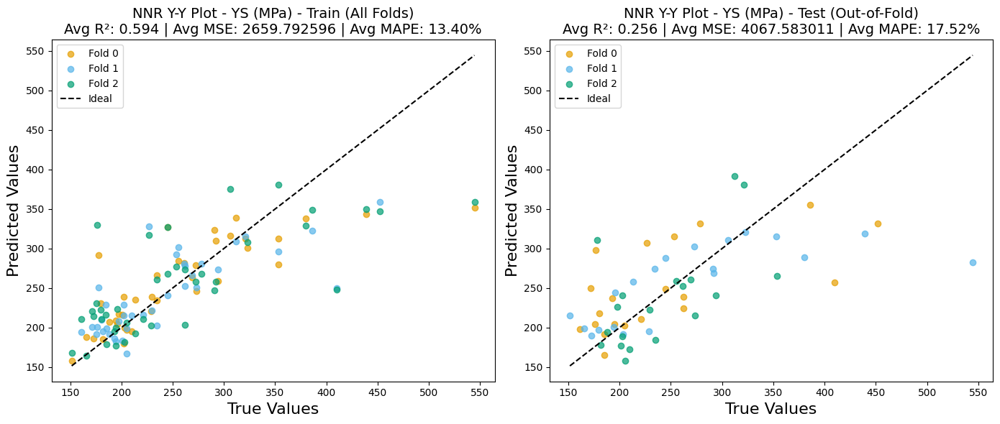


--- Workflow Complete ---
Final 3-fold CV results summary for YS (MPa) saved to C3_YS_MPa_Results_v3_3_Fold_CV\YS (MPa)_results_3_fold_CV.csv

============================== Completed Workflow for: YS (MPa) ==============================


============================== Processing Target: Hardness, HV ==============================
All outputs will be saved to: 'C3_Hardness_HV_Results_v3_3_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'C3_Hardness_HV_Results_v3_3_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
LinearRegression_Hardness, 

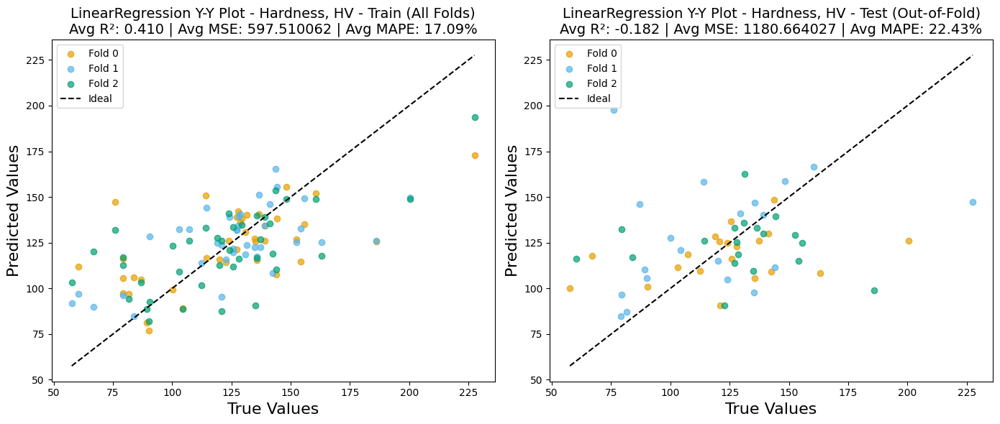

[I 2026-02-18 12:11:17,604] A new study created in memory with name: no-name-6e663c41-44a9-4769-a7f7-6e043ccab047



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:11:23,185] Trial 0 finished with values: [2.049889252438328, -2.3737865170084667] and parameters: {'max_iter': 374, 'alpha_1': 2.5624624116077835e-07, 'alpha_2': 4.97011016541194e-07, 'lambda_1': 1.2682447381816063e-07, 'lambda_2': 4.126134393814393e-06}.
[I 2026-02-18 12:11:23,220] Trial 6 finished with values: [2.0499032396867425, -2.3738085766423977] and parameters: {'max_iter': 399, 'alpha_1': 1.561898584393236e-07, 'alpha_2': 2.0116159208742565e-07, 'lambda_1': 2.052590307157107e-07, 'lambda_2': 6.913873495152399e-06}.
[I 2026-02-18 12:11:23,343] Trial 5 finished with values: [2.0499032396867425, -2.3738085766423977] and parameters: {'max_iter': 281, 'alpha_1': 3.023445543239325e-06, 'alpha_2': 6.718418371641769e-07, 'lambda_1': 3.3042956617304856e-06, 'lambda_2': 2.386738374258594e-07}.
[I 2026-02-18 12:11:23,347] Trial 12 finished with values: [2.0499032396867425, -2.3738085766423977] and parameters: {'max_iter': 317, 'alpha_1': 6.756886044877436e-07, 'alpha_2':

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_0.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.002 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_3_Fold_CV\models\BayesianRidge_Hardness, HV_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_1.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retrai

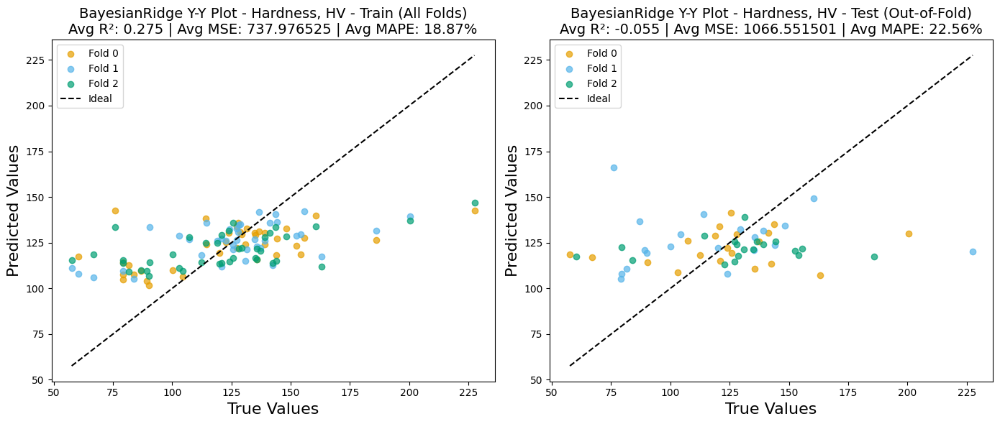

[I 2026-02-18 12:11:31,393] A new study created in memory with name: no-name-dfa94e08-9d56-4608-9ead-d3bb1cf377ed



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:11:31,526] Trial 0 finished with values: [1.9951927625717223, -2.289506977860646] and parameters: {'C': 122.72247175096726, 'gamma': 0.00014065829868367411, 'epsilon': 0.04472274842685078}.
[I 2026-02-18 12:11:31,551] Trial 2 finished with values: [1.6420755411676347, -1.719975012023118] and parameters: {'C': 72.71656757761171, 'gamma': 0.03663893882655789, 'epsilon': 0.0014399680813941315}.
[I 2026-02-18 12:11:31,554] Trial 3 finished with values: [1.4813372856820992, -1.4572816849325996] and parameters: {'C': 328.3105110102174, 'gamma': 0.011935164677596253, 'epsilon': 0.021055562044772193}.
[I 2026-02-18 12:11:31,555] Trial 5 finished with values: [1.5807146264285532, -1.635236712735961] and parameters: {'C': 6.736927338483132, 'gamma': 0.001526916192501698, 'epsilon': 0.003967487150677077}.
[I 2026-02-18 12:11:31,555] Trial 1 finished with values: [1.6155726488731466, -1.6660250796131173] and parameters: {'C': 8163.312378093313, 'gamma': 0.374324247104903, 'epsilon

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- SVR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
SVR_Hardness, HV_x_scaler_fold_0.pkl and SVR_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.002 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_3_Fold_CV\models\SVR_Hardness, HV_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
SVR_Hardness, HV_x_scaler_fold_1.pkl and SVR_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.000 seconds.
Saving 

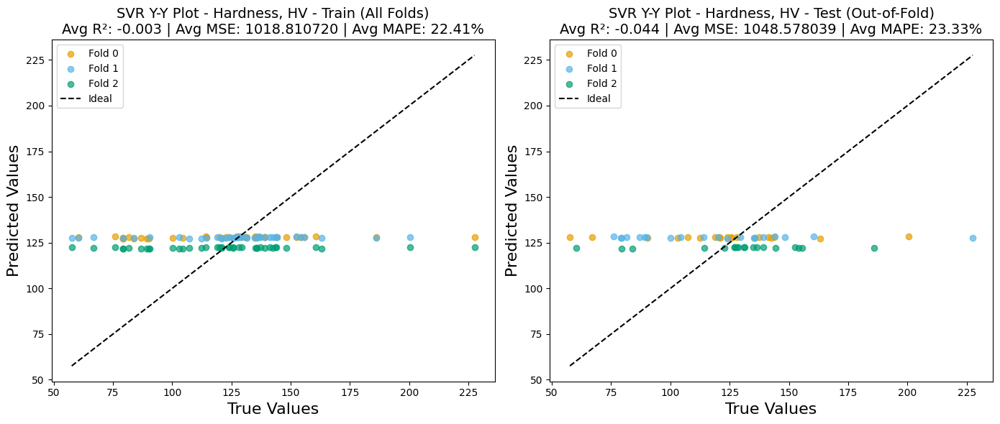

[I 2026-02-18 12:11:38,164] A new study created in memory with name: no-name-d4b7d08c-cd5b-473c-acd0-e1e63b3eece1



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:11:38,336] Trial 1 finished with values: [1.9619066260421254, -2.255849452978391] and parameters: {'max_depth': 17, 'min_samples_split': 14, 'min_samples_leaf': 7}.
[I 2026-02-18 12:11:38,419] Trial 14 finished with values: [1.9854649991976097, -2.2982181601431706] and parameters: {'max_depth': 26, 'min_samples_split': 6, 'min_samples_leaf': 6}.
[I 2026-02-18 12:11:38,423] Trial 2 finished with values: [2.411334744953797, -3.064126333394191] and parameters: {'max_depth': 31, 'min_samples_split': 15, 'min_samples_leaf': 14}.
[I 2026-02-18 12:11:38,423] Trial 11 finished with values: [1.9854649991976097, -2.2982181601431706] and parameters: {'max_depth': 46, 'min_samples_split': 18, 'min_samples_leaf': 18}.
[I 2026-02-18 12:11:38,423] Trial 13 finished with values: [1.9854649991976097, -2.2982181601431706] and parameters: {'max_depth': 45, 'min_samples_split': 10, 'min_samples_leaf': 14}.
[I 2026-02-18 12:11:38,424] Trial 6 finished with values: [1.9854649991976097, -2.2

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
DecisionTree_Hardness, HV_x_scaler_fold_0.pkl and DecisionTree_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.001 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_3_Fold_CV\models\DecisionTree_Hardness, HV_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
DecisionTree_Hardness, HV_x_scaler_fold_1.pkl and DecisionTree_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the fi

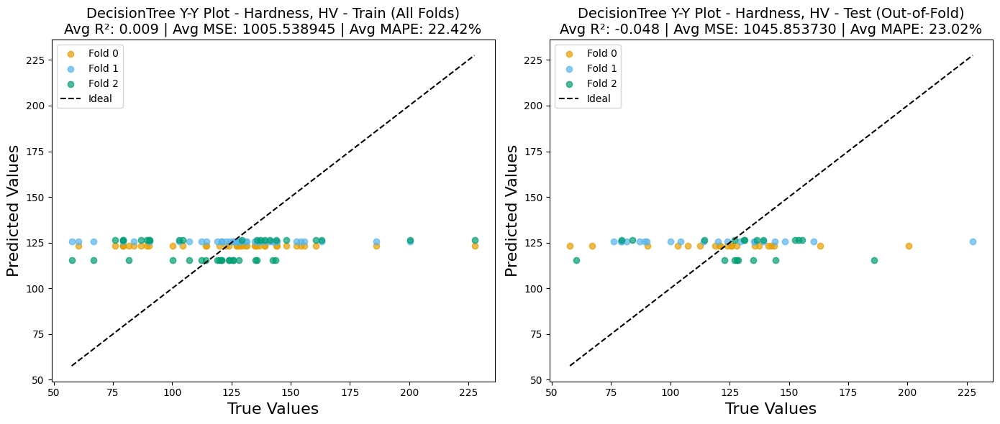

[I 2026-02-18 12:11:44,300] A new study created in memory with name: no-name-d96a067b-04a9-48bf-b485-9a980cdc02fa



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:11:44,632] Trial 0 finished with values: [2.6028396434289895, -3.3106690956281546] and parameters: {'n_estimators': 189, 'max_depth': 18, 'min_samples_split': 20, 'min_samples_leaf': 4}.
[I 2026-02-18 12:11:44,869] Trial 1 finished with values: [2.2262362698907707, -2.700085676983541] and parameters: {'n_estimators': 87, 'max_depth': 21, 'min_samples_split': 14, 'min_samples_leaf': 5}.
[I 2026-02-18 12:11:44,891] Trial 2 finished with values: [2.2262362698907707, -2.700085676983541] and parameters: {'n_estimators': 70, 'max_depth': 28, 'min_samples_split': 4, 'min_samples_leaf': 4}.
[I 2026-02-18 12:11:45,002] Trial 4 finished with values: [2.2262362698907707, -2.700085676983541] and parameters: {'n_estimators': 89, 'max_depth': 23, 'min_samples_split': 12, 'min_samples_leaf': 1}.
[I 2026-02-18 12:11:45,051] Trial 3 finished with values: [2.2262362698907707, -2.700085676983541] and parameters: {'n_estimators': 100, 'max_depth': 13, 'min_samples_split': 20, 'min_samples

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- RandomForest - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
RandomForest_Hardness, HV_x_scaler_fold_0.pkl and RandomForest_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.153 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_3_Fold_CV\models\RandomForest_Hardness, HV_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
RandomForest_Hardness, HV_x_scaler_fold_1.pkl and RandomForest_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the fi

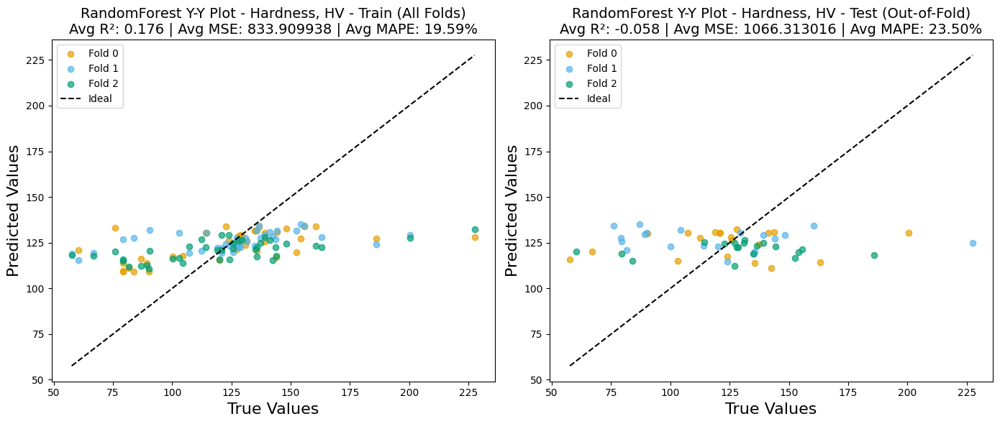

[I 2026-02-18 12:11:56,731] A new study created in memory with name: no-name-023de804-e041-4e07-906d-23db8bfad1ac



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:11:57,764] Trial 2 finished with values: [2.633350378601512, -3.322595396967579] and parameters: {'n_estimators': 168, 'learning_rate': 0.42432207185138193, 'max_depth': 5, 'subsample': 0.6957552496195576, 'colsample_bytree': 0.8489997452300608}.
[I 2026-02-18 12:11:57,787] Trial 6 finished with values: [2.622125693501164, -3.302931806617153] and parameters: {'n_estimators': 55, 'learning_rate': 0.12003864468890016, 'max_depth': 10, 'subsample': 0.7623079626117315, 'colsample_bytree': 0.9525434222581437}.
[I 2026-02-18 12:11:57,790] Trial 5 finished with values: [2.622125693501164, -3.302931806617153] and parameters: {'n_estimators': 119, 'learning_rate': 0.013932256969394385, 'max_depth': 4, 'subsample': 0.952386173292399, 'colsample_bytree': 0.7492621133512576}.
[I 2026-02-18 12:11:57,794] Trial 0 finished with values: [2.9881577611628636, -3.9035908395071672] and parameters: {'n_estimators': 129, 'learning_rate': 0.18993316229411955, 'max_depth': 9, 'subsample': 0.6

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- XGBoost - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
XGBoost_Hardness, HV_x_scaler_fold_0.pkl and XGBoost_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.022 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_3_Fold_CV\models\XGBoost_Hardness, HV_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
XGBoost_Hardness, HV_x_scaler_fold_1.pkl and XGBoost_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model

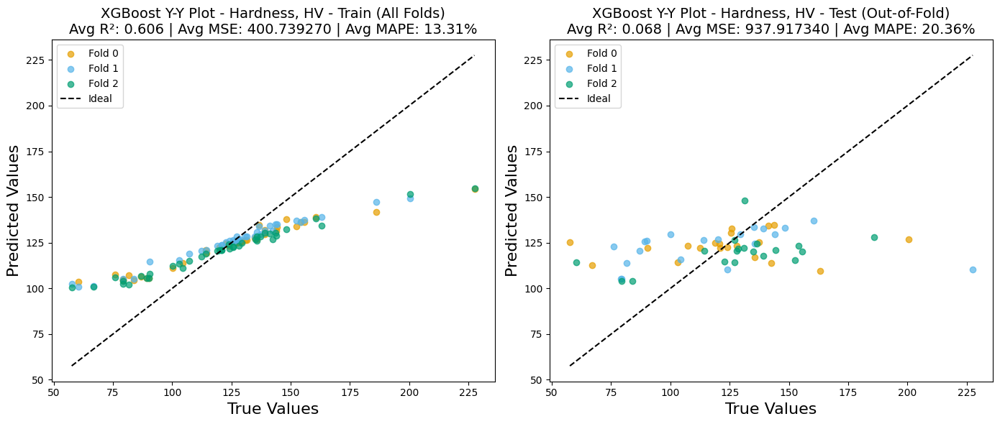

[I 2026-02-18 12:12:05,958] A new study created in memory with name: no-name-7c53e8e0-2e7b-4c40-82a4-715c41e14654



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 12:12:06,072] Trial 0 finished with values: [1.800546676945089, -1.949439373583795] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-18 12:12:06,151] Trial 1 finished with values: [1.8225649251276528, -1.988504400077869] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-18 12:12:06,239] Trial 2 finished with values: [1.5420766644053028, -1.517193813344419] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-18 12:12:06,330] Trial 3 finished with values: [1.6458564845029633, -1.6791271948739503] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-18 12:12:06,421] Trial 4 finished with values: [1.800546635170514, -1.9494392983473896] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-18 12:12:06,578] Trial 5 finished with values: [1.8195985950969484, -1.9758592345700432] and parameters: {'kern

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- GPR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
GPR_Hardness, HV_x_scaler_fold_0.pkl and GPR_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.091 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_3_Fold_CV\models\GPR_Hardness, HV_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
GPR_Hardness, HV_x_scaler_fold_1.pkl and GPR_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.052 seconds.
Saving 

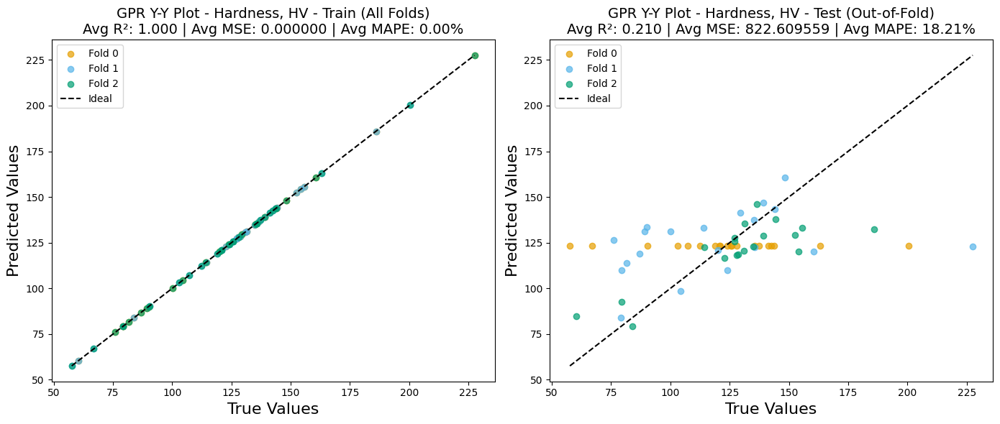

[I 2026-02-18 12:12:18,961] A new study created in memory with name: no-name-44bff07e-6cd0-4354-89b7-d78c33b234f0



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step
[I 2026-02-18 12:12:23,925] Trial 0 finished with values: [0.9855671683886795, 0.006584772775274583] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 49ms/step
[I 2026-02-18 12:12:28,398] Trial 1 finished with values: [1.4346498623357888, -0.4731034717291022] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 54ms/step
[I 2026-02-18 12:12:34,051] Trial 2 finished with values: [1.0896447948709769, -0.1211926372358525] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 43ms/step
[I 2026-02-18 12:12:38,831] Trial 3 finished with values: [0.9328192848775066, 0.07481417125599928] and parameters: {'hidden_layers': 2, 'units': 60,

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for Hardness, HV saved as PNGs in 'C3_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- NNR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
NNR_Hardness, HV_x_scaler_fold_0.pkl and NNR_Hardness, HV_y_scaler_fold_0.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 1.871 seconds.
1/1 [==============================] - 0s 18ms/step
Saving model for NNR from Fold 0...
Best model for NNR for Hardness, HV (Fold 0) saved to: C3_Hardness_HV_Results_v3_3_Fold_CV\models\NNR_Hardness, HV_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
NNR_Hardness, HV_x_scaler_fold_1.pkl and NNR_Hardness, HV_y_scaler_fold_1.pkl saved in 'C3_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fo

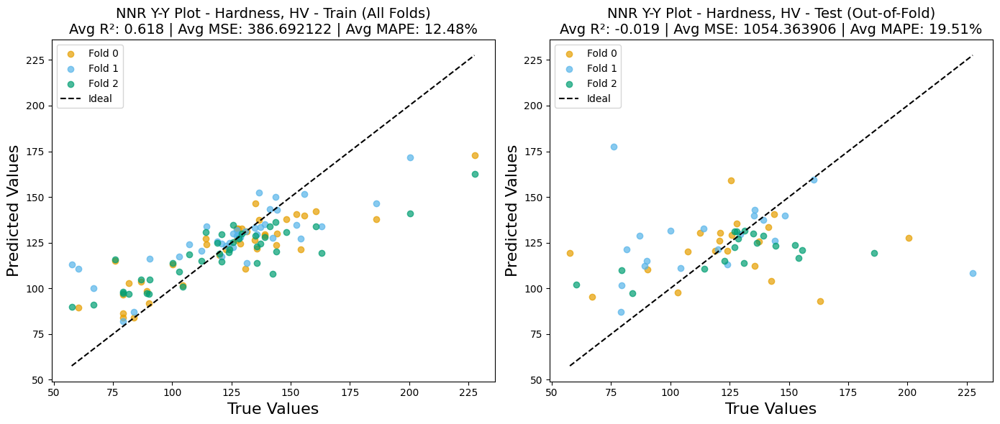


--- Workflow Complete ---
Final 3-fold CV results summary for Hardness, HV saved to C3_Hardness_HV_Results_v3_3_Fold_CV\Hardness, HV_results_3_fold_CV.csv

============================== Completed Workflow for: Hardness, HV ==============================


ALL WORKFLOWS COMPLETE.


In [10]:
print("\n" + "="*80)
print("STARTING ALL WORKFLOWS")
print("="*80 + "\n")

for target_name in target_cols:
    print(f"\n{'='*30} Processing Target: {target_name} {'='*30}")
    
    # Select the current target column as a 1D array
    y_current = y_cleaned[target_name].values 
    
    # Sanitize the target name to create a valid folder name
    # "YS (MPa)" -> "YS_MPa_Results_v3"
    # "Hardness, HV" -> "Hardness_HV_Results_v3"
    output_folder_name = target_name.replace(' ', '_').replace('(MPa)', 'MPa')
    output_folder_name = output_folder_name.replace(',', '').replace('/', '_')
    output_folder_name = f"C3_{output_folder_name}_Results_v3_3_Fold_CV"
    
    print(f"All outputs will be saved to: '{output_folder_name}' folder.")
    
    # Run the complete workflow from armote_cv.py
    run_workflow(
        X_cleaned, 
        y_current, 
        models_to_run, 
        param_spaces_to_run, 
        cv = 3,
        output_name=target_name,
        output_folder_name=output_folder_name,
        gpr_kernel_map=my_custom_kernels,
        nn_epochs=100,
        nn_batch_size=8,
        colors = ["#E69F00", "#56B4E9", "#009E73"]
    )
    
    print(f"\n{'='*30} Completed Workflow for: {target_name} {'='*30}\n")

print("\n" + "="*80)
print("ALL WORKFLOWS COMPLETE.")
print("="*80)

In [11]:
# Filter for rows where Al = 0 and Cu = 0
filtered_df = df[(df['Al'] == 0) & (df['Cu'] == 0)]
filtered_df.head()

,Alloy Name,Al,Co,Cr,Cu,Fe,Mn,Ni,V,"Hardness, HV","SD, HV",YS (MPa),"SD, YS",Cold Work (%Reduction),Recrystallization Temp(℃),Holding time (h),Grain Size(µm),"SD, Grain Size(µm)"
6,BBA08,0,24.0,8,0,12.0,16,32.0,8,135.800000,5.900000,270.200000,2.300000,60,950,0.5,33.19,21.00
18,BBB01,0,24.0,4,0,8.0,4,36.0,24,203.700000,5.400000,431.540000,9.400000,60,950,0.5,27.40,25.34
24,BBB12,0,20.0,4,0,4.0,4,48.0,20,207.500000,5.200000,418.340000,NaN,60,950,0.5,29.10,24.65
33,BBC14,0,12.0,4,0,4.0,16,40.0,24,198.100000,12.440000,406.380000,7.400000,60,950,0.5,20.05,15.04
35,CBA01,0,8.0,8,0,24.0,8,44.0,8,120.888889,4.136558,175.751054,1.360078,50,1150,2.0,211.75,158.69


In [12]:
# Composition columns
composition_cols = ['Co', 'Cr', 'Fe', 'Mn', 'Ni', 'V']

# Processing columns
processing_cols = [
    'Cold Work (%Reduction)', 
    'Recrystallization Temp(℃)', 
    'Holding time (h)'
    ]

# Grain size column
grain_size_col = ['Grain Size(µm)']

# Feature columns
feature_cols = composition_cols + processing_cols + grain_size_col

# Target columns
target_cols = ['YS (MPa)', 'Hardness, HV']

In [13]:
#--- Prepare Input (X) and Output (y) DataFrames ---
X = filtered_df[feature_cols].copy()
y = filtered_df[target_cols].copy()

print(f"Data loaded successfully. Found {X.shape[0]} samples.")
print(f"Features (X shape): {X.shape}")
print(f"Targets (y shape): {y.shape}")

Data loaded successfully. Found 63 samples.
Features (X shape): (63, 10)
Targets (y shape): (63, 2)


In [14]:
# --- Handle Missing Values ---
print("\n" + "-"*30)
print("Checking for missing data (NaNs)...")
# Combine X and y to ensure we drop the same rows from both
full_data = pd.concat([X, y], axis=1)
initial_rows = full_data.shape[0]
nan_rows = full_data.isna().any(axis=1).sum()

if nan_rows > 0:
    print(f"Found {nan_rows} rows with one or more NaN values. Dropping them...")
    # Drop all rows that have a NaN in *any* column (X or y)
    full_data_cleaned = full_data.dropna()
    final_rows = full_data_cleaned.shape[0]
    
    # Re-split into X and y
    X_cleaned = full_data_cleaned[feature_cols]
    y_cleaned = full_data_cleaned[target_cols]
    
    print(f"Dropped {initial_rows - final_rows} rows.")
    print(f"Proceeding with {final_rows} complete samples.")
else:
    print("No missing data found.")
    X_cleaned = X
    y_cleaned = y
print("-"*30 + "\n")


------------------------------
Checking for missing data (NaNs)...
No missing data found.
------------------------------



In [15]:
# --- Define Models to Run ---
models_to_run = {
    "LinearRegression": LinearRegression(),
    "BayesianRidge": BayesianRidge(),
    "SVR": SVR(),
    "DecisionTree": DecisionTreeRegressor(random_state=42),
    "RandomForest": RandomForestRegressor(random_state=42),
    "XGBoost": XGBRegressor(random_state=42, n_jobs=-1),
    "GPR": GaussianProcessRegressor(random_state=42, n_restarts_optimizer=9),  # Must be named "GPR"
    "NNR": None,                                     # Must be named "NNR"
}

# --- Define GPR Kernel Map ---
# This dictionary is passed to armote.py
# The keys (e.g., "RBF_1", "Matern_1.5") are your custom names
# which MUST match the 'categorical' list for "GPR" in param_spaces_to_run.
my_custom_kernels = {
    "RBF_default": RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2)),
    "Matern_nu_0.5": Matern(length_scale=1.0, nu=0.5, length_scale_bounds=(1e-2, 1e2)),
    "Matern_nu_1.5": Matern(length_scale=1.0, nu=1.5, length_scale_bounds=(1e-2, 1e2)),
    "Matern_nu_2.5": Matern(length_scale=1.0, nu=2.5, length_scale_bounds=(1e-2, 1e2)),
    "RationalQuadratic": RationalQuadratic(length_scale=1.0, alpha=0.1, 
                                           length_scale_bounds=(1e-2, 1e2), 
                                           alpha_bounds=(1e-2, 1e2))
}

# --- Define Hyperparameter Search Spaces ---
param_spaces_to_run = {
    "LinearRegression": None,  # No tuning
    
    "BayesianRidge": {
        "max_iter": ("int", 100, 500),  
        "alpha_1": ("float", 1e-7, 1e-5, "log"),
        "alpha_2": ("float", 1e-7, 1e-5, "log"), 
        "lambda_1": ("float", 1e-7, 1e-5, "log"),
        "lambda_2": ("float", 1e-7, 1e-5, "log"),
    },
    
    "SVR": {
        "C": ("float", 0.1, 10002, "log"),
        "gamma": ("float", 1e-4, 1.0, "log"),
        "epsilon": ("float", 1e-3, 0.5, "log"),
    },
    
    "DecisionTree": {
        "max_depth": ("int", 5, 50),
        "min_samples_split": ("int", 2, 20),
        "min_samples_leaf": ("int", 1, 20),
    },
    
    "RandomForest": {
        "n_estimators": ("int", 50, 200),
        "max_depth": ("int", 5, 50),
        "min_samples_split": ("int", 2, 20),
        "min_samples_leaf": ("int", 1, 10),
    },
    
    "XGBoost": {
        "n_estimators": ("int", 50, 200),
        "learning_rate": ("float", 0.01, 0.5, "log"),
        "max_depth": ("int", 3, 10),
        "subsample": ("float", 0.6, 1.0),
        "colsample_bytree": ("float", 0.6, 1.0),
    },
    
    "GPR": {
        "kernel": ("categorical", list(my_custom_kernels.keys())),
        "alpha": ("float", 1e-10, 1e-1, "log"),
    },
    
    "NNR": {
        "hidden_layers": ("int", 1, 4),
        "units": ("int", 32, 128), # Units in the *first* hidden layer
        "activation": ("categorical", ["relu", "tanh", "selu"]),
        "learning_rate": ("float", 1e-5, 1e-2, "log"),
    }
}


STARTING ALL WORKFLOWS


============================== Processing Target: YS (MPa) ==============================
All outputs will be saved to: 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
LinearRegression_YS (MPa)_x_scaler_fold_0.pkl and LinearRegression_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 mode

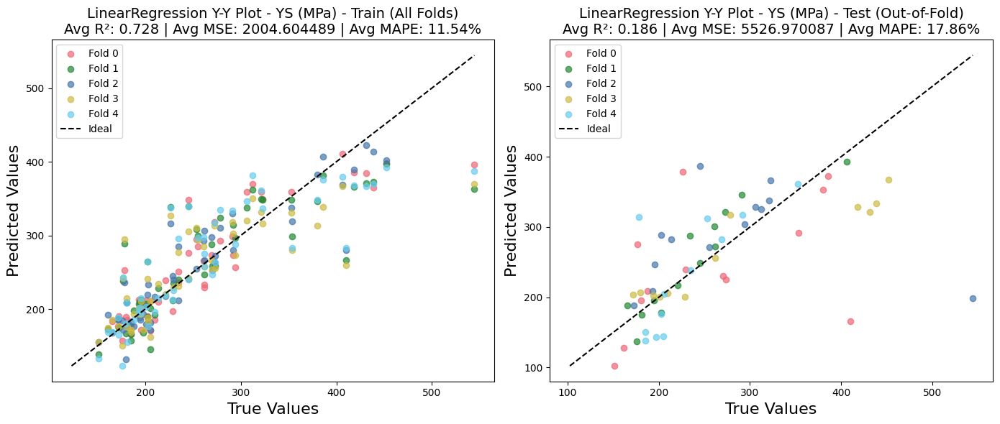

[I 2026-02-18 13:46:01,287] A new study created in memory with name: no-name-17ba78be-e734-4371-9199-7dbbfae4b48d



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 13:46:08,035] Trial 6 finished with values: [0.4825437900862354, 0.34758990896645364] and parameters: {'max_iter': 192, 'alpha_1': 4.723745022006122e-06, 'alpha_2': 6.882024852148867e-06, 'lambda_1': 4.0265933455262224e-07, 'lambda_2': 1.9221061924204117e-07}.
[I 2026-02-18 13:46:08,055] Trial 0 finished with values: [0.48254376791925574, 0.34758995291495715] and parameters: {'max_iter': 252, 'alpha_1': 2.4721234490812994e-07, 'alpha_2': 6.763971892261605e-07, 'lambda_1': 9.01499990140238e-07, 'lambda_2': 2.80834790688802e-06}.
[I 2026-02-18 13:46:08,088] Trial 14 finished with values: [0.4825437900862354, 0.34758990896645364] and parameters: {'max_iter': 259, 'alpha_1': 3.6507317112784415e-07, 'alpha_2': 3.74593766849327e-06, 'lambda_1': 6.995509662402241e-06, 'lambda_2': 6.797341613025681e-07}.
[I 2026-02-18 13:46:08,112] Trial 9 finished with values: [0.4825437900862354, 0.34758990896645364] and parameters: {'max_iter': 320, 'alpha_1': 3.7424802638687537e-06, 'alpha_2'

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_0.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.001 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models\BayesianRidge_YS (MPa)_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_1.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining

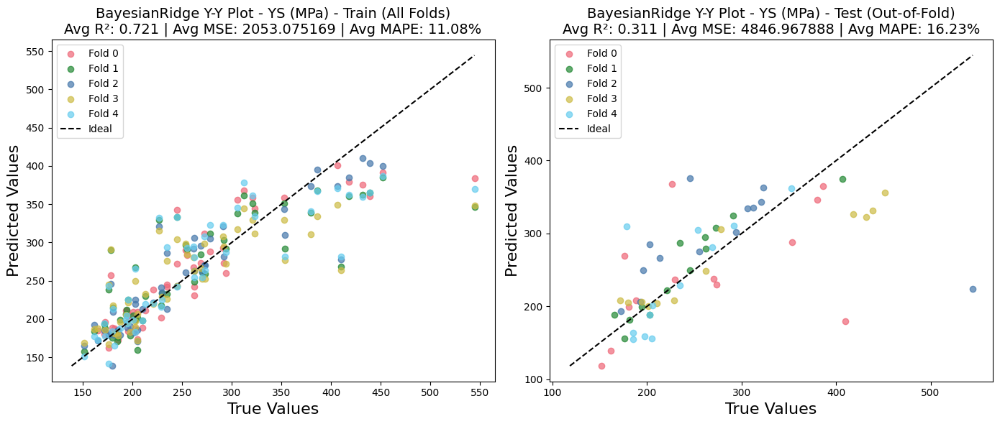

[I 2026-02-18 13:46:14,659] A new study created in memory with name: no-name-b7c84632-68ef-4c8e-855d-d026f6348f63



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 13:46:14,761] Trial 1 finished with values: [0.7468452984256662, -0.050025239496066166] and parameters: {'C': 34.02894597916557, 'gamma': 0.12273282409791376, 'epsilon': 0.12014398647922465}.
[I 2026-02-18 13:46:14,764] Trial 0 finished with values: [0.7256199268865364, 0.09096431642651034] and parameters: {'C': 2.871076603390199, 'gamma': 0.0008031527423988883, 'epsilon': 0.07563328240231405}.
[I 2026-02-18 13:46:14,796] Trial 3 finished with values: [1.2586603415121325, -0.9927442739888088] and parameters: {'C': 7711.345076731029, 'gamma': 0.00019877720303603365, 'epsilon': 0.10921656861661659}.
[I 2026-02-18 13:46:14,798] Trial 2 finished with values: [0.49170478992160715, 0.41277805390566263] and parameters: {'C': 38.461004934325175, 'gamma': 0.2679854914147446, 'epsilon': 0.2742377787959281}.
[I 2026-02-18 13:46:14,809] Trial 4 finished with values: [0.5718254591961047, 0.3121173393040494] and parameters: {'C': 54.98049173642858, 'gamma': 0.025202818825945758, 'epsil

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- SVR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
SVR_YS (MPa)_x_scaler_fold_0.pkl and SVR_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.001 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models\SVR_YS (MPa)_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
SVR_YS (MPa)_x_scaler_fold_1.pkl and SVR_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.000 seconds.
Saving mode

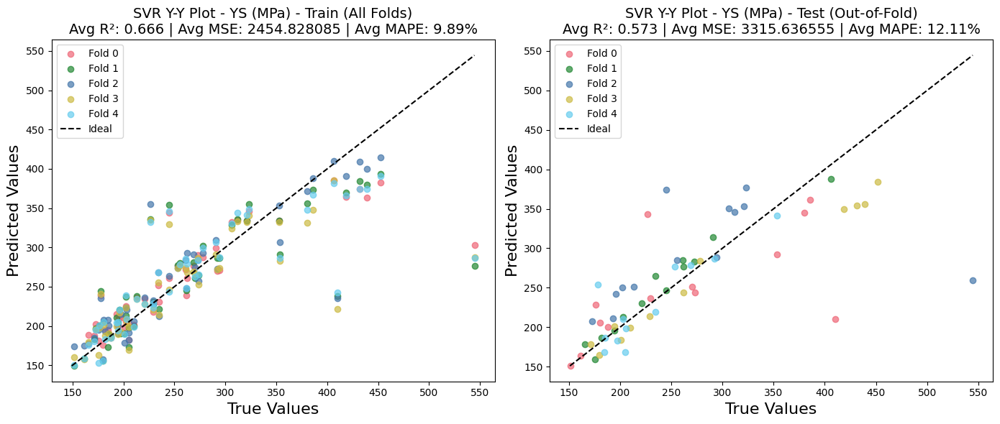

[I 2026-02-18 13:46:21,317] A new study created in memory with name: no-name-e823b2fe-2c94-4343-af48-dd907dab4fb0



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 13:46:21,603] Trial 1 finished with values: [0.5779069043911492, 0.31909463244387004] and parameters: {'max_depth': 46, 'min_samples_split': 5, 'min_samples_leaf': 12}.
[I 2026-02-18 13:46:21,603] Trial 2 finished with values: [0.573379925274884, 0.29568150107697033] and parameters: {'max_depth': 40, 'min_samples_split': 5, 'min_samples_leaf': 12}.
[I 2026-02-18 13:46:21,603] Trial 0 finished with values: [0.8068312101286678, -0.15628509001615307] and parameters: {'max_depth': 23, 'min_samples_split': 18, 'min_samples_leaf': 11}.
[I 2026-02-18 13:46:21,657] Trial 3 finished with values: [0.5056435999775989, 0.3730782853880202] and parameters: {'max_depth': 16, 'min_samples_split': 5, 'min_samples_leaf': 19}.
[I 2026-02-18 13:46:21,660] Trial 6 finished with values: [0.8387549336266404, -0.19169336162979939] and parameters: {'max_depth': 19, 'min_samples_split': 8, 'min_samples_leaf': 19}.
[I 2026-02-18 13:46:21,661] Trial 8 finished with values: [0.6502077436193574, 0.100

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
DecisionTree_YS (MPa)_x_scaler_fold_0.pkl and DecisionTree_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models\DecisionTree_YS (MPa)_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
DecisionTree_YS (MPa)_x_scaler_fold_1.pkl and DecisionTree_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final 

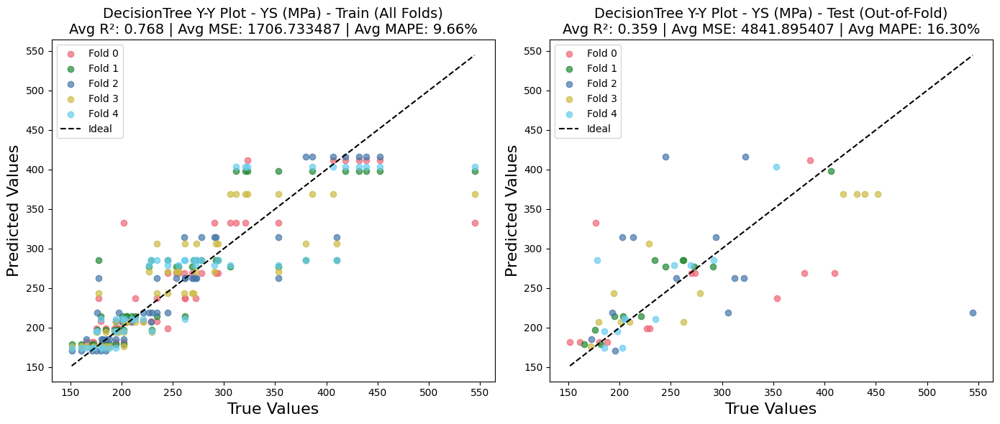

[I 2026-02-18 13:46:26,939] A new study created in memory with name: no-name-671478c6-7dcc-46ff-a3bc-2bfde2eff9d1



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 13:46:27,386] Trial 1 finished with values: [0.4359365717000772, 0.45077916058956313] and parameters: {'n_estimators': 116, 'max_depth': 20, 'min_samples_split': 13, 'min_samples_leaf': 3}.
[I 2026-02-18 13:46:27,412] Trial 0 finished with values: [0.4359365717000772, 0.45077916058956313] and parameters: {'n_estimators': 90, 'max_depth': 35, 'min_samples_split': 8, 'min_samples_leaf': 1}.
[I 2026-02-18 13:46:27,705] Trial 2 finished with values: [0.4692386905063257, 0.40343802773605386] and parameters: {'n_estimators': 114, 'max_depth': 22, 'min_samples_split': 17, 'min_samples_leaf': 3}.
[I 2026-02-18 13:46:27,961] Trial 5 finished with values: [0.4662952154912607, 0.39424869953804215] and parameters: {'n_estimators': 160, 'max_depth': 16, 'min_samples_split': 5, 'min_samples_leaf': 7}.
[I 2026-02-18 13:46:28,019] Trial 3 finished with values: [0.4772682120734538, 0.40042319880560023] and parameters: {'n_estimators': 116, 'max_depth': 39, 'min_samples_split': 12, 'min_sa

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- RandomForest - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
RandomForest_YS (MPa)_x_scaler_fold_0.pkl and RandomForest_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.094 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models\RandomForest_YS (MPa)_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
RandomForest_YS (MPa)_x_scaler_fold_1.pkl and RandomForest_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final 

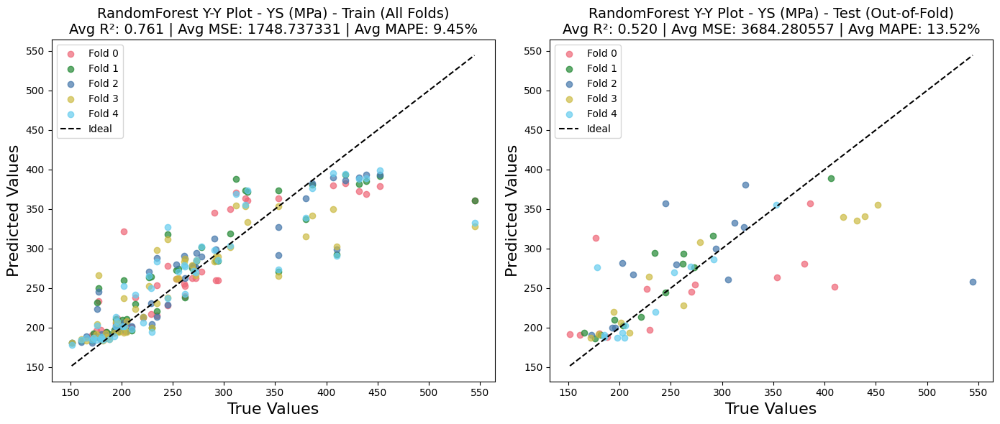

[I 2026-02-18 13:46:41,760] A new study created in memory with name: no-name-5a242958-81be-414e-941b-38b240e3aa43



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 13:46:43,039] Trial 3 finished with values: [0.7143360155310725, 0.05390376351112445] and parameters: {'n_estimators': 66, 'learning_rate': 0.032282626904444486, 'max_depth': 6, 'subsample': 0.654244838088976, 'colsample_bytree': 0.9000533181718153}.
[I 2026-02-18 13:46:43,116] Trial 5 finished with values: [0.6410630737199273, 0.11537955938029446] and parameters: {'n_estimators': 186, 'learning_rate': 0.1675052855457746, 'max_depth': 5, 'subsample': 0.7160695767405254, 'colsample_bytree': 0.6472353086182595}.
[I 2026-02-18 13:46:43,185] Trial 4 finished with values: [0.7486923514879763, -0.025584754545247845] and parameters: {'n_estimators': 107, 'learning_rate': 0.3169636573558504, 'max_depth': 6, 'subsample': 0.8738168250219576, 'colsample_bytree': 0.9573100576880557}.
[I 2026-02-18 13:46:43,228] Trial 2 finished with values: [0.7407242012598836, -0.04411450159748309] and parameters: {'n_estimators': 142, 'learning_rate': 0.013112225472183669, 'max_depth': 8, 'subsampl

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- XGBoost - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
XGBoost_YS (MPa)_x_scaler_fold_0.pkl and XGBoost_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.071 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models\XGBoost_YS (MPa)_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
XGBoost_YS (MPa)_x_scaler_fold_1.pkl and XGBoost_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model tra

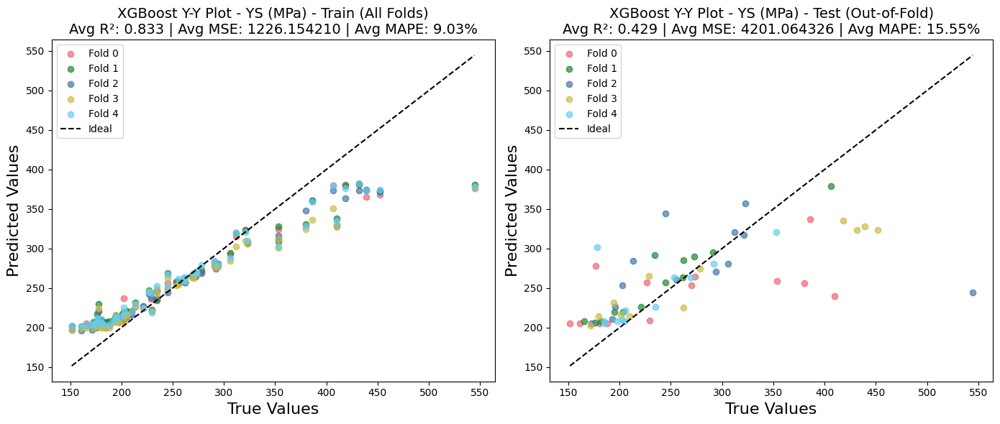

[I 2026-02-18 13:46:52,679] A new study created in memory with name: no-name-8a1946b5-d43d-419f-93e0-6c3c44aa3dbd



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 13:46:52,774] Trial 0 finished with values: [0.6967263857958444, 0.11654647044634225] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-18 13:46:52,860] Trial 1 finished with values: [0.5117402995782163, 0.3396908741563848] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-18 13:46:52,963] Trial 2 finished with values: [0.8480884484189699, -0.2173075174229114] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-18 13:46:53,048] Trial 3 finished with values: [0.8324691337954235, -0.19532718580837577] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-18 13:46:53,134] Trial 4 finished with values: [0.6967264895670642, 0.11654622363246547] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-18 13:46:53,276] Trial 5 finished with values: [0.6455490997753424, 0.10214144580630444] and parameters: {

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- GPR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
GPR_YS (MPa)_x_scaler_fold_0.pkl and GPR_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.073 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models\GPR_YS (MPa)_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
GPR_YS (MPa)_x_scaler_fold_1.pkl and GPR_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.079 seconds.
Saving mode

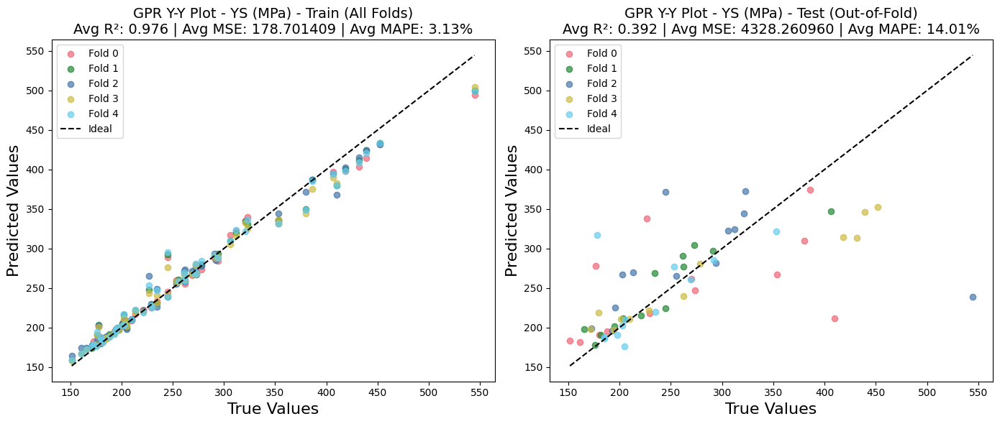

[I 2026-02-18 13:47:05,180] A new study created in memory with name: no-name-aec12fa8-93f6-434c-874f-121feccb81b8



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step
[I 2026-02-18 13:47:18,501] Trial 0 finished with values: [0.5781389496037969, 0.3644582156767088] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 41ms/step
[I 2026-02-18 13:47:28,354] Trial 1 finished with values: [0.8443737667796867, 0.0689346158051292] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 57ms/step
[I 2026-02-18 13:47:40,750] Trial 2 finished with values: [0.7866318255489368, 0.09692352344102369] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 42ms/step
[I 2026-02-18 13:47:52,198] Trial 3 finished with values: [0.7314033998776422, 0.26039456286982593] and parameters: {'hidden_layers': 2, 'units': 60, 'a

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\plots' directory.

--- NNR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
NNR_YS (MPa)_x_scaler_fold_0.pkl and NNR_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 2.081 seconds.
1/1 [==============================] - 0s 16ms/step
Saving model for NNR from Fold 0...
Best model for NNR for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models\NNR_YS (MPa)_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
NNR_YS (MPa)_x_scaler_fold_1.pkl and NNR_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1

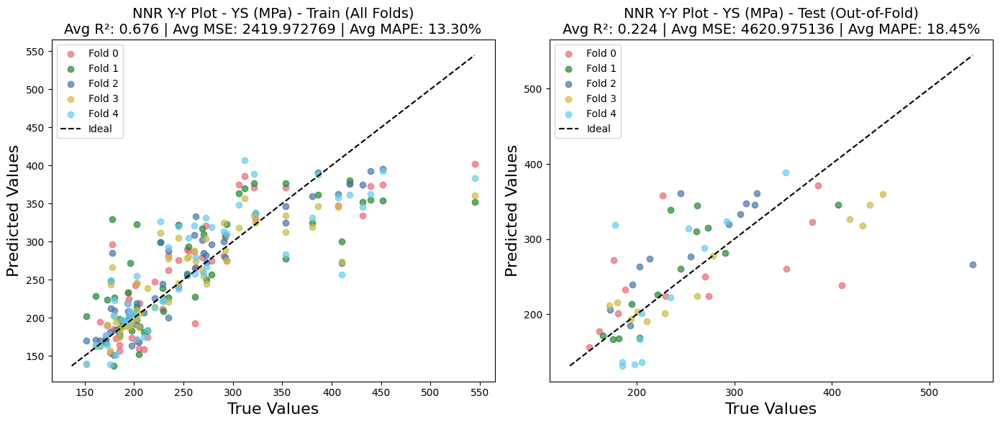


--- Workflow Complete ---
Final 5-fold CV results summary for YS (MPa) saved to Filtered_Comp_YS_MPa_Results_v3_5_Fold_CV\YS (MPa)_results_5_fold_CV.csv

============================== Completed Workflow for: YS (MPa) ==============================


============================== Processing Target: Hardness, HV ==============================
All outputs will be saved to: 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 

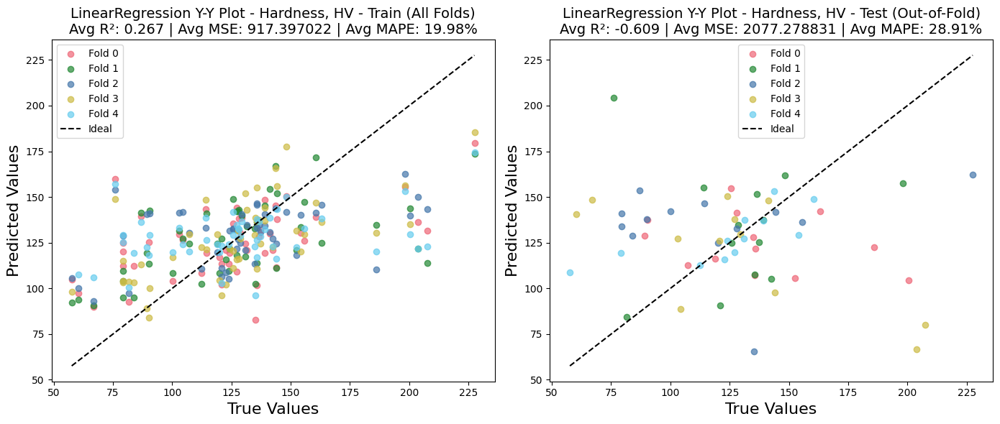

[I 2026-02-18 14:06:38,107] A new study created in memory with name: no-name-6044b1f9-2a1a-415c-965e-2e22bab5f4c6



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:06:43,573] Trial 1 finished with values: [1.6066588857987696, -2.044597313810677] and parameters: {'max_iter': 313, 'alpha_1': 5.652521199972724e-07, 'alpha_2': 3.556039442399366e-07, 'lambda_1': 9.701240813706513e-07, 'lambda_2': 2.268180137690845e-06}.
[I 2026-02-18 14:06:43,622] Trial 8 finished with values: [1.6066588857987696, -2.044597313810677] and parameters: {'max_iter': 349, 'alpha_1': 7.828379457750939e-07, 'alpha_2': 3.9109366764767014e-07, 'lambda_1': 7.341622425588711e-06, 'lambda_2': 9.845909187188653e-06}.
[I 2026-02-18 14:06:43,622] Trial 7 finished with values: [1.6066588857987696, -2.044597313810677] and parameters: {'max_iter': 210, 'alpha_1': 8.909252862070169e-06, 'alpha_2': 8.983179121127736e-07, 'lambda_1': 3.1965644725171965e-06, 'lambda_2': 1.5913397644878822e-06}.
[I 2026-02-18 14:06:43,651] Trial 6 finished with values: [1.6066588857987696, -2.044597313810677] and parameters: {'max_iter': 258, 'alpha_1': 1.4213968862715037e-07, 'alpha_2': 4.

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_0.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.002 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models\BayesianRidge_Hardness, HV_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_1.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hard

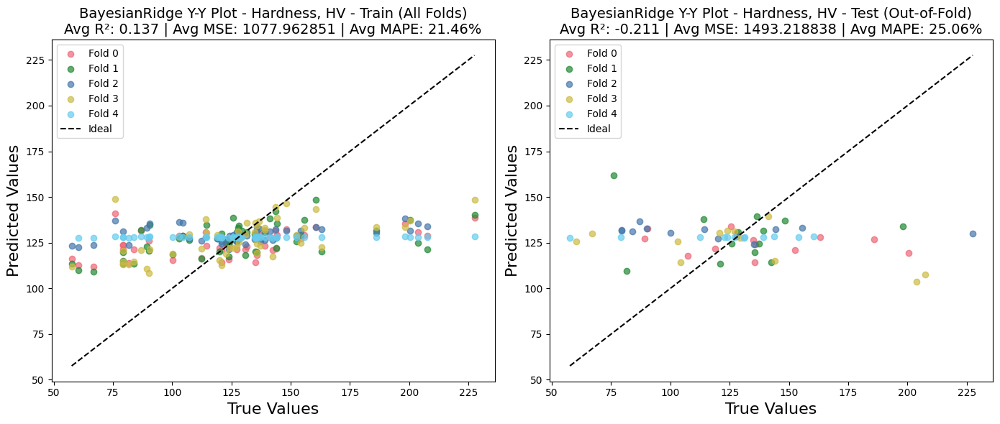

[I 2026-02-18 14:06:50,294] A new study created in memory with name: no-name-787565f2-ca71-4fef-99e8-ae500d83fc8f



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:06:50,409] Trial 0 finished with values: [1.426708841747128, -1.6473170909689159] and parameters: {'C': 1.6521101075200395, 'gamma': 0.11522669222802331, 'epsilon': 0.005015910901306497}.
[I 2026-02-18 14:06:50,424] Trial 1 finished with values: [1.2102484965114215, -1.2406163207795047] and parameters: {'C': 12.071149284532707, 'gamma': 0.010103909544562738, 'epsilon': 0.013979059319878234}.
[I 2026-02-18 14:06:50,455] Trial 2 finished with values: [1.7225993402983328, -2.2156797125331837] and parameters: {'C': 4.989116822194061, 'gamma': 0.26224097412664793, 'epsilon': 0.18787440274859118}.
[I 2026-02-18 14:06:50,458] Trial 3 finished with values: [2.187855399741001, -3.47602471437006] and parameters: {'C': 1174.925014599751, 'gamma': 0.26699522899637035, 'epsilon': 0.14855007198314835}.
[I 2026-02-18 14:06:50,476] Trial 4 finished with values: [2.187855399741001, -3.47602471437006] and parameters: {'C': 0.2652801484598134, 'gamma': 0.0019173961650646287, 'epsilon': 0

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- SVR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
SVR_Hardness, HV_x_scaler_fold_0.pkl and SVR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.001 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models\SVR_Hardness, HV_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
SVR_Hardness, HV_x_scaler_fold_1.pkl and SVR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model

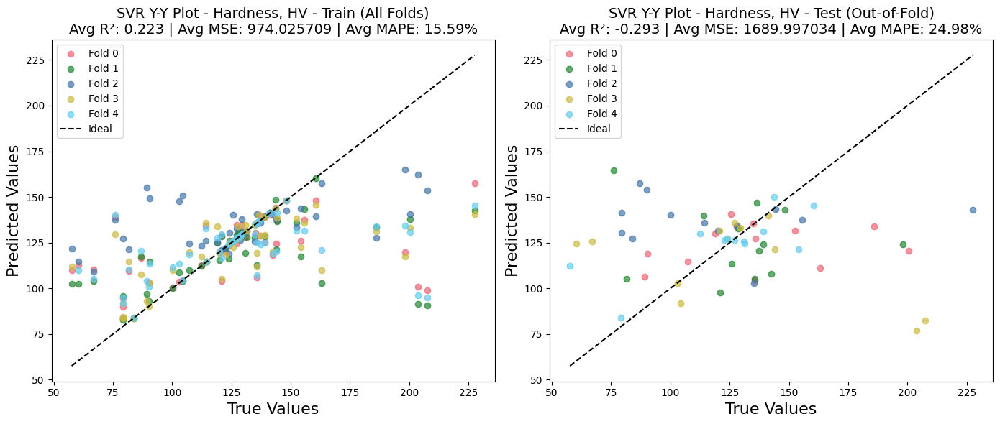

[I 2026-02-18 14:06:56,360] A new study created in memory with name: no-name-b4eaef40-2f81-466d-b32f-789034742da2



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:06:56,629] Trial 0 finished with values: [1.5999105067069892, -2.0117795693634886] and parameters: {'max_depth': 12, 'min_samples_split': 6, 'min_samples_leaf': 16}.
[I 2026-02-18 14:06:56,631] Trial 2 finished with values: [1.829185358495232, -2.4739836661239663] and parameters: {'max_depth': 26, 'min_samples_split': 7, 'min_samples_leaf': 5}.
[I 2026-02-18 14:06:56,632] Trial 1 finished with values: [1.628965375686186, -2.1088270503862825] and parameters: {'max_depth': 45, 'min_samples_split': 19, 'min_samples_leaf': 18}.
[I 2026-02-18 14:06:56,654] Trial 4 finished with values: [2.1090551543963545, -3.053046717861357] and parameters: {'max_depth': 23, 'min_samples_split': 5, 'min_samples_leaf': 11}.
[I 2026-02-18 14:06:56,690] Trial 3 finished with values: [1.6627191955236753, -2.1450458158391497] and parameters: {'max_depth': 22, 'min_samples_split': 8, 'min_samples_leaf': 3}.
[I 2026-02-18 14:06:56,718] Trial 16 finished with values: [1.829185358495232, -2.4739836

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
DecisionTree_Hardness, HV_x_scaler_fold_0.pkl and DecisionTree_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.002 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models\DecisionTree_Hardness, HV_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
DecisionTree_Hardness, HV_x_scaler_fold_1.pkl and DecisionTree_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Res

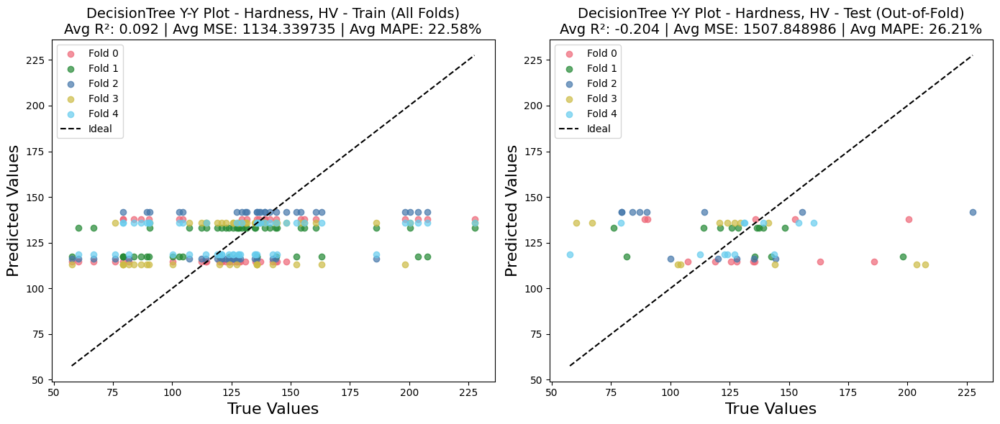

[I 2026-02-18 14:07:02,567] A new study created in memory with name: no-name-2c9e24ab-342b-4f93-a6fe-3df6c0f9a633



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:07:02,973] Trial 1 finished with values: [1.5051928272303965, -1.7952024377292068] and parameters: {'n_estimators': 177, 'max_depth': 33, 'min_samples_split': 15, 'min_samples_leaf': 10}.
[I 2026-02-18 14:07:03,090] Trial 2 finished with values: [1.6226500421959469, -1.9604136299721777] and parameters: {'n_estimators': 165, 'max_depth': 20, 'min_samples_split': 14, 'min_samples_leaf': 10}.
[I 2026-02-18 14:07:03,283] Trial 0 finished with values: [1.5148008739120826, -1.7970222821224102] and parameters: {'n_estimators': 165, 'max_depth': 5, 'min_samples_split': 3, 'min_samples_leaf': 9}.
[I 2026-02-18 14:07:03,404] Trial 3 finished with values: [1.6067407472614907, -1.9063176509146598] and parameters: {'n_estimators': 75, 'max_depth': 17, 'min_samples_split': 12, 'min_samples_leaf': 10}.
[I 2026-02-18 14:07:03,527] Trial 5 finished with values: [1.6067407472614907, -1.9063176509146598] and parameters: {'n_estimators': 70, 'max_depth': 48, 'min_samples_split': 5, 'min_s

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- RandomForest - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
RandomForest_Hardness, HV_x_scaler_fold_0.pkl and RandomForest_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.131 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models\RandomForest_Hardness, HV_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
RandomForest_Hardness, HV_x_scaler_fold_1.pkl and RandomForest_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Res

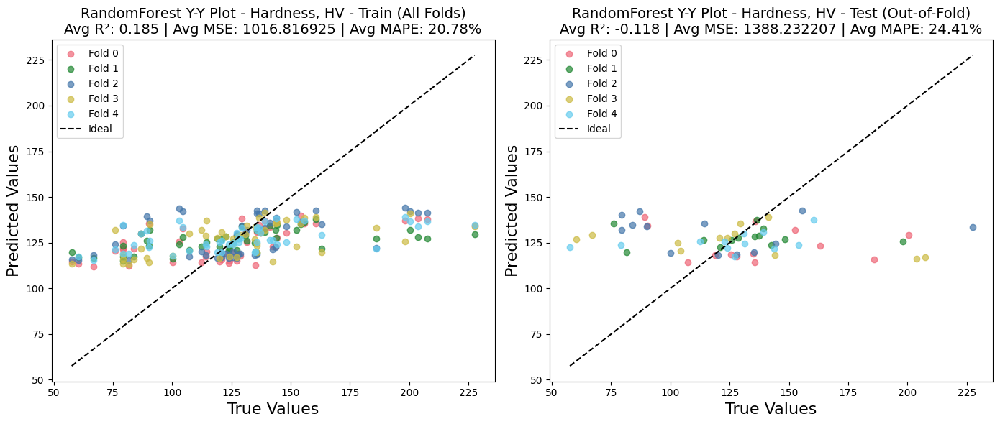

[I 2026-02-18 14:07:18,016] A new study created in memory with name: no-name-29922547-c7f3-4db6-aa19-8f53010ab93b



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:07:18,927] Trial 0 finished with values: [2.008566950080029, -2.9034834597018397] and parameters: {'n_estimators': 116, 'learning_rate': 0.29021700773277376, 'max_depth': 5, 'subsample': 0.6574602122253476, 'colsample_bytree': 0.7958589914603151}.
[I 2026-02-18 14:07:18,980] Trial 3 finished with values: [1.6000812473861763, -1.9601463879257062] and parameters: {'n_estimators': 142, 'learning_rate': 0.014128210157690583, 'max_depth': 5, 'subsample': 0.753120669200452, 'colsample_bytree': 0.9167326845136627}.
[I 2026-02-18 14:07:18,983] Trial 2 finished with values: [1.6000812473861763, -1.9601463879257062] and parameters: {'n_estimators': 114, 'learning_rate': 0.10949883689257316, 'max_depth': 6, 'subsample': 0.6223461559779074, 'colsample_bytree': 0.705851311747347}.
[I 2026-02-18 14:07:18,986] Trial 4 finished with values: [2.2862392543961554, -3.528738468396013] and parameters: {'n_estimators': 174, 'learning_rate': 0.038655240998046396, 'max_depth': 3, 'subsample':

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- XGBoost - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
XGBoost_Hardness, HV_x_scaler_fold_0.pkl and XGBoost_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.024 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models\XGBoost_Hardness, HV_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
XGBoost_Hardness, HV_x_scaler_fold_1.pkl and XGBoost_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model w

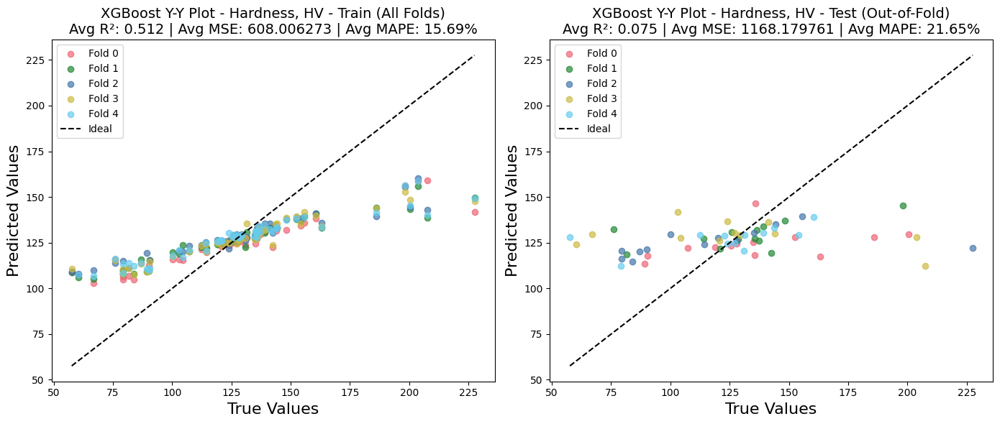

[I 2026-02-18 14:07:26,549] A new study created in memory with name: no-name-68367354-9092-4644-bf13-f5cc577754a5



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:07:26,665] Trial 0 finished with values: [1.2990833653162002, -1.3669995592275734] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-18 14:07:26,766] Trial 1 finished with values: [1.3433222741471949, -1.4563661578035052] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-18 14:07:26,891] Trial 2 finished with values: [0.9901618961060079, -0.8573081776948971] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-18 14:07:26,979] Trial 3 finished with values: [1.0019475026475484, -0.8851603206346919] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-18 14:07:27,059] Trial 4 finished with values: [1.2990833290415087, -1.3669995208045993] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-18 14:07:27,203] Trial 5 finished with values: [1.435926552641798, -1.5957788060191505] and parameters: {'

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- GPR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
GPR_Hardness, HV_x_scaler_fold_0.pkl and GPR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.082 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models\GPR_Hardness, HV_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
GPR_Hardness, HV_x_scaler_fold_1.pkl and GPR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model

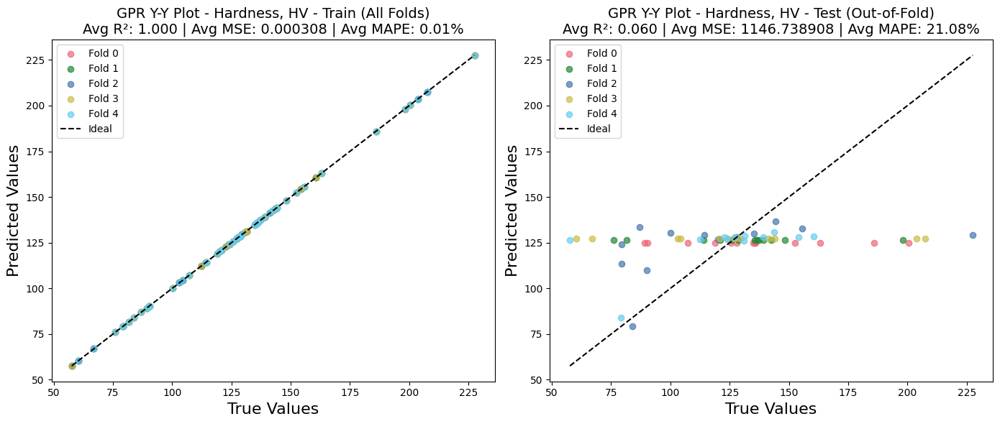

[I 2026-02-18 14:07:38,850] A new study created in memory with name: no-name-9b80b604-5658-419c-a63c-0518bc705043



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step
[I 2026-02-18 14:07:49,022] Trial 0 finished with values: [1.10438432582047, -0.11688473452408074] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 35ms/step
[I 2026-02-18 14:07:58,309] Trial 1 finished with values: [2.134815480092714, -1.2158377788198091] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 55ms/step
[I 2026-02-18 14:08:10,094] Trial 2 finished with values: [1.421596114794656, -0.3849815084837484] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 41ms/step
[I 2026-02-18 14:08:20,434] Trial 3 finished with values: [1.1678387002507689, -0.17951879861170686] and parameters: {'hidden_layers': 2, 'units': 60, 'a

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\plots' directory.

--- NNR - Step 2: 5-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/5 ---
Fitting scalers on Fold 1 training data...
NNR_Hardness, HV_x_scaler_fold_0.pkl and NNR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 1.890 seconds.
1/1 [==============================] - 0s 16ms/step
Saving model for NNR from Fold 0...
Best model for NNR for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models\NNR_Hardness, HV_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/5 ---
Fitting scalers on Fold 2 training data...
NNR_Hardness, HV_x_scaler_fold_1.pkl and NNR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\models'.
Retraining the fin

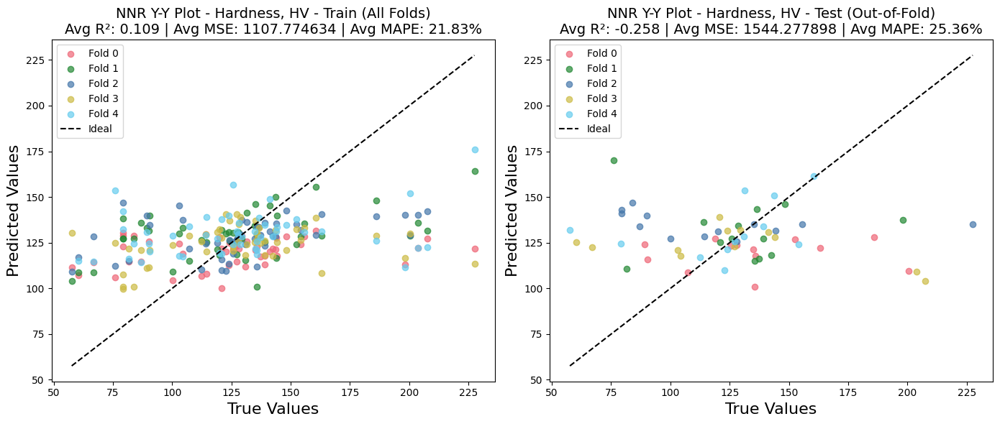


--- Workflow Complete ---
Final 5-fold CV results summary for Hardness, HV saved to Filtered_Comp_Hardness_HV_Results_v3_5_Fold_CV\Hardness, HV_results_5_fold_CV.csv

============================== Completed Workflow for: Hardness, HV ==============================


ALL WORKFLOWS COMPLETE.


In [16]:
print("\n" + "="*80)
print("STARTING ALL WORKFLOWS")
print("="*80 + "\n")

for target_name in target_cols:
    print(f"\n{'='*30} Processing Target: {target_name} {'='*30}")
    
    # Select the current target column as a 1D array
    y_current = y_cleaned[target_name].values 
    
    # Sanitize the target name to create a valid folder name
    # "YS (MPa)" -> "YS_MPa_Results_v3"
    # "Hardness, HV" -> "Hardness_HV_Results_v3"
    output_folder_name = target_name.replace(' ', '_').replace('(MPa)', 'MPa')
    output_folder_name = output_folder_name.replace(',', '').replace('/', '_')
    output_folder_name = f"Filtered_Comp_{output_folder_name}_Results_v3_5_Fold_CV"
    
    print(f"All outputs will be saved to: '{output_folder_name}' folder.")
    
    # Run the complete workflow from armote_cv.py
    run_workflow(
        X_cleaned, 
        y_current, 
        models_to_run, 
        param_spaces_to_run, 
        cv = 5,
        output_name=target_name,
        output_folder_name=output_folder_name,
        gpr_kernel_map=my_custom_kernels,
        nn_epochs=100,
        nn_batch_size=8,
        colors = ['#EE6677', '#228833', '#4477AA', '#CCBB44', '#66CCEE']
    )
    
    print(f"\n{'='*30} Completed Workflow for: {target_name} {'='*30}\n")

print("\n" + "="*80)
print("ALL WORKFLOWS COMPLETE.")
print("="*80)


STARTING ALL WORKFLOWS


============================== Processing Target: YS (MPa) ==============================
All outputs will be saved to: 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
LinearRegression_YS (MPa)_x_scaler_fold_0.pkl and LinearRegression_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 mode

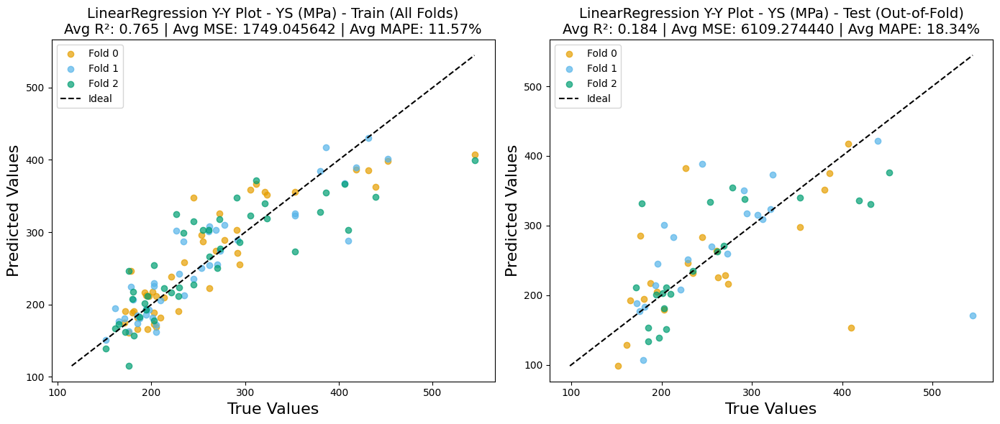

[I 2026-02-18 14:25:12,809] A new study created in memory with name: no-name-ce561583-bc54-45c2-9e27-b72ab1bf41d3



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:25:17,739] Trial 0 finished with values: [0.471642901414483, 0.44917497899839476] and parameters: {'max_iter': 106, 'alpha_1': 2.0085055405140558e-07, 'alpha_2': 7.33792118663862e-06, 'lambda_1': 8.920932209326401e-07, 'lambda_2': 2.8717609954215105e-07}.
[I 2026-02-18 14:25:17,773] Trial 7 finished with values: [0.47164006908667383, 0.44917832040251165] and parameters: {'max_iter': 171, 'alpha_1': 8.888437023551655e-07, 'alpha_2': 2.2750558281372297e-07, 'lambda_1': 6.955158230476477e-07, 'lambda_2': 1.962297290510507e-07}.
[I 2026-02-18 14:25:17,810] Trial 1 finished with values: [0.47164006908667383, 0.44917832040251165] and parameters: {'max_iter': 337, 'alpha_1': 1.980731074548978e-06, 'alpha_2': 1.6988889173871833e-06, 'lambda_1': 6.097182790613742e-06, 'lambda_2': 1.7917665969742693e-06}.
[I 2026-02-18 14:25:17,816] Trial 6 finished with values: [0.47164006908667383, 0.44917832040251165] and parameters: {'max_iter': 231, 'alpha_1': 3.9423578531374955e-06, 'alpha

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_0.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models\BayesianRidge_YS (MPa)_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_YS (MPa)_x_scaler_fold_1.pkl and BayesianRidge_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining

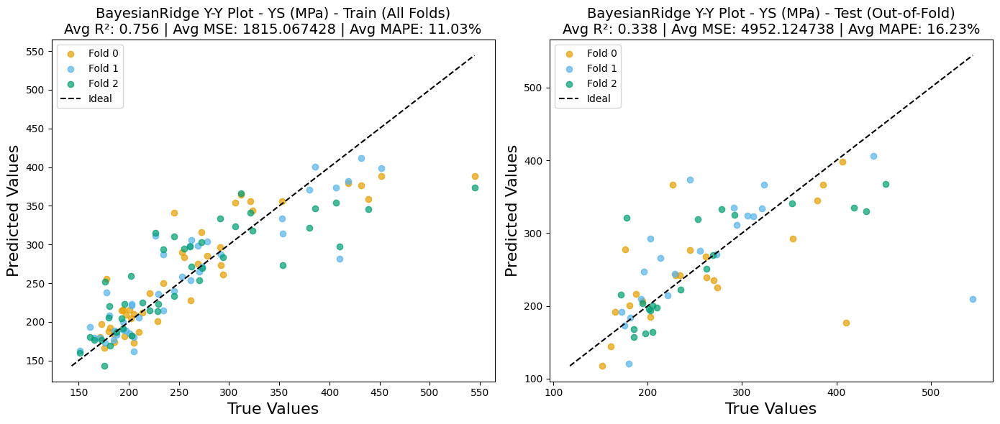

[I 2026-02-18 14:25:23,785] A new study created in memory with name: no-name-9409c4d6-ac32-4dd9-b201-2f2540815f97



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:25:23,888] Trial 0 finished with values: [0.4358663172277408, 0.49231325357303507] and parameters: {'C': 31.855035119507413, 'gamma': 0.0004231559920224964, 'epsilon': 0.22810941800832818}.
[I 2026-02-18 14:25:23,891] Trial 1 finished with values: [0.5179791900072648, 0.39497274862577075] and parameters: {'C': 16.166577139087718, 'gamma': 0.021329364753195416, 'epsilon': 0.014280085832745851}.
[I 2026-02-18 14:25:23,900] Trial 2 finished with values: [1.7694414482001946, -1.0891403669672148] and parameters: {'C': 766.6590273746474, 'gamma': 0.00021013310115465644, 'epsilon': 0.37743559005007066}.
[I 2026-02-18 14:25:23,936] Trial 5 finished with values: [0.6340909961932585, 0.26311042661245615] and parameters: {'C': 9332.09149635516, 'gamma': 0.03323799864647818, 'epsilon': 0.044027439758104386}.
[I 2026-02-18 14:25:23,936] Trial 6 finished with values: [1.33739903392581, -0.5538581693460264] and parameters: {'C': 0.3009761041661047, 'gamma': 0.1674041837172271, 'epsil

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- SVR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
SVR_YS (MPa)_x_scaler_fold_0.pkl and SVR_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.006 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models\SVR_YS (MPa)_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
SVR_YS (MPa)_x_scaler_fold_1.pkl and SVR_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.001 seconds.
Saving mode

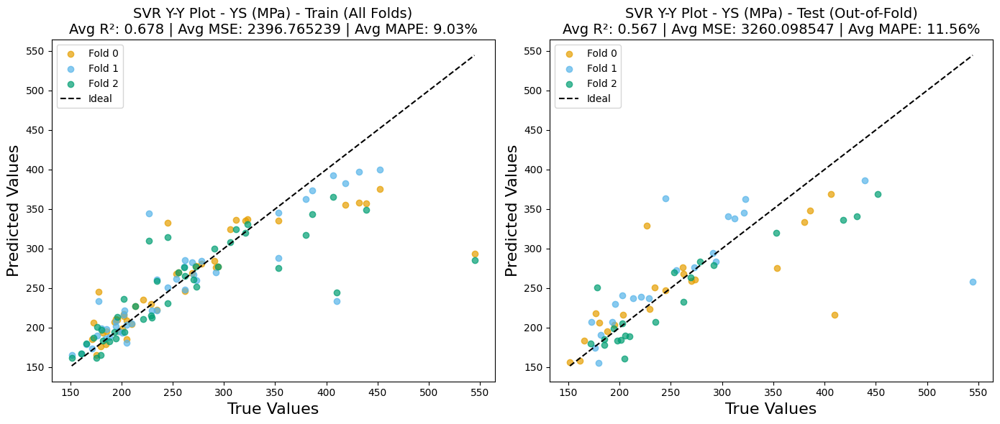

[I 2026-02-18 14:25:29,411] A new study created in memory with name: no-name-b313a6b8-a7d0-445d-afe5-fc8175016d5e



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:25:29,590] Trial 1 finished with values: [0.46859110096986295, 0.4556292889017452] and parameters: {'max_depth': 49, 'min_samples_split': 20, 'min_samples_leaf': 7}.
[I 2026-02-18 14:25:29,594] Trial 0 finished with values: [0.6862726505930631, 0.20036953214604267] and parameters: {'max_depth': 9, 'min_samples_split': 3, 'min_samples_leaf': 15}.
[I 2026-02-18 14:25:29,615] Trial 3 finished with values: [0.6749685040035266, 0.21573540314960934] and parameters: {'max_depth': 30, 'min_samples_split': 14, 'min_samples_leaf': 14}.
[I 2026-02-18 14:25:29,616] Trial 2 finished with values: [0.46859110096986295, 0.4556292889017452] and parameters: {'max_depth': 47, 'min_samples_split': 3, 'min_samples_leaf': 18}.
[I 2026-02-18 14:25:29,616] Trial 4 finished with values: [0.5049581803013408, 0.4188286783396063] and parameters: {'max_depth': 39, 'min_samples_split': 13, 'min_samples_leaf': 6}.
[I 2026-02-18 14:25:29,633] Trial 6 finished with values: [0.5049581803013408, 0.41882

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
DecisionTree_YS (MPa)_x_scaler_fold_0.pkl and DecisionTree_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models\DecisionTree_YS (MPa)_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
DecisionTree_YS (MPa)_x_scaler_fold_1.pkl and DecisionTree_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final 

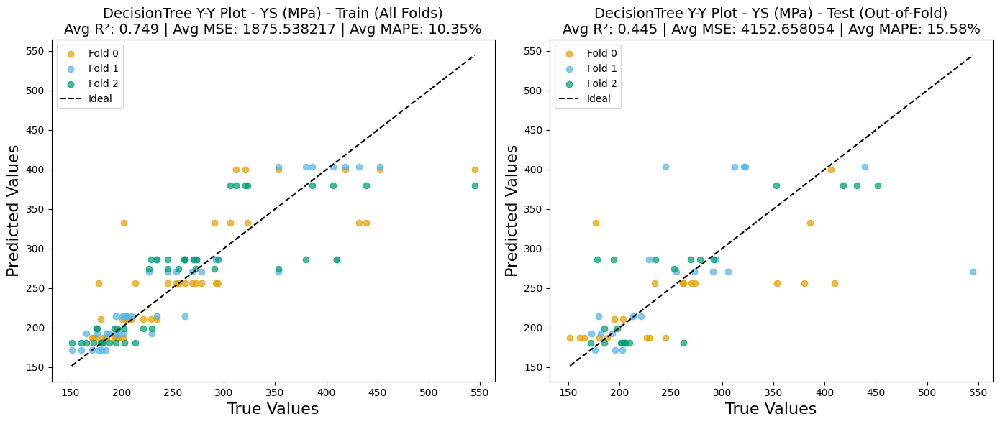

[I 2026-02-18 14:25:34,422] A new study created in memory with name: no-name-7678a3be-daf7-431a-9a04-35ae198106dd



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:25:34,694] Trial 0 finished with values: [0.45198640810375723, 0.47511366531236804] and parameters: {'n_estimators': 91, 'max_depth': 11, 'min_samples_split': 2, 'min_samples_leaf': 8}.
[I 2026-02-18 14:25:34,724] Trial 1 finished with values: [0.4978078611205306, 0.4179780214167082] and parameters: {'n_estimators': 129, 'max_depth': 34, 'min_samples_split': 7, 'min_samples_leaf': 7}.
[I 2026-02-18 14:25:34,815] Trial 2 finished with values: [0.4545800703486768, 0.47148468275670613] and parameters: {'n_estimators': 118, 'max_depth': 32, 'min_samples_split': 20, 'min_samples_leaf': 8}.
[I 2026-02-18 14:25:34,876] Trial 3 finished with values: [0.5154247780834685, 0.397627241497903] and parameters: {'n_estimators': 75, 'max_depth': 48, 'min_samples_split': 10, 'min_samples_leaf': 6}.
[I 2026-02-18 14:25:35,016] Trial 4 finished with values: [0.47021323577301716, 0.4519413762460367] and parameters: {'n_estimators': 86, 'max_depth': 48, 'min_samples_split': 15, 'min_sample

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- RandomForest - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
RandomForest_YS (MPa)_x_scaler_fold_0.pkl and RandomForest_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.129 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models\RandomForest_YS (MPa)_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
RandomForest_YS (MPa)_x_scaler_fold_1.pkl and RandomForest_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final 

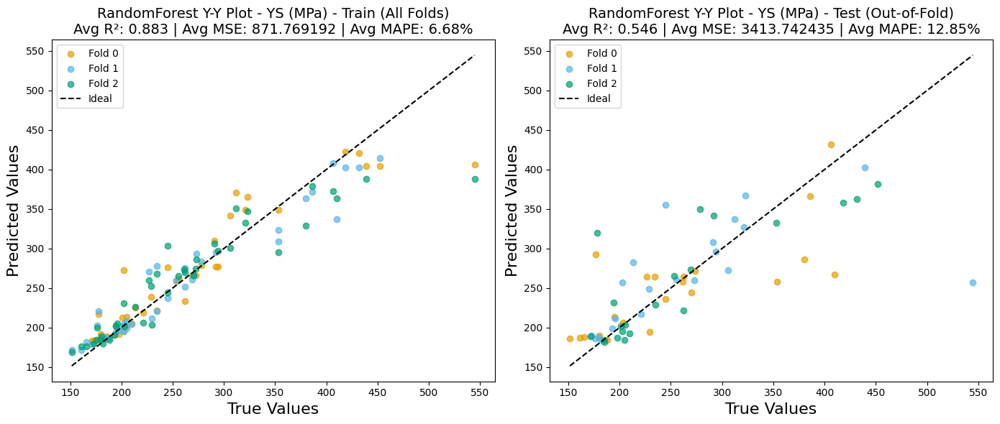

[I 2026-02-18 14:25:43,956] A new study created in memory with name: no-name-a05c42c9-6f8c-4908-aee4-e2c05d2ee50e



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:25:44,548] Trial 1 finished with values: [0.6104549928119947, 0.2781349872366713] and parameters: {'n_estimators': 79, 'learning_rate': 0.014889479172689598, 'max_depth': 8, 'subsample': 0.9860815506423789, 'colsample_bytree': 0.8747547909751676}.
[I 2026-02-18 14:25:44,619] Trial 9 finished with values: [0.636788877069035, 0.25043204656922446] and parameters: {'n_estimators': 106, 'learning_rate': 0.07269424474310549, 'max_depth': 8, 'subsample': 0.7027592998428722, 'colsample_bytree': 0.9282046279504483}.
[I 2026-02-18 14:25:44,638] Trial 8 finished with values: [0.636788877069035, 0.25043204656922446] and parameters: {'n_estimators': 79, 'learning_rate': 0.041429612047783865, 'max_depth': 4, 'subsample': 0.8207559299531921, 'colsample_bytree': 0.9558556521058028}.
[I 2026-02-18 14:25:44,670] Trial 11 finished with values: [0.636788877069035, 0.25043204656922446] and parameters: {'n_estimators': 190, 'learning_rate': 0.3998450334122384, 'max_depth': 3, 'subsample': 0

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- XGBoost - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
XGBoost_YS (MPa)_x_scaler_fold_0.pkl and XGBoost_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.043 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models\XGBoost_YS (MPa)_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
XGBoost_YS (MPa)_x_scaler_fold_1.pkl and XGBoost_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model tra

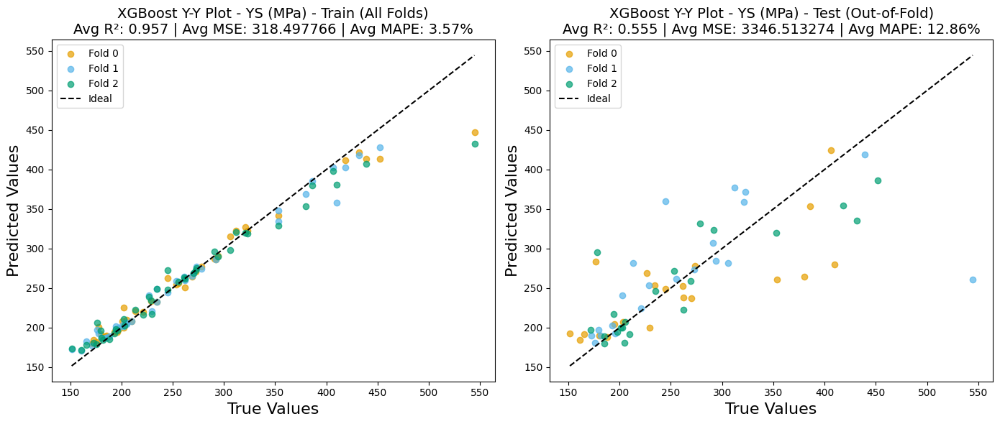

[I 2026-02-18 14:25:52,003] A new study created in memory with name: no-name-c9244a0b-664e-437d-82ea-8ee554b268e8



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:25:52,070] Trial 0 finished with values: [0.754152409010036, 0.13093071602846465] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-18 14:25:52,142] Trial 1 finished with values: [0.45929335002568256, 0.46639846193137685] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-18 14:25:52,203] Trial 2 finished with values: [0.765482158442529, 0.11735744130452337] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-18 14:25:52,276] Trial 3 finished with values: [0.7571059200068913, 0.12739234863307555] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-18 14:25:52,360] Trial 4 finished with values: [0.754152409055488, 0.1309307159740126] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-18 14:25:52,476] Trial 5 finished with values: [0.6320494856472213, 0.2668665453118781] and parameters: {'ker

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- GPR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
GPR_YS (MPa)_x_scaler_fold_0.pkl and GPR_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.070 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models\GPR_YS (MPa)_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
GPR_YS (MPa)_x_scaler_fold_1.pkl and GPR_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model training complete in 0.040 seconds.
Saving mode

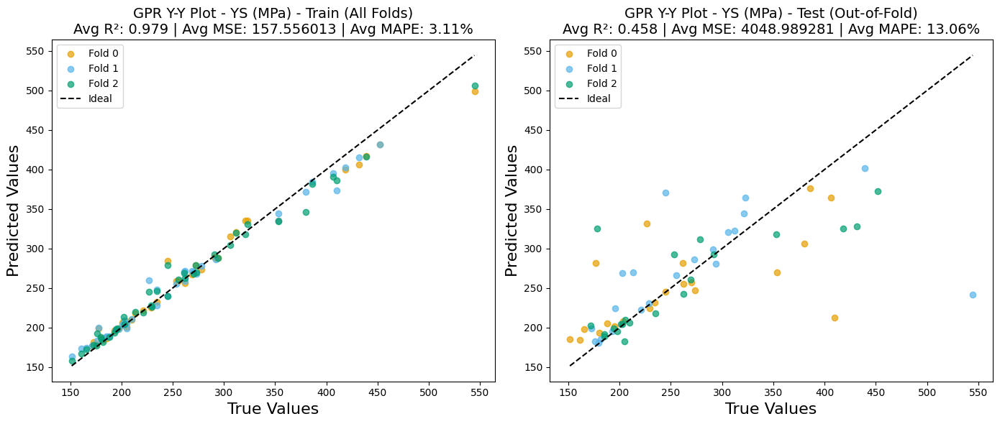

[I 2026-02-18 14:26:03,772] A new study created in memory with name: no-name-36ee3c89-c8cf-4282-be67-ba1c878ac35d



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step
[I 2026-02-18 14:26:09,229] Trial 0 finished with values: [0.490073720073839, 0.5116276892631232] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 33ms/step
[I 2026-02-18 14:26:14,222] Trial 1 finished with values: [0.8590984411005015, 0.14360113798643082] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 41ms/step
[I 2026-02-18 14:26:20,670] Trial 2 finished with values: [0.8604217602870489, 0.1406998456755938] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 46ms/step
[I 2026-02-18 14:26:25,975] Trial 3 finished with values: [0.5006269931758437, 0.5005349916492517] and parameters: {'hidden_layers': 2, 'units': 60, 'act

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for YS (MPa) saved as PNGs in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\plots' directory.

--- NNR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
NNR_YS (MPa)_x_scaler_fold_0.pkl and NNR_YS (MPa)_y_scaler_fold_0.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 1.800 seconds.
1/1 [==============================] - 0s 17ms/step
Saving model for NNR from Fold 0...
Best model for NNR for YS (MPa) (Fold 0) saved to: Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models\NNR_YS (MPa)_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
NNR_YS (MPa)_x_scaler_fold_1.pkl and NNR_YS (MPa)_y_scaler_fold_1.pkl saved in 'Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1

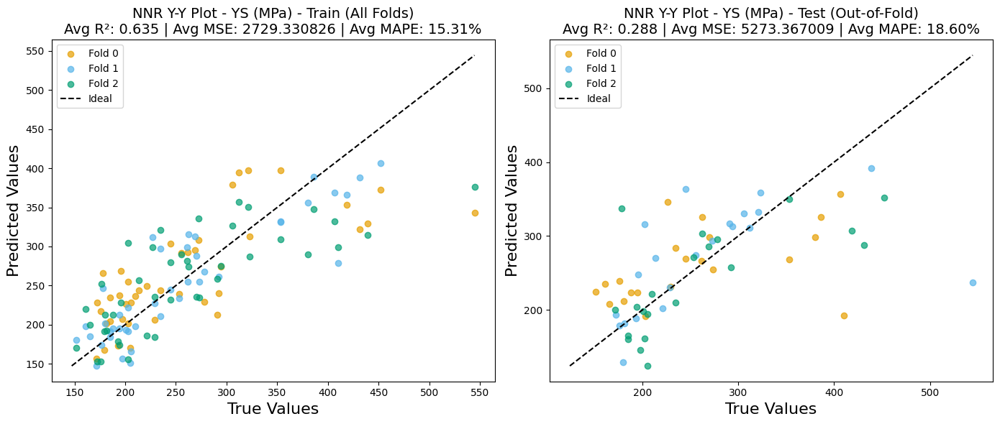


--- Workflow Complete ---
Final 3-fold CV results summary for YS (MPa) saved to Filtered_Comp_YS_MPa_Results_v3_3_Fold_CV\YS (MPa)_results_3_fold_CV.csv

============================== Completed Workflow for: YS (MPa) ==============================


============================== Processing Target: Hardness, HV ==============================
All outputs will be saved to: 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV' folder.
Initializing Pre-Optimization CV workflow for target: 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV'...
Setting up directories...

--- Starting Workflow for: LinearRegression ---

--- LinearRegression - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
No hyperparameters defined. Returning default settings.

--- LinearRegression - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- LinearRegression - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 

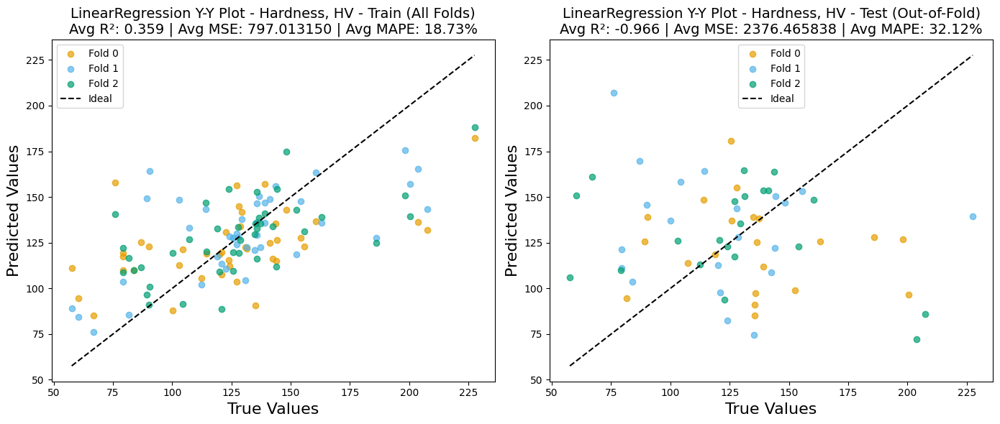

[I 2026-02-18 14:35:34,229] A new study created in memory with name: no-name-2a0917bd-1984-4429-934a-b5d379c4b94d



--- Starting Workflow for: BayesianRidge ---

--- BayesianRidge - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:35:38,741] Trial 0 finished with values: [2.289105422556276, -2.918740593055022] and parameters: {'max_iter': 225, 'alpha_1': 3.345460903555952e-06, 'alpha_2': 4.6444629922938973e-07, 'lambda_1': 9.344027797279753e-06, 'lambda_2': 1.9316176248924507e-06}.
[I 2026-02-18 14:35:38,788] Trial 1 finished with values: [2.289105181806534, -2.9187401558296] and parameters: {'max_iter': 322, 'alpha_1': 1.6991282395376944e-06, 'alpha_2': 2.2444431770075414e-06, 'lambda_1': 1.1063935383750886e-06, 'lambda_2': 3.139969997513052e-06}.
[I 2026-02-18 14:35:38,844] Trial 8 finished with values: [2.289102315999673, -2.918735199367919] and parameters: {'max_iter': 433, 'alpha_1': 6.428649473850765e-06, 'alpha_2': 1.152569153327414e-06, 'lambda_1': 2.489940615614076e-06, 'lambda_2': 1.5674537101168928e-07}.
[I 2026-02-18 14:35:38,850] Trial 2 finished with values: [2.289102315999673, -2.918735199367919] and parameters: {'max_iter': 205, 'alpha_1': 1.8662023739173605e-06, 'alpha_2': 9.037

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for BayesianRidge for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- BayesianRidge - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- BayesianRidge - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_0.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.003 seconds.
Saving model for BayesianRidge from Fold 0...
Best model for BayesianRidge for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models\BayesianRidge_Hardness, HV_best_model_fold_0.pkl

--- BayesianRidge - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
BayesianRidge_Hardness, HV_x_scaler_fold_1.pkl and BayesianRidge_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hard

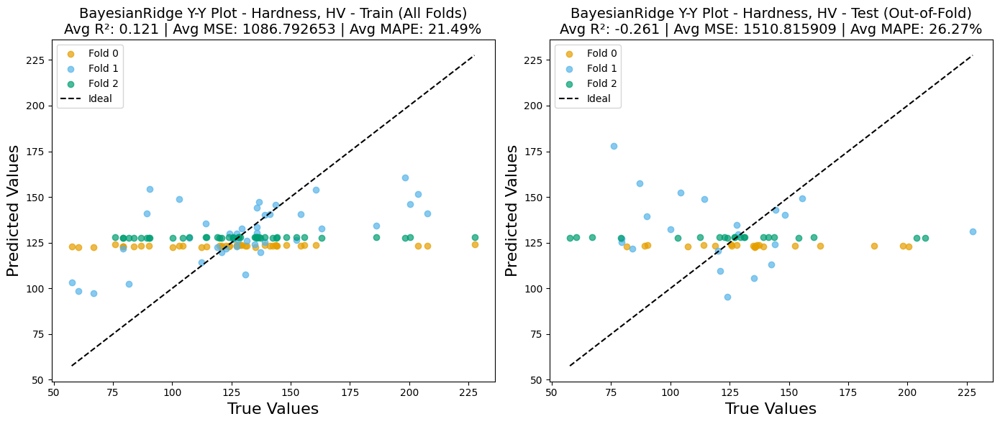

[I 2026-02-18 14:35:44,825] A new study created in memory with name: no-name-d034f8b6-00f1-4bf9-8fdb-98d55f008d93



--- Starting Workflow for: SVR ---

--- SVR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:35:44,915] Trial 0 finished with values: [2.5015019841560644, -3.306627158235864] and parameters: {'C': 4893.90294785072, 'gamma': 0.0003436372015603319, 'epsilon': 0.043204324332685694}.
[I 2026-02-18 14:35:44,917] Trial 1 finished with values: [4.044240494666794, -6.800281781916048] and parameters: {'C': 0.4993370014559277, 'gamma': 0.20180197088831925, 'epsilon': 0.0016292664331073018}.
[I 2026-02-18 14:35:44,917] Trial 2 finished with values: [2.4176665601934255, -3.172741111977229] and parameters: {'C': 27.389661072857802, 'gamma': 0.17670861578415997, 'epsilon': 0.2808139017767236}.
[I 2026-02-18 14:35:44,934] Trial 3 finished with values: [2.5231653012787993, -3.3834557669889187] and parameters: {'C': 3636.9237745678915, 'gamma': 0.03363008985946784, 'epsilon': 0.00425493895349846}.
[I 2026-02-18 14:35:44,963] Trial 8 finished with values: [2.68709744984498, -3.697467962884312] and parameters: {'C': 1.5803754880943048, 'gamma': 0.0006939114942405816, 'epsilon': 

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for SVR for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- SVR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- SVR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
SVR_Hardness, HV_x_scaler_fold_0.pkl and SVR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.000 seconds.
Saving model for SVR from Fold 0...
Best model for SVR for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models\SVR_Hardness, HV_best_model_fold_0.pkl

--- SVR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
SVR_Hardness, HV_x_scaler_fold_1.pkl and SVR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model

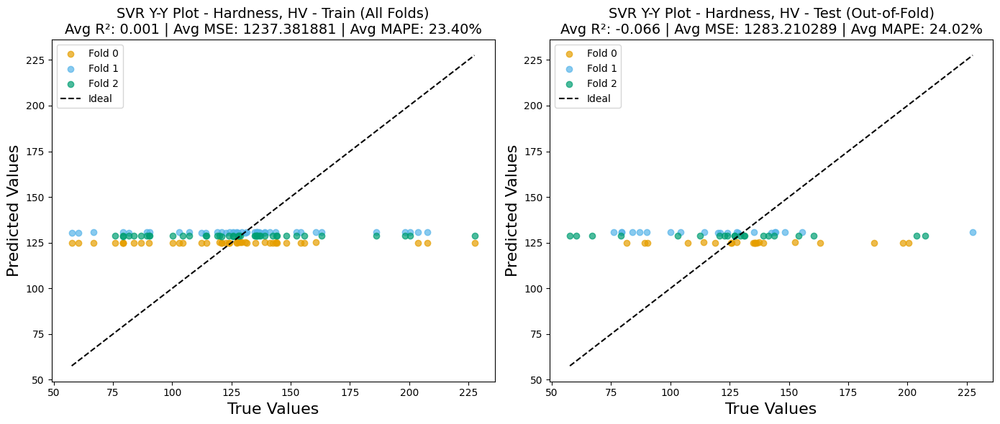

[I 2026-02-18 14:35:50,251] A new study created in memory with name: no-name-0042bb51-f0b0-4eb0-9534-c8577ed792de



--- Starting Workflow for: DecisionTree ---

--- DecisionTree - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:35:50,346] Trial 0 finished with values: [2.881549967701021, -3.9588864244815647] and parameters: {'max_depth': 23, 'min_samples_split': 14, 'min_samples_leaf': 9}.
[I 2026-02-18 14:35:50,414] Trial 6 finished with values: [3.0978392468506506, -4.54424357935138] and parameters: {'max_depth': 19, 'min_samples_split': 18, 'min_samples_leaf': 16}.
[I 2026-02-18 14:35:50,426] Trial 9 finished with values: [3.3456849795782033, -4.835690475970037] and parameters: {'max_depth': 46, 'min_samples_split': 19, 'min_samples_leaf': 4}.
[I 2026-02-18 14:35:50,433] Trial 7 finished with values: [3.3456849795782033, -4.835690475970037] and parameters: {'max_depth': 22, 'min_samples_split': 3, 'min_samples_leaf': 1}.
[I 2026-02-18 14:35:50,435] Trial 8 finished with values: [3.3456849795782033, -4.835690475970037] and parameters: {'max_depth': 22, 'min_samples_split': 20, 'min_samples_leaf': 4}.
[I 2026-02-18 14:35:50,504] Trial 10 finished with values: [3.3456849795782033, -4.83569047

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for DecisionTree for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- DecisionTree - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- DecisionTree - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
DecisionTree_Hardness, HV_x_scaler_fold_0.pkl and DecisionTree_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.001 seconds.
Saving model for DecisionTree from Fold 0...
Best model for DecisionTree for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models\DecisionTree_Hardness, HV_best_model_fold_0.pkl

--- DecisionTree - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
DecisionTree_Hardness, HV_x_scaler_fold_1.pkl and DecisionTree_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Res

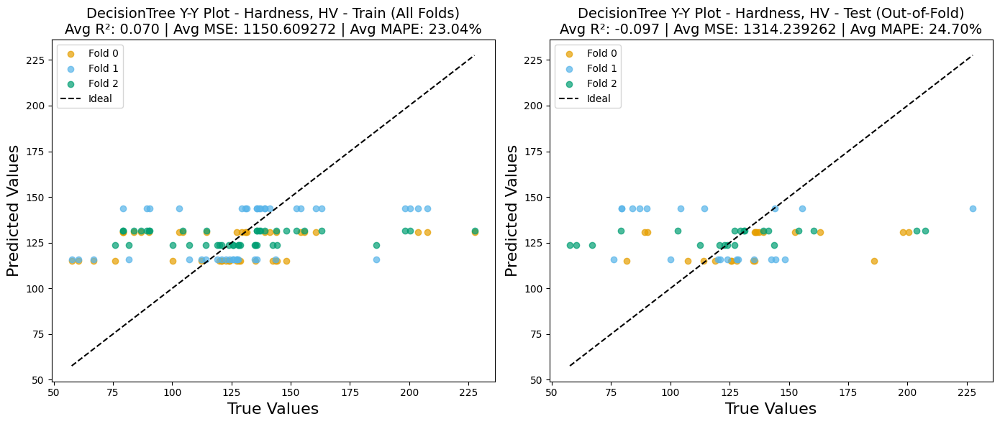

[I 2026-02-18 14:35:54,993] A new study created in memory with name: no-name-79550fbd-532c-48a9-86dc-9200fe450577



--- Starting Workflow for: RandomForest ---

--- RandomForest - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:35:55,224] Trial 1 finished with values: [2.0216845734024926, -2.3745144588471723] and parameters: {'n_estimators': 109, 'max_depth': 25, 'min_samples_split': 15, 'min_samples_leaf': 1}.
[I 2026-02-18 14:35:55,351] Trial 3 finished with values: [2.2491683083388496, -2.8977662081502555] and parameters: {'n_estimators': 193, 'max_depth': 45, 'min_samples_split': 8, 'min_samples_leaf': 10}.
[I 2026-02-18 14:35:55,449] Trial 0 finished with values: [2.907118624434435, -4.259088210423755] and parameters: {'n_estimators': 183, 'max_depth': 9, 'min_samples_split': 3, 'min_samples_leaf': 1}.
[I 2026-02-18 14:35:55,454] Trial 2 finished with values: [2.0403426155038247, -2.460014279075192] and parameters: {'n_estimators': 76, 'max_depth': 44, 'min_samples_split': 9, 'min_samples_leaf': 9}.
[I 2026-02-18 14:35:55,485] Trial 5 finished with values: [2.168583444143942, -2.705472676853876] and parameters: {'n_estimators': 172, 'max_depth': 24, 'min_samples_split': 3, 'min_samples_l

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for RandomForest for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- RandomForest - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- RandomForest - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
RandomForest_Hardness, HV_x_scaler_fold_0.pkl and RandomForest_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.133 seconds.
Saving model for RandomForest from Fold 0...
Best model for RandomForest for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models\RandomForest_Hardness, HV_best_model_fold_0.pkl

--- RandomForest - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
RandomForest_Hardness, HV_x_scaler_fold_1.pkl and RandomForest_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Res

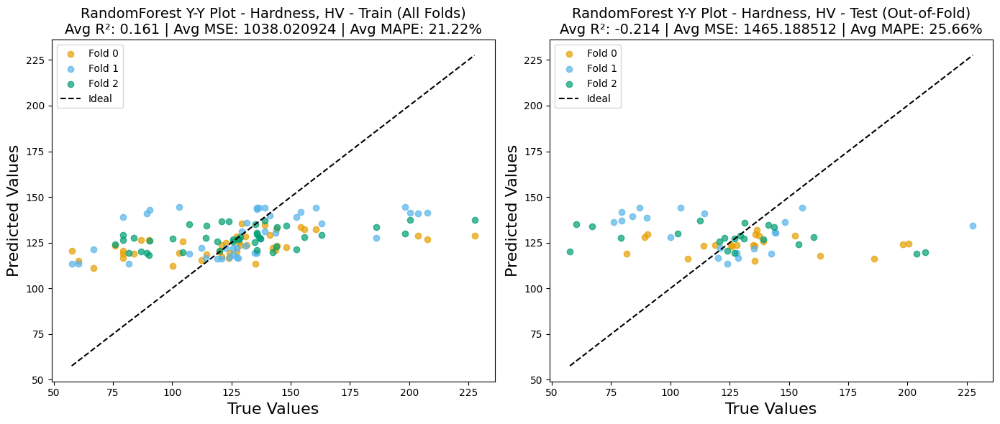

[I 2026-02-18 14:36:05,684] A new study created in memory with name: no-name-152b5cd6-7e97-4a30-9301-273a8ae211e7



--- Starting Workflow for: XGBoost ---

--- XGBoost - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:36:06,477] Trial 0 finished with values: [3.219902197082852, -4.748238972870589] and parameters: {'n_estimators': 155, 'learning_rate': 0.010360542734840833, 'max_depth': 8, 'subsample': 0.9215959868439894, 'colsample_bytree': 0.9640956351897992}.
[I 2026-02-18 14:36:06,564] Trial 6 finished with values: [2.6541877790803334, -3.691805860730209] and parameters: {'n_estimators': 106, 'learning_rate': 0.23019044288858745, 'max_depth': 9, 'subsample': 0.99876961640582, 'colsample_bytree': 0.6828911572297397}.
[I 2026-02-18 14:36:06,600] Trial 8 finished with values: [2.6541877790803334, -3.691805860730209] and parameters: {'n_estimators': 197, 'learning_rate': 0.20969594540302167, 'max_depth': 7, 'subsample': 0.9976408339137188, 'colsample_bytree': 0.6747684921978772}.
[I 2026-02-18 14:36:06,649] Trial 9 finished with values: [2.6541877790803334, -3.691805860730209] and parameters: {'n_estimators': 63, 'learning_rate': 0.11859683851842294, 'max_depth': 7, 'subsample': 0.76

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for XGBoost for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- XGBoost - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- XGBoost - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
XGBoost_Hardness, HV_x_scaler_fold_0.pkl and XGBoost_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.036 seconds.
Saving model for XGBoost from Fold 0...
Best model for XGBoost for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models\XGBoost_Hardness, HV_best_model_fold_0.pkl

--- XGBoost - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
XGBoost_Hardness, HV_x_scaler_fold_1.pkl and XGBoost_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model w

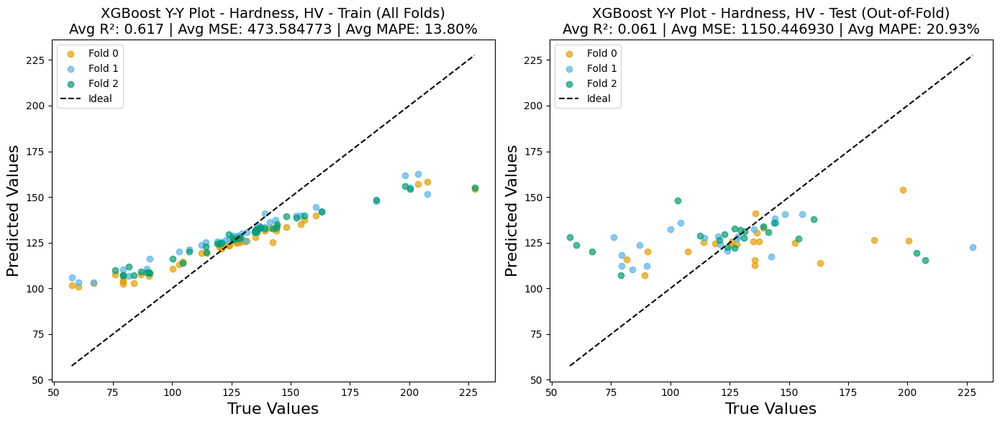

[I 2026-02-18 14:36:13,891] A new study created in memory with name: no-name-e95aa840-2537-43a0-bc38-ea235443eb44



--- Starting Workflow for: GPR ---

--- GPR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for GaussianProcessRegressor to manage high memory usage.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-02-18 14:36:13,982] Trial 0 finished with values: [2.1592377700268828, -2.666043933076482] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.534840766433346e-09}.
[I 2026-02-18 14:36:14,048] Trial 1 finished with values: [2.154863137540976, -2.6601397974019174] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 0.05360294728728273}.
[I 2026-02-18 14:36:14,116] Trial 2 finished with values: [1.9551842360214629, -2.384594075991597] and parameters: {'kernel': 'RBF_default', 'alpha': 5.282115394532298e-06}.
[I 2026-02-18 14:36:14,188] Trial 3 finished with values: [2.013020714089261, -2.4889174932248093] and parameters: {'kernel': 'Matern_nu_1.5', 'alpha': 1.9826980964985952e-07}.
[I 2026-02-18 14:36:14,261] Trial 4 finished with values: [2.15923774014902, -2.6660438871084104] and parameters: {'kernel': 'Matern_nu_0.5', 'alpha': 2.6185068507773743e-10}.
[I 2026-02-18 14:36:14,364] Trial 5 finished with values: [2.276492878148991, -2.832753693783744] and parameters: {'kernel'

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for GPR for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- GPR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- GPR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
GPR_Hardness, HV_x_scaler_fold_0.pkl and GPR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 0.080 seconds.
Saving model for GPR from Fold 0...
Best model for GPR for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models\GPR_Hardness, HV_best_model_fold_0.pkl

--- GPR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
GPR_Hardness, HV_x_scaler_fold_1.pkl and GPR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 1 model

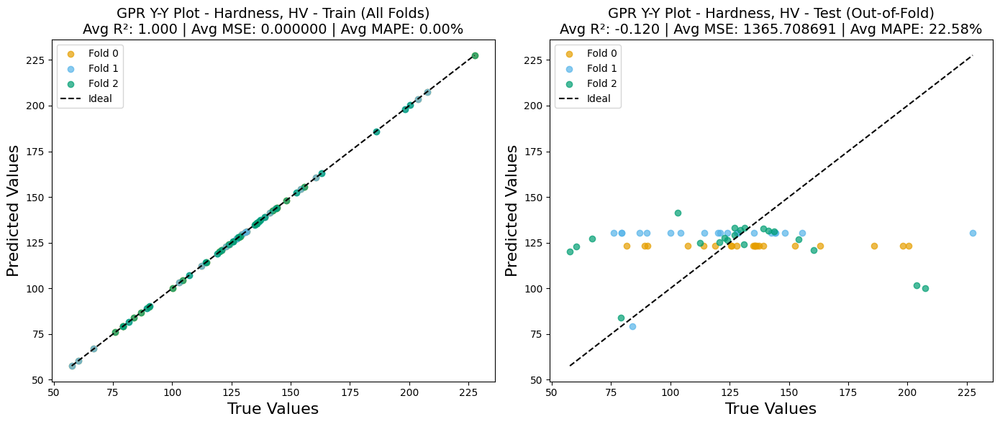

[I 2026-02-18 14:36:25,722] A new study created in memory with name: no-name-539d47bb-02bb-4035-a187-5a4191c7c0d9



--- Starting Workflow for: NNR ---

--- NNR - Step 1: Finding Best Hyperparameters (on 100% data) ---
Scalers (fit on 100% data) saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Using n_jobs=1 for Neural Network to ensure GPU stability.


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step
[I 2026-02-18 14:36:31,298] Trial 0 finished with values: [1.3039815192090105, -0.3522372745840543] and parameters: {'hidden_layers': 2, 'units': 124, 'activation': 'relu', 'learning_rate': 2.9375384576328295e-05}.
1/1 [==============================] - 0s 36ms/step
[I 2026-02-18 14:36:36,253] Trial 1 finished with values: [2.291496373273849, -1.411262857790047] and parameters: {'hidden_layers': 1, 'units': 116, 'activation': 'tanh', 'learning_rate': 0.008123245085588688}.
1/1 [==============================] - 0s 53ms/step
[I 2026-02-18 14:36:42,582] Trial 2 finished with values: [1.6502725549616428, -0.7075206185907655] and parameters: {'hidden_layers': 4, 'units': 52, 'activation': 'selu', 'learning_rate': 0.00037520558551242813}.
1/1 [==============================] - 0s 43ms/step
[I 2026-02-18 14:36:48,086] Trial 3 finished with values: [1.2096675531817356, -0.2625207286164177] and parameters: {'hidden_layers': 2, 'units': 60, 'a

c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:283: ExperimentalWarning: optuna.visualization.matplotlib._pareto_front.plot_pareto_front is experimental (supported from v2.8.0). The interface can change in the future.
  ax = vis.plot_pareto_front(study, target_names=["MSE", "R-squared"])
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:290: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:299: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  ax = vis.plot_optimization_history(
c:\Users\shakt\Documents\gitrepo\Grain-size-YS-HV-ARMOTE-CV\armote_cv.py:308: Experimenta

Optuna plots for NNR for Hardness, HV saved as PNGs in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\plots' directory.

--- NNR - Step 2: 3-Fold CV Final Evaluation (using best params) ---

--- NNR - Evaluation Fold 1/3 ---
Fitting scalers on Fold 1 training data...
NNR_Hardness, HV_x_scaler_fold_0.pkl and NNR_Hardness, HV_y_scaler_fold_0.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the final model with the best hyperparameters...
Fold 0 model training complete in 1.950 seconds.
1/1 [==============================] - 0s 16ms/step
Saving model for NNR from Fold 0...
Best model for NNR for Hardness, HV (Fold 0) saved to: Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models\NNR_Hardness, HV_best_model_fold_0.keras

--- NNR - Evaluation Fold 2/3 ---
Fitting scalers on Fold 2 training data...
NNR_Hardness, HV_x_scaler_fold_1.pkl and NNR_Hardness, HV_y_scaler_fold_1.pkl saved in 'Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\models'.
Retraining the fin

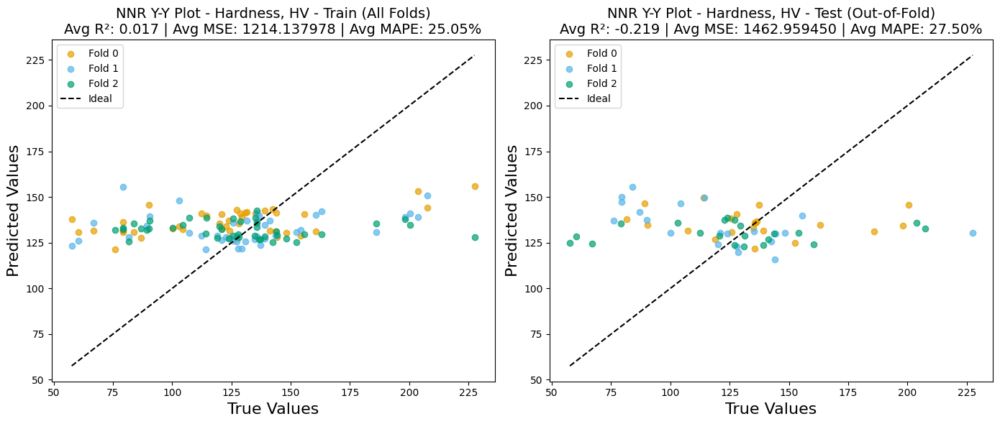


--- Workflow Complete ---
Final 3-fold CV results summary for Hardness, HV saved to Filtered_Comp_Hardness_HV_Results_v3_3_Fold_CV\Hardness, HV_results_3_fold_CV.csv

============================== Completed Workflow for: Hardness, HV ==============================


ALL WORKFLOWS COMPLETE.


In [17]:
print("\n" + "="*80)
print("STARTING ALL WORKFLOWS")
print("="*80 + "\n")

for target_name in target_cols:
    print(f"\n{'='*30} Processing Target: {target_name} {'='*30}")
    
    # Select the current target column as a 1D array
    y_current = y_cleaned[target_name].values 
    
    # Sanitize the target name to create a valid folder name
    # "YS (MPa)" -> "YS_MPa_Results_v3"
    # "Hardness, HV" -> "Hardness_HV_Results_v3"
    output_folder_name = target_name.replace(' ', '_').replace('(MPa)', 'MPa')
    output_folder_name = output_folder_name.replace(',', '').replace('/', '_')
    output_folder_name = f"Filtered_Comp_{output_folder_name}_Results_v3_3_Fold_CV"
    
    print(f"All outputs will be saved to: '{output_folder_name}' folder.")
    
    # Run the complete workflow from armote_cv.py
    run_workflow(
        X_cleaned, 
        y_current, 
        models_to_run, 
        param_spaces_to_run, 
        cv = 3,
        output_name=target_name,
        output_folder_name=output_folder_name,
        gpr_kernel_map=my_custom_kernels,
        nn_epochs=100,
        nn_batch_size=8,
        colors = ["#E69F00", "#56B4E9", "#009E73"]
    )
    
    print(f"\n{'='*30} Completed Workflow for: {target_name} {'='*30}\n")

print("\n" + "="*80)
print("ALL WORKFLOWS COMPLETE.")
print("="*80)